<a href="https://colab.research.google.com/github/AndreiAf02/Transfer_Learning_Fine_Tuning_Update/blob/main/Credit_Default_Fine_Tuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Credit Default: Predicting Loan Default using Fine-tuning on Payment Lateness

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from time import perf_counter



from sklearn.preprocessing import StandardScaler, MinMaxScaler
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt
# !pip install pytorch-tabnet

# from pytorch_tabnet.tab_model import TabNetClassifier
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay



## Data taken from the UCI Machine Learning repository [here](https://doi.org/10.24432/C55S3H):

In [3]:
pip install ucimlrepo

In [4]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
default_of_credit_card_clients = fetch_ucirepo(id=350)

# data (as pandas dataframes)
X = default_of_credit_card_clients.data.features
y = default_of_credit_card_clients.data.targets

# metadata
print(default_of_credit_card_clients.metadata)

# variable information
print(default_of_credit_card_clients.variables)

{'uci_id': 350, 'name': 'Default of Credit Card Clients', 'repository_url': 'https://archive.ics.uci.edu/dataset/350/default+of+credit+card+clients', 'data_url': 'https://archive.ics.uci.edu/static/public/350/data.csv', 'abstract': "This research aimed at the case of customers' default payments in Taiwan and compares the predictive accuracy of probability of default among six data mining methods.", 'area': 'Business', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 30000, 'num_features': 23, 'feature_types': ['Integer', 'Real'], 'demographics': ['Sex', 'Education Level', 'Marital Status', 'Age'], 'target_col': ['Y'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 2009, 'last_updated': 'Fri Mar 29 2024', 'dataset_doi': '10.24432/C55S3H', 'creators': ['I-Cheng Yeh'], 'intro_paper': {'ID': 365, 'type': 'NATIVE', 'title': 'The comparisons of data mining techniques for the predictive accuracy of 

In [5]:
X

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23
0,20000,2,2,1,24,2,2,-1,-1,-2,...,689,0,0,0,0,689,0,0,0,0
1,120000,2,2,2,26,-1,2,0,0,0,...,2682,3272,3455,3261,0,1000,1000,1000,0,2000
2,90000,2,2,2,34,0,0,0,0,0,...,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000
3,50000,2,2,1,37,0,0,0,0,0,...,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000
4,50000,1,2,1,57,-1,0,-1,0,0,...,35835,20940,19146,19131,2000,36681,10000,9000,689,679
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,1,3,1,39,0,0,0,0,0,...,208365,88004,31237,15980,8500,20000,5003,3047,5000,1000
29996,150000,1,3,2,43,-1,-1,-1,-1,0,...,3502,8979,5190,0,1837,3526,8998,129,0,0
29997,30000,1,2,2,37,4,3,2,-1,0,...,2758,20878,20582,19357,0,0,22000,4200,2000,3100
29998,80000,1,3,1,41,1,-1,0,0,0,...,76304,52774,11855,48944,85900,3409,1178,1926,52964,1804


In [6]:
X.iloc[:,2].unique()

array([2, 1, 3, 5, 4, 6, 0])

In [7]:
data_all = pd.concat([X,y],axis=1)

## Cleaning up education:
data_all = data_all[(data_all.iloc[:,2] !=6) & (data_all.iloc[:,2] !=5) & (data_all.iloc[:,2] !=0)].reset_index(drop=True)

## Cleaning up September 2005 Pay_0 to only take values listed in repo:
data_all = data_all[(data_all.iloc[:,5] !=-2)].reset_index(drop=True)

## Creating binary outcome of whether September 2005 payment is late:
y2 = []
for i in range(len(data_all)):
  if data_all.iloc[i, 5] > 0:
    y2.append(1)
  else:
    y2.append(0)

data_all['Y2'] = y2

## Dropping the September 2005 lateness factor X6 for analyzing the Y2 variable:
data_all = data_all.drop(columns = ['X6'])

data_all

,X1,X2,X3,X4,X5,X7,X8,X9,X10,X11,...,X16,X17,X18,X19,X20,X21,X22,X23,Y,Y2
0,20000,2,2,1,24,2,-1,-1,-2,-2,...,0,0,0,689,0,0,0,0,1,1
1,120000,2,2,2,26,2,0,0,0,2,...,3455,3261,0,1000,1000,1000,0,2000,1,0
2,90000,2,2,2,34,0,0,0,0,0,...,14948,15549,1518,1500,1000,1000,1000,5000,0,0
3,50000,2,2,1,37,0,0,0,0,0,...,28959,29547,2000,2019,1200,1100,1069,1000,0,0
4,50000,1,2,1,57,0,-1,0,0,0,...,19146,19131,2000,36681,10000,9000,689,679,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26935,220000,1,3,1,39,0,0,0,0,0,...,31237,15980,8500,20000,5003,3047,5000,1000,0,0
26936,150000,1,3,2,43,-1,-1,-1,0,0,...,5190,0,1837,3526,8998,129,0,0,0,0
26937,30000,1,2,2,37,3,2,-1,0,0,...,20582,19357,0,0,22000,4200,2000,3100,1,1
26938,80000,1,3,1,41,-1,0,0,0,-1,...,11855,48944,85900,3409,1178,1926,52964,1804,1,1


In [8]:
X = data_all.iloc[:, :-2]
y = data_all.iloc[:,-2]
y2 = data_all.iloc[:,-1]
y

,Y
0,1
1,1
2,0
3,0
4,0
...,...
26935,0
26936,0
26937,1
26938,1


In [9]:
X.iloc[:,2].unique()

array([2, 1, 3, 4])

In [10]:
## Scaling the predictive data

scaler = MinMaxScaler()
scaler.fit(X)
X_scaled = scaler.transform(X)
X_scaled = pd.DataFrame(X_scaled)

In [11]:
data2 = pd.concat([X_scaled, y, y2], axis=1)
data2

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,Y,Y2
0,0.010101,1.0,0.333333,0.333333,0.051724,0.4,0.1,0.1,0.0,0.0,...,0.080648,0.260979,0.000000,0.000561,0.000000,0.000000,0.000000,0.000000,1,1
1,0.111111,1.0,0.333333,0.666667,0.086207,0.4,0.2,0.2,0.2,0.4,...,0.084074,0.263485,0.000000,0.000815,0.001116,0.001610,0.000000,0.003783,1,0
2,0.080808,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,...,0.095470,0.272928,0.001738,0.001222,0.001116,0.001610,0.002345,0.009458,0,0
3,0.040404,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,...,0.109363,0.283685,0.002290,0.001645,0.001339,0.001771,0.002506,0.001892,0,0
4,0.040404,0.0,0.333333,0.333333,0.620690,0.2,0.1,0.2,0.2,0.2,...,0.099633,0.275681,0.002290,0.029893,0.011160,0.014493,0.001615,0.001284,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26935,0.212121,0.0,0.666667,0.333333,0.310345,0.2,0.2,0.2,0.2,0.2,...,0.111622,0.273259,0.009730,0.016299,0.005583,0.004907,0.011723,0.001892,0,0
26936,0.141414,0.0,0.666667,0.666667,0.379310,0.1,0.1,0.1,0.2,0.2,...,0.085794,0.260979,0.002103,0.002873,0.010042,0.000208,0.000000,0.000000,0,0
26937,0.020202,0.0,0.333333,0.666667,0.275862,0.5,0.4,0.1,0.2,0.2,...,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864,1,1
26938,0.070707,0.0,0.666667,0.333333,0.344828,0.1,0.2,0.2,0.2,0.1,...,0.092403,0.298591,0.098334,0.002778,0.001315,0.003101,0.124174,0.003412,1,1


In [12]:
data_all['X3'].value_counts()

,count
X3,
2,13054
1,9217
3,4575
4,94


In [13]:
data2[2].value_counts()

,count
2,
0.333333,13054
0.000000,9217
0.666667,4575
1.000000,94


In [14]:
y.value_counts()

,count
Y,
0,20694
1,6246


In [15]:
y2.value_counts()

,count
Y2,
0,20167
1,6773


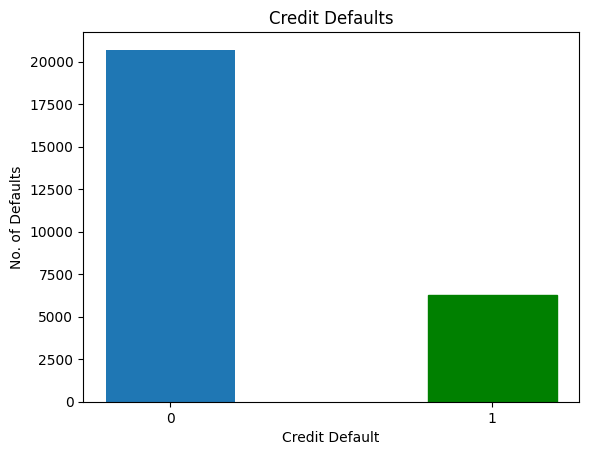

In [16]:
barlist = plt.bar([str(0),str(1)], y.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Credit Default")
plt.ylabel("No. of Defaults")
plt.title("Credit Defaults")
plt.show()

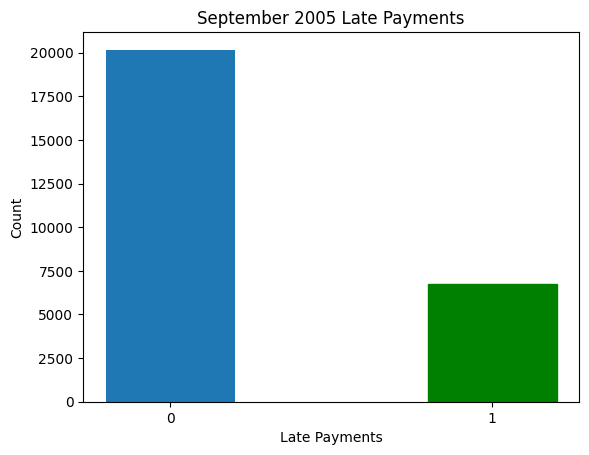

In [17]:
barlist = plt.bar([str(0),str(1)], y2.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Late Payments")
plt.ylabel("Count")
plt.title("September 2005 Late Payments")
plt.show()

# Splitting for Source and Target Domains:


# Full Dataset:

For the Heart Disease prediction, we split the dataset between low education level (**now including high-school dropouts**) and the high education level. The high-education data (with diabetes as response variable/label) becomes the source data and the low-education data (with Heart Disease as response variable/label) is the target data.

In [18]:
data_S = data2[data2[2] <= 0.5].reset_index(drop=True)  ## Source domain and classification
data_S_X = data_S.iloc[:,:-2]
data_S_y = data_S.iloc[:, -1]    ## Response variable of interest is Sept 2005 Late Payment

data_S_full = pd.concat([data_S_X, data_S_y], axis=1)

data_T = data2[data2[2] > 0.5].reset_index(drop=True) ## Target domain and classification

data_T_X = data_T.iloc[:,:-2]
data_T_y = data_T.iloc[:, -2]    ## Response variable of interest in Default

data_T_full = pd.concat([data_T_X, data_T_y], axis=1)

In [19]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,Y2
0,0.010101,1.0,0.333333,0.333333,0.051724,0.4,0.1,0.1,0.0,0.0,...,0.160138,0.080648,0.260979,0.000000,0.000561,0.000000,0.000000,0.000000,0.000000,1
1,0.111111,1.0,0.333333,0.666667,0.086207,0.4,0.2,0.2,0.2,0.4,...,0.163220,0.084074,0.263485,0.000000,0.000815,0.001116,0.001610,0.000000,0.003783,0
2,0.080808,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,...,0.173637,0.095470,0.272928,0.001738,0.001222,0.001116,0.001610,0.002345,0.009458,0
3,0.040404,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,...,0.186809,0.109363,0.283685,0.002290,0.001645,0.001339,0.001771,0.002506,0.001892,0
4,0.040404,0.0,0.333333,0.333333,0.620690,0.2,0.1,0.2,0.2,0.2,...,0.179863,0.099633,0.275681,0.002290,0.029893,0.011160,0.014493,0.001615,0.001284,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22266,0.202020,0.0,0.333333,0.333333,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.162493,0.083127,0.262900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
22267,0.090909,0.0,0.000000,0.666667,0.293103,0.1,0.1,0.2,0.2,0.2,...,0.226667,0.149535,0.303248,0.002290,0.091097,0.004464,0.004831,0.004689,0.003783,0
22268,0.070707,0.0,0.333333,0.666667,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.233160,0.162558,0.323347,0.008013,0.002852,0.000000,0.011272,0.000000,0.007566,1
22269,0.020202,0.0,0.333333,0.666667,0.275862,0.5,0.4,0.1,0.2,0.2,...,0.179805,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864,1


In [20]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,Y
0,0.131313,1.0,0.666667,0.333333,0.120690,0.2,0.4,0.2,0.2,0.2,...,0.171640,0.092342,0.263837,0.003811,0.000000,0.000482,0.001610,0.002345,0.001892,0
1,0.191919,1.0,0.666667,0.666667,0.224138,0.2,0.4,0.2,0.2,0.1,...,0.162505,0.082461,0.263846,0.002640,0.000010,0.000056,0.000483,0.008764,0.000125,0
2,0.040404,1.0,0.666667,1.000000,0.034483,0.4,0.2,0.2,0.2,0.2,...,0.187240,0.109930,0.284195,0.000000,0.001222,0.001228,0.001932,0.003048,0.002081,0
3,0.121212,1.0,0.666667,0.666667,0.310345,0.2,0.2,0.2,0.2,0.1,...,0.179558,0.092351,0.261693,0.003434,0.001253,0.001116,0.003221,0.002180,0.063866,0
4,0.040404,0.0,0.666667,0.666667,0.034483,0.2,0.2,0.2,0.2,0.2,...,0.187424,0.110226,0.284069,0.002259,0.001162,0.001117,0.002306,0.002490,0.001886,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4664,0.040404,0.0,0.666667,0.666667,0.362069,0.2,0.2,0.2,0.2,0.2,...,0.207576,0.100451,0.276113,0.011448,0.003260,0.005580,0.004831,0.010550,0.003783,0
4665,0.000000,0.0,0.666667,0.333333,0.379310,0.2,0.2,0.0,0.0,0.0,...,0.160138,0.080648,0.260979,0.002290,0.000000,0.000000,0.000000,0.000000,0.000000,0
4666,0.212121,0.0,0.666667,0.333333,0.310345,0.2,0.2,0.2,0.2,0.2,...,0.243036,0.111622,0.273259,0.009730,0.016299,0.005583,0.004907,0.011723,0.001892,0
4667,0.141414,0.0,0.666667,0.666667,0.379310,0.1,0.1,0.1,0.2,0.2,...,0.168596,0.085794,0.260979,0.002103,0.002873,0.010042,0.000208,0.000000,0.000000,0


## Source domain and task labels:

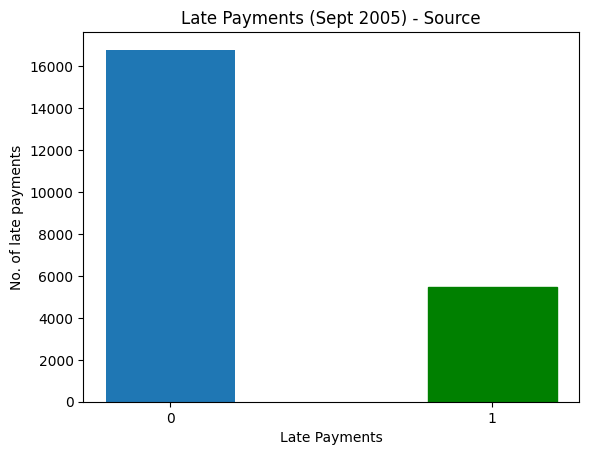

In [21]:
barlist_S = plt.bar([str(0),str(1)], data_S_y.value_counts(), width = 0.4)
barlist_S[1].set_color('g')

plt.xlabel("Late Payments")
plt.ylabel("No. of late payments")
plt.title("Late Payments (Sept 2005) - Source")
plt.show()

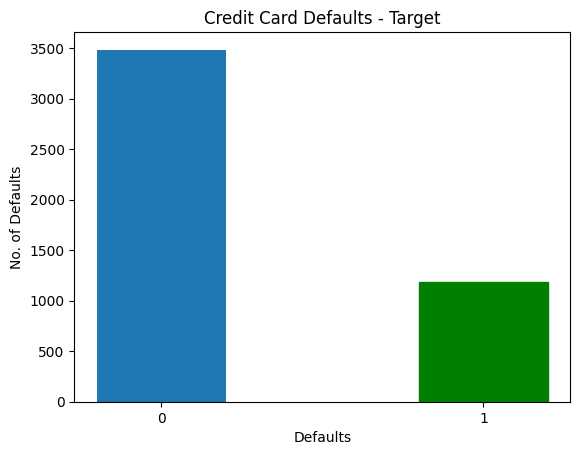

In [22]:
barlist_T = plt.bar([str(0),str(1)], data_T_y.value_counts(), width = 0.4)
barlist_T[1].set_color('g')

plt.xlabel("Defaults")
plt.ylabel("No. of Defaults")
plt.title("Credit Card Defaults - Target")
plt.show()

## Updated Code (Modified from Shreya's code):

In [23]:
def create_dnn_model(input_shape):
  model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(32, activation='relu'),
        layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
    ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

  model.summary()
  print(len(model.layers))

  return model

# def create_dnn_model(input_shape):
#   model = models.Sequential([layers.Dense(64, activation='relu', input_dim=input_shape),
#         layers.Dense(32, activation='relu'),
#         layers.Dense(1, activation='sigmoid')  # For binary classification (yes/no diabetes)
#     ])

#   model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['AUC'])

#   return model



def train_and_evaluate(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    model.save('model.h5')
    model.save_weights('model_wt.weights.h5')

    return model


In [24]:
def train_and_evaluate_nosave(model, X_train, X_test, y_train, y_test, domain):

    time_start = perf_counter()

    # Training and validation
    model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])

    print(fpr)
    print(fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

    return fpr, fnr


In [25]:
def fine_tuning(X_train, X_test, y_train, y_test, llim, ulim):
    new_model = create_dnn_model(X_S_train.shape[1])
    # new_model = tf.keras.models.load_model('model.h5')
    new_model.load_weights('model_wt.weights.h5')

    for layer in new_model.layers[llim:ulim]:
        layer.trainable = False
    for layer in new_model.layers[-1:]:
        layer.trainable = False

    for layer in new_model.layers:
        if layer.trainable == True:
          print("Trainable")
        else:
          print("Not Trainable")

    fpr, fnr = train_and_evaluate_nosave(new_model, X_train, X_test, y_train, y_test, "Target")
    return fpr, fnr

In [26]:
def Transductive_TL(model, X_test, y_test, domain):

    time_start = perf_counter()

    # Predict probabilities and calculate AUC
    y_pred_prob = model.predict(X_test).ravel()
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f"AUC-ROC: {auc}")

    # Compute ROC curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)

    # Convert probabilities to binary predictions for confusion matrix
    y_pred_class = (y_pred_prob >= 0.5).astype(int)

    # Compute and print classification report
    class_report = classification_report(y_test, y_pred_class)
    print("Classification Report:")
    print(class_report)

    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_class)
    conf_disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)

    # Plot ROC curve and Confusion Matrix side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # ROC Curve
    ax1.plot(fpr, tpr, color='blue', label=f'AUC-ROC = {auc:.2f}')
    ax1.plot([0, 1], [0, 1], color='gray', linestyle='--')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
    ax1.legend(loc='lower right')
    ax1.grid()

    # Confusion Matrix
    # print('Confusion matrix:', conf_matrix)
    fpr = conf_matrix[0][1]/(conf_matrix[0][0]+conf_matrix[0][1])
    tnr = 1-fpr

    fnr = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[1][1])
    tpr = 1 - fnr
    print('FPR', fpr, 'TPR:', tpr, 'FNR:', fnr, 'TNR:', tnr)
    conf_disp.plot(ax=ax2, cmap='Blues')
    ax2.set_title('Confusion Matrix')
    plt.tight_layout()
    plt.show()

    # Calculate precision and recall for different thresholds
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)

    # Find the threshold where precision and recall are balanced
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[f1_scores.argmax()]

    print(f"Best threshold based on F1-score: {best_threshold}")
    print('False Negative Rate:', fnr)

    time_stop = perf_counter()

    print('Time elapsed (performance):', time_stop-time_start)

# Over/undersampling functions:

## Undersampling functions:

In [27]:
import random

def SRS_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=False)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def SRSwR_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_maj_rus = data_majority.sample(n=undersample_size, replace=True)
    data_SRS_RUS = pd.concat([data_maj_rus, data_minority])
    X_SRS = data_SRS_RUS.iloc[:, :-1]
    y_SRS = data_SRS_RUS.iloc[:, -1]

    return X_SRS, y_SRS


def systematic_undersampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.randint(1, int(k))
    print(start)
    Row = []
    for i in range(undersample_size):
      row = start+int(k*i)-1
      Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy



def multi_systematic_undersampler(data, data_column, m):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)
    print(undersample_size)
    print(oversample_size)

    k = oversample_size/undersample_size
    print(k)
    np.random.seed(123)
    start = random.sample(range(1, int(k*m)), m)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/m)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    print(Row)
    data_maj_rus = pd.DataFrame()
    data_maj_rus = data_majority.iloc[Row]
    data_maj_rus
    data_Sy_RUS = pd.concat([data_maj_rus, data_minority])

    X_Sy = data_Sy_RUS.iloc[:, :-1]
    y_Sy = data_Sy_RUS.iloc[:, -1]

    return X_Sy, y_Sy

## Oversampling functions:

In [28]:
def SRSwR_oversampler(data, data_column):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    np.random.seed(123)
    data_min_ros = data_minority.sample(n=oversample_size - undersample_size, replace=True)
    data_SRS_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_SRS = data_SRS_ROS.iloc[:, :-1]
    y_SRS = data_SRS_ROS.iloc[:, -1]

    return X_SRS, y_SRS

# data_S_min_ros = data_S_minority.sample(n=oversample_size - undersample_size, replace=True)


def systematic_resampler(data, data_column, k):
    data_majority = data[data_column.isin([0])]
    data_minority = data[data_column.isin([1])]
    undersample_size = len(data_minority)
    oversample_size = len(data_majority)

    print(undersample_size)
    print(oversample_size)

    Nsamples = k*(oversample_size-undersample_size)/undersample_size
    print('Nsamples=', Nsamples)

    np.random.seed(123)
    start = np.random.choice(int(k), int(Nsamples), replace=True)
    Row = []
    for j in range(len(start)):
      for i in range(int(undersample_size/k)):
        row = start[j]+int(k*i)-1
        Row.append(row)
    data_min_ros = pd.DataFrame()
    data_min_ros = data_minority.iloc[Row]

    data_Sy_ROS = pd.concat([data_majority, data_minority, data_min_ros])
    X_Sy = data_Sy_ROS.iloc[:, :-1]
    y_Sy = data_Sy_ROS.iloc[:, -1]

    return X_Sy, y_Sy

# k = 48

# Nsamples = k*(oversample_size-undersample_size)/undersample_size
# # print(Nsamples)

# np.random.seed(123)
# start = np.random.choice(int(k), int(Nsamples), replace=True)
# # print(start)


# Row = []

# for j in range(len(start)):
#   for i in range(int(undersample_size/k)):
#     row = start[j]+int(k*i)-1
#     Row.append(row)

In [29]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(data_S_X, data_S_y, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)

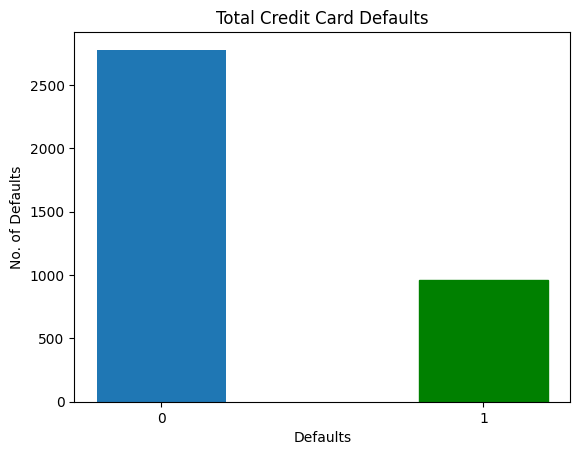

In [30]:
barlist = plt.bar([str(0),str(1)], y_T_train.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Defaults")
plt.ylabel("No. of Defaults")
plt.title("Total Credit Card Defaults")
plt.show()

In [31]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (17816, 22)
y_S_train: (17816,)
X_S_test: (4455, 22)
y_S_test: (4455,)


# Original (Imbalanced) dataset:

## Standard Machine Learning:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 7s 7ms/step - AUC: 0.7246 - loss: 0.4767 - val_AUC: 0.9083 - val_loss: 0.2572
Epoch 2/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9056 - loss: 0.2652 - val_AUC: 0.9149 - val_loss: 0.2438
Epoch 3/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9130 - loss: 0.2407 - val_AUC: 0.9181 - val_loss: 0.2409
Epoch 4/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9186 - loss: 0.2345 - val_AUC: 0.9198 - val_loss: 0.2312
Epoch 5/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9230 - loss: 0.2357 - val_AUC: 0.9208 - val_loss: 0.2304
Epoch 6/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9220 - loss: 0.2308 - val_AUC: 0.9170 - val_loss: 0.2347
Epoch 7/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9184 - loss: 0.2373 - val_AUC: 0.9214 - val_loss: 0.2295
Epoch 8/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9264 - loss: 0.2256 - val_AUC: 0.9247 - val_loss: 0.2244
Epoch 9/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

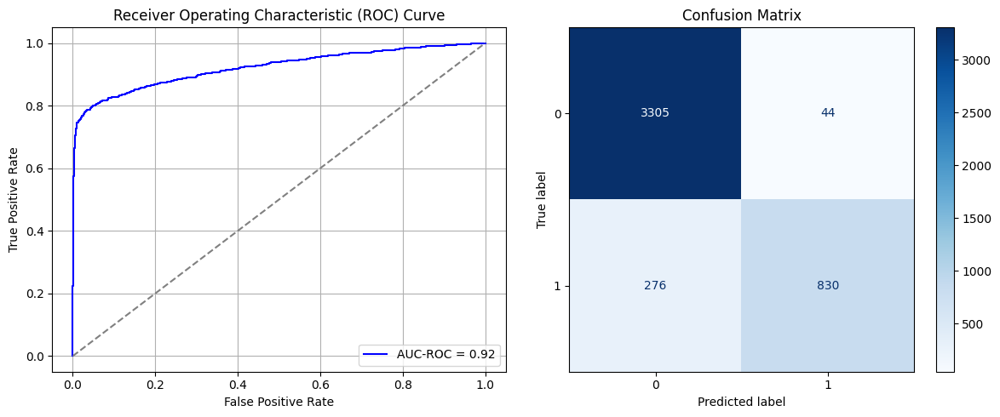

Best threshold based on F1-score: 0.5028167366981506
Time elapsed (performance): 29.35520930199999


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6919 - loss: 0.7607 - val_AUC: 0.7272 - val_loss: 0.4960
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7434 - loss: 0.4986 - val_AUC: 0.7332 - val_loss: 0.4899
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7071 - loss: 0.5127 - val_AUC: 0.7346 - val_loss: 0.4875
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7265 - loss: 0.5009 - val_AUC: 0.7328 - val_loss: 0.4886
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7189 - loss: 0.4970 - val_AUC: 0.7342 - val_loss: 0.4866
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7256 - loss: 0.4951 - val_AUC: 0.7350 - val_loss: 0.4877
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7067 - loss: 0.5213 - val_AUC: 0.7347 - val_loss: 0.4861
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7291 - loss: 0.5113 - val_AUC: 0.7341 - val_loss: 0.4865
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7054 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6976 - loss: 0.7066 - val_AUC: 0.7282 - val_loss: 0.4950
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7323 - loss: 0.5160 - val_AUC: 0.7325 - val_loss: 0.4898
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5178 - val_AUC: 0.7333 - val_loss: 0.4897
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7202 - loss: 0.5091 - val_AUC: 0.7345 - val_loss: 0.4889
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7153 - loss: 0.4964 - val_AUC: 0.7342 - val_loss: 0.4871
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7190 - loss: 0.5019 - val_AUC: 0.7329 - val_loss: 0.4872
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7519 - loss: 0.4802 - val_AUC: 0.7342 - val_loss: 0.4870
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6955 - loss: 0.5087 - val_AUC: 0.7337 - val_loss: 0.4863
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.5093 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6935 - loss: 0.7423 - val_AUC: 0.7263 - val_loss: 0.4981
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7059 - loss: 0.5281 - val_AUC: 0.7332 - val_loss: 0.4899
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5091 - val_AUC: 0.7347 - val_loss: 0.4909
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7157 - loss: 0.5026 - val_AUC: 0.7343 - val_loss: 0.4879
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7366 - loss: 0.4953 - val_AUC: 0.7330 - val_loss: 0.4898
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7251 - loss: 0.5046 - val_AUC: 0.7333 - val_loss: 0.4874
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7350 - loss: 0.4974 - val_AUC: 0.7342 - val_loss: 0.4876
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7434 - loss: 0.4988 - val_AUC: 0.7337 - val_loss: 0.4889
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.5088 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6904 - loss: 0.7214 - val_AUC: 0.7275 - val_loss: 0.4964
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6963 - loss: 0.5158 - val_AUC: 0.7332 - val_loss: 0.4894
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.5075 - val_AUC: 0.7335 - val_loss: 0.4882
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7323 - loss: 0.4897 - val_AUC: 0.7327 - val_loss: 0.4872
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.4989 - val_AUC: 0.7337 - val_loss: 0.4872
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7265 - loss: 0.4947 - val_AUC: 0.7342 - val_loss: 0.4869
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.4985 - val_AUC: 0.7350 - val_loss: 0.4865
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.4867 - val_AUC: 0.7352 - val_loss: 0.4890
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7280 - loss: 0.5172 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7110 - loss: 0.6805 - val_AUC: 0.7271 - val_loss: 0.4941
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7101 - loss: 0.5151 - val_AUC: 0.7292 - val_loss: 0.4894
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7204 - loss: 0.5008 - val_AUC: 0.7323 - val_loss: 0.4885
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7265 - loss: 0.5026 - val_AUC: 0.7328 - val_loss: 0.4885
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7199 - loss: 0.5024 - val_AUC: 0.7334 - val_loss: 0.4875
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7407 - loss: 0.4927 - val_AUC: 0.7328 - val_loss: 0.4871
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7423 - loss: 0.4936 - val_AUC: 0.7326 - val_loss: 0.4867
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7237 - loss: 0.4988 - val_AUC: 0.7335 - val_loss: 0.4866
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.5059 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - AUC: 0.6806 - loss: 0.7452 - val_AUC: 0.7254 - val_loss: 0.4985
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.7481 - loss: 0.4989 - val_AUC: 0.7314 - val_loss: 0.4900
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.5133 - val_AUC: 0.7324 - val_loss: 0.4880
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6966 - loss: 0.5315 - val_AUC: 0.7330 - val_loss: 0.4902
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7031 - loss: 0.5120 - val_AUC: 0.7314 - val_loss: 0.4878
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7363 - loss: 0.4991 - val_AUC: 0.7331 - val_loss: 0.4890
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7144 - loss: 0.5106 - val_AUC: 0.7347 - val_loss: 0.4866
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7400 - loss: 0.5066 - val_AUC: 0.7349 - val_loss: 0.4877
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7495 - loss: 0.4913 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - AUC: 0.7005 - loss: 0.7252 - val_AUC: 0.7276 - val_loss: 0.4955
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7194 - loss: 0.5183 - val_AUC: 0.7307 - val_loss: 0.4893
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7327 - loss: 0.4998 - val_AUC: 0.7332 - val_loss: 0.4893
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7363 - loss: 0.5075 - val_AUC: 0.7333 - val_loss: 0.4880
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5025 - val_AUC: 0.7338 - val_loss: 0.4871
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7235 - loss: 0.4901 - val_AUC: 0.7337 - val_loss: 0.4916
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5033 - val_AUC: 0.7354 - val_loss: 0.4866
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7132 - loss: 0.5177 - val_AUC: 0.7334 - val_loss: 0.4871
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.4934 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6847 - loss: 0.7622 - val_AUC: 0.7272 - val_loss: 0.4977
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5053 - val_AUC: 0.7313 - val_loss: 0.4897
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7482 - loss: 0.5022 - val_AUC: 0.7341 - val_loss: 0.4908
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7438 - loss: 0.4935 - val_AUC: 0.7331 - val_loss: 0.4886
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5171 - val_AUC: 0.7343 - val_loss: 0.4873
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7306 - loss: 0.5012 - val_AUC: 0.7338 - val_loss: 0.4877
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7469 - loss: 0.4973 - val_AUC: 0.7343 - val_loss: 0.4882
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - AUC: 0.7350 - loss: 0.4902 - val_AUC: 0.7335 - val_loss: 0.4870
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7062 - loss: 0.5043 - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7247 - loss: 0.6621 - val_AUC: 0.7279 - val_loss: 0.4960
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7339 - loss: 0.4942 - val_AUC: 0.7321 - val_loss: 0.4898
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7219 - loss: 0.4996 - val_AUC: 0.7333 - val_loss: 0.4898
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7423 - loss: 0.4867 - val_AUC: 0.7337 - val_loss: 0.4898
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7263 - loss: 0.5062 - val_AUC: 0.7344 - val_loss: 0.4868
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5041 - val_AUC: 0.7329 - val_loss: 0.4865
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7452 - loss: 0.4858 - val_AUC: 0.7338 - val_loss: 0.4867
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7291 - loss: 0.5125 - val_AUC: 0.7348 - val_loss: 0.4881
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 - loss: 0.5064 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6908 - loss: 0.7096 - val_AUC: 0.7284 - val_loss: 0.4944
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.4904 - val_AUC: 0.7318 - val_loss: 0.4908
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.4998 - val_AUC: 0.7328 - val_loss: 0.4896
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7168 - loss: 0.5011 - val_AUC: 0.7335 - val_loss: 0.4874
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.4767 - val_AUC: 0.7334 - val_loss: 0.4919
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5095 - val_AUC: 0.7339 - val_loss: 0.4869
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7288 - loss: 0.5062 - val_AUC: 0.7351 - val_loss: 0.4865
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.5143 - val_AUC: 0.7340 - val_loss: 0.4871
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7304 - loss: 0.4862 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7151 - loss: 0.6907 - val_AUC: 0.7274 - val_loss: 0.4941
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5008 - val_AUC: 0.7331 - val_loss: 0.4893
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5121 - val_AUC: 0.7332 - val_loss: 0.4891
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7335 - loss: 0.5054 - val_AUC: 0.7338 - val_loss: 0.4878
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5033 - val_AUC: 0.7344 - val_loss: 0.4875
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7312 - loss: 0.4976 - val_AUC: 0.7326 - val_loss: 0.4868
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7269 - loss: 0.5021 - val_AUC: 0.7338 - val_loss: 0.4872
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7061 - loss: 0.5125 - val_AUC: 0.7350 - val_loss: 0.4861
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7104 - loss: 0.4966 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6946 - loss: 0.7152 - val_AUC: 0.7285 - val_loss: 0.4949
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7207 - loss: 0.5134 - val_AUC: 0.7316 - val_loss: 0.4897
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7278 - loss: 0.5006 - val_AUC: 0.7331 - val_loss: 0.4884
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.4868 - val_AUC: 0.7345 - val_loss: 0.4890
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7223 - loss: 0.5077 - val_AUC: 0.7336 - val_loss: 0.4871
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7380 - loss: 0.5017 - val_AUC: 0.7334 - val_loss: 0.4875
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7294 - loss: 0.5025 - val_AUC: 0.7343 - val_loss: 0.4872
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7269 - loss: 0.5157 - val_AUC: 0.7343 - val_loss: 0.4871
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7242 - loss: 0.4930 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6967 - loss: 0.7330 - val_AUC: 0.7280 - val_loss: 0.4936
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7310 - loss: 0.4795 - val_AUC: 0.7335 - val_loss: 0.4901
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5138 - val_AUC: 0.7342 - val_loss: 0.4890
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7125 - loss: 0.5115 - val_AUC: 0.7346 - val_loss: 0.4879
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.4927 - val_AUC: 0.7339 - val_loss: 0.4871
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7220 - loss: 0.4985 - val_AUC: 0.7336 - val_loss: 0.4877
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7285 - loss: 0.4731 - val_AUC: 0.7331 - val_loss: 0.4913
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.4930 - val_AUC: 0.7343 - val_loss: 0.4869
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7422 - loss: 0.4927 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7160 - loss: 0.6641 - val_AUC: 0.7267 - val_loss: 0.4949
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7239 - loss: 0.5146 - val_AUC: 0.7338 - val_loss: 0.4884
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7534 - loss: 0.4863 - val_AUC: 0.7332 - val_loss: 0.4923
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7155 - loss: 0.5023 - val_AUC: 0.7337 - val_loss: 0.4882
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7260 - loss: 0.4861 - val_AUC: 0.7323 - val_loss: 0.4878
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5033 - val_AUC: 0.7337 - val_loss: 0.4879
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7134 - loss: 0.5223 - val_AUC: 0.7342 - val_loss: 0.4870
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7196 - loss: 0.4945 - val_AUC: 0.7347 - val_loss: 0.4866
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5081 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - AUC: 0.6913 - loss: 0.7125 - val_AUC: 0.7303 - val_loss: 0.4927
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7374 - loss: 0.5012 - val_AUC: 0.7322 - val_loss: 0.4893
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7129 - loss: 0.5100 - val_AUC: 0.7321 - val_loss: 0.4889
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7037 - loss: 0.5191 - val_AUC: 0.7336 - val_loss: 0.4873
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.4981 - val_AUC: 0.7337 - val_loss: 0.4876
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5033 - val_AUC: 0.7335 - val_loss: 0.4866
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7099 - loss: 0.5083 - val_AUC: 0.7345 - val_loss: 0.4882
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7339 - loss: 0.4892 - val_AUC: 0.7345 - val_loss: 0.4863
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7192 - loss: 0.4957 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6957 - loss: 0.7075 - val_AUC: 0.7256 - val_loss: 0.4966
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7294 - loss: 0.5145 - val_AUC: 0.7321 - val_loss: 0.4897
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.4975 - val_AUC: 0.7337 - val_loss: 0.4886
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7217 - loss: 0.5136 - val_AUC: 0.7334 - val_loss: 0.4877
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7260 - loss: 0.4992 - val_AUC: 0.7340 - val_loss: 0.4871
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7302 - loss: 0.4891 - val_AUC: 0.7328 - val_loss: 0.4882
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7224 - loss: 0.5167 - val_AUC: 0.7338 - val_loss: 0.4876
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7296 - loss: 0.4951 - val_AUC: 0.7339 - val_loss: 0.4874
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7318 - loss: 0.5025 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - AUC: 0.6894 - loss: 0.7116 - val_AUC: 0.7264 - val_loss: 0.4977
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5110 - val_AUC: 0.7333 - val_loss: 0.4893
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5070 - val_AUC: 0.7344 - val_loss: 0.4880
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7326 - loss: 0.4881 - val_AUC: 0.7329 - val_loss: 0.4881
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7148 - loss: 0.5079 - val_AUC: 0.7339 - val_loss: 0.4870
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7327 - loss: 0.5087 - val_AUC: 0.7341 - val_loss: 0.4867
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7063 - loss: 0.5156 - val_AUC: 0.7351 - val_loss: 0.4869
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7425 - loss: 0.4976 - val_AUC: 0.7349 - val_loss: 0.4874
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7109 - loss: 0.5159 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7026 - loss: 0.7126 - val_AUC: 0.7269 - val_loss: 0.4950
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7338 - loss: 0.4922 - val_AUC: 0.7311 - val_loss: 0.4899
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5062 - val_AUC: 0.7338 - val_loss: 0.4878
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7317 - loss: 0.5102 - val_AUC: 0.7336 - val_loss: 0.4879
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7248 - loss: 0.5210 - val_AUC: 0.7329 - val_loss: 0.4872
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7387 - loss: 0.5008 - val_AUC: 0.7340 - val_loss: 0.4871
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7045 - loss: 0.5106 - val_AUC: 0.7338 - val_loss: 0.4865
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6971 - loss: 0.5192 - val_AUC: 0.7334 - val_loss: 0.4864
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7299 - loss: 0.5004 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6989 - loss: 0.7100 - val_AUC: 0.7276 - val_loss: 0.4976
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7267 - loss: 0.5202 - val_AUC: 0.7338 - val_loss: 0.4893
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.4957 - val_AUC: 0.7333 - val_loss: 0.4903
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5017 - val_AUC: 0.7344 - val_loss: 0.4879
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7182 - loss: 0.5093 - val_AUC: 0.7328 - val_loss: 0.4881
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7467 - loss: 0.4872 - val_AUC: 0.7349 - val_loss: 0.4874
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7218 - loss: 0.5071 - val_AUC: 0.7340 - val_loss: 0.4875
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7267 - loss: 0.5000 - val_AUC: 0.7337 - val_loss: 0.4867
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7236 - loss: 0.5092 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7132 - loss: 0.7106 - val_AUC: 0.7279 - val_loss: 0.4947
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7249 - loss: 0.5022 - val_AUC: 0.7318 - val_loss: 0.4895
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5027 - val_AUC: 0.7327 - val_loss: 0.4878
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7475 - loss: 0.4993 - val_AUC: 0.7319 - val_loss: 0.4909
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5039 - val_AUC: 0.7328 - val_loss: 0.4927
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7155 - loss: 0.5112 - val_AUC: 0.7336 - val_loss: 0.4867
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7278 - loss: 0.5111 - val_AUC: 0.7352 - val_loss: 0.4869
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5063 - val_AUC: 0.7354 - val_loss: 0.4865
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7351 - loss: 0.4806 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - AUC: 0.6966 - loss: 0.4968 - val_AUC: 0.9056 - val_loss: 0.2709
Epoch 2/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9075 - loss: 0.2542 - val_AUC: 0.9150 - val_loss: 0.2355
Epoch 3/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9248 - loss: 0.2326 - val_AUC: 0.9108 - val_loss: 0.2453
Epoch 4/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9179 - loss: 0.2393 - val_AUC: 0.9216 - val_loss: 0.2333
Epoch 5/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9154 - loss: 0.2403 - val_AUC: 0.9206 - val_loss: 0.2308
Epoch 6/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9197 - loss: 0.2376 - val_AUC: 0.9112 - val_loss: 0.2411
Epoch 7/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9237 - loss: 0.2284 - val_AUC: 0.9239 - val_loss: 0.2286
Epoch 8/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9250 - loss: 0.2341 - val_AUC: 0.9218 - val_loss: 0.2287
Epoch 9/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

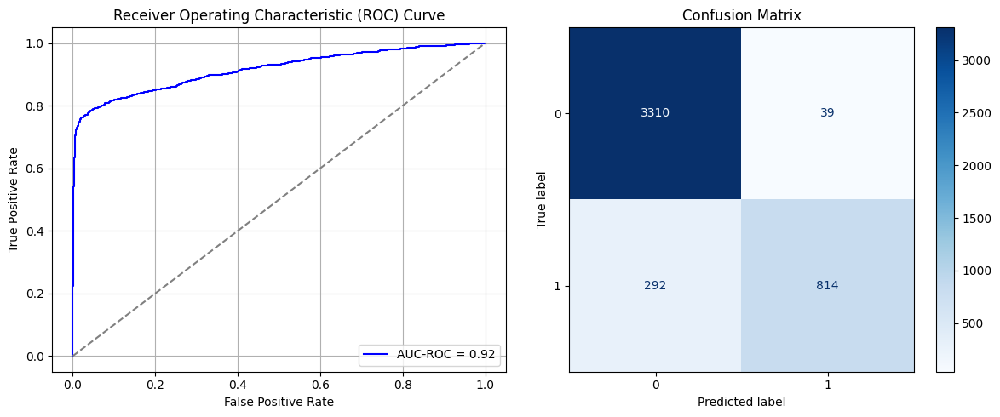

Best threshold based on F1-score: 0.359510600566864
Time elapsed (performance): 25.994979518000036


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7144 - loss: 0.6550 - val_AUC: 0.7058 - val_loss: 0.5027
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7187 - loss: 0.5143 - val_AUC: 0.7184 - val_loss: 0.4973
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7218 - loss: 0.5173 - val_AUC: 0.7328 - val_loss: 0.4923
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.4982 - val_AUC: 0.7374 - val_loss: 0.4952
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7044 - loss: 0.5196 - val_AUC: 0.7375 - val_loss: 0.4905
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.5038 - val_AUC: 0.7382 - val_loss: 0.4910
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7100 - loss: 0.5289 - val_AUC: 0.7403 - val_loss: 0.4898
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7340 - loss: 0.5028 - val_AUC: 0.7373 - val_loss: 0.4878
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7070 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6924 - loss: 0.7088 - val_AUC: 0.7059 - val_loss: 0.5026
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6995 - loss: 0.5223 - val_AUC: 0.7228 - val_loss: 0.4944
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5082 - val_AUC: 0.7308 - val_loss: 0.4936
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7541 - loss: 0.4991 - val_AUC: 0.7395 - val_loss: 0.4920
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.5185 - val_AUC: 0.7390 - val_loss: 0.4899
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7398 - loss: 0.5128 - val_AUC: 0.7399 - val_loss: 0.4909
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7003 - loss: 0.5220 - val_AUC: 0.7398 - val_loss: 0.4885
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7094 - loss: 0.5245 - val_AUC: 0.7385 - val_loss: 0.4886
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7346 - loss: 0.5108 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6902 - loss: 0.7188 - val_AUC: 0.7068 - val_loss: 0.5044
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6907 - loss: 0.5219 - val_AUC: 0.7208 - val_loss: 0.4949
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7019 - loss: 0.5350 - val_AUC: 0.7319 - val_loss: 0.4924
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7123 - loss: 0.5066 - val_AUC: 0.7387 - val_loss: 0.4912
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7300 - loss: 0.5103 - val_AUC: 0.7385 - val_loss: 0.4917
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7198 - loss: 0.5017 - val_AUC: 0.7396 - val_loss: 0.4902
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5070 - val_AUC: 0.7391 - val_loss: 0.4884
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.5109 - val_AUC: 0.7394 - val_loss: 0.4891
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6757 - loss: 0.7221 - val_AUC: 0.7079 - val_loss: 0.5037
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7212 - loss: 0.5041 - val_AUC: 0.7182 - val_loss: 0.4986
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7178 - loss: 0.5133 - val_AUC: 0.7305 - val_loss: 0.4933
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5102 - val_AUC: 0.7374 - val_loss: 0.4901
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.5075 - val_AUC: 0.7389 - val_loss: 0.4896
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7382 - loss: 0.4969 - val_AUC: 0.7370 - val_loss: 0.4938
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7350 - loss: 0.5037 - val_AUC: 0.7391 - val_loss: 0.4908
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7169 - loss: 0.5096 - val_AUC: 0.7384 - val_loss: 0.4895
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7063 - loss: 0.5079 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6774 - loss: 0.7000 - val_AUC: 0.7065 - val_loss: 0.5031
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7135 - loss: 0.5147 - val_AUC: 0.7159 - val_loss: 0.4981
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6883 - loss: 0.5139 - val_AUC: 0.7327 - val_loss: 0.4917
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7104 - loss: 0.5076 - val_AUC: 0.7327 - val_loss: 0.4925
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.5110 - val_AUC: 0.7382 - val_loss: 0.4913
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5037 - val_AUC: 0.7377 - val_loss: 0.4932
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7349 - loss: 0.5161 - val_AUC: 0.7378 - val_loss: 0.4905
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7283 - loss: 0.5143 - val_AUC: 0.7398 - val_loss: 0.4892
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7230 - loss: 0.5129 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6851 - loss: 0.7235 - val_AUC: 0.7073 - val_loss: 0.5022
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7026 - loss: 0.5205 - val_AUC: 0.7217 - val_loss: 0.4947
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7174 - loss: 0.5166 - val_AUC: 0.7314 - val_loss: 0.4931
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5170 - val_AUC: 0.7380 - val_loss: 0.4926
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.4964 - val_AUC: 0.7388 - val_loss: 0.4900
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7212 - loss: 0.5041 - val_AUC: 0.7379 - val_loss: 0.4898
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7134 - loss: 0.5118 - val_AUC: 0.7395 - val_loss: 0.4887
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5120 - val_AUC: 0.7393 - val_loss: 0.4891
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7124 - loss: 0.5122 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6875 - loss: 0.7565 - val_AUC: 0.7029 - val_loss: 0.5054
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7232 - loss: 0.5164 - val_AUC: 0.7226 - val_loss: 0.4957
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.5060 - val_AUC: 0.7334 - val_loss: 0.4940
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.4998 - val_AUC: 0.7387 - val_loss: 0.4921
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.4997 - val_AUC: 0.7383 - val_loss: 0.4915
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7347 - loss: 0.5026 - val_AUC: 0.7391 - val_loss: 0.4898
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.4963 - val_AUC: 0.7376 - val_loss: 0.4903
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7284 - loss: 0.5066 - val_AUC: 0.7378 - val_loss: 0.4900
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7385 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7140 - loss: 0.6602 - val_AUC: 0.7021 - val_loss: 0.5045
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7122 - loss: 0.5087 - val_AUC: 0.7213 - val_loss: 0.4956
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7229 - loss: 0.5059 - val_AUC: 0.7311 - val_loss: 0.4934
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.4963 - val_AUC: 0.7377 - val_loss: 0.4941
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7169 - loss: 0.5116 - val_AUC: 0.7407 - val_loss: 0.4898
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7171 - loss: 0.5268 - val_AUC: 0.7395 - val_loss: 0.4919
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7463 - loss: 0.4996 - val_AUC: 0.7406 - val_loss: 0.4905
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7344 - loss: 0.5029 - val_AUC: 0.7392 - val_loss: 0.4881
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.4985 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - AUC: 0.6881 - loss: 0.7061 - val_AUC: 0.7051 - val_loss: 0.5027
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6968 - loss: 0.5312 - val_AUC: 0.7265 - val_loss: 0.4947
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7163 - loss: 0.5199 - val_AUC: 0.7311 - val_loss: 0.4952
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7317 - loss: 0.5128 - val_AUC: 0.7403 - val_loss: 0.4920
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7061 - loss: 0.5254 - val_AUC: 0.7393 - val_loss: 0.4899
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.5001 - val_AUC: 0.7381 - val_loss: 0.4894
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.5011 - val_AUC: 0.7384 - val_loss: 0.4917
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.4970 - val_AUC: 0.7380 - val_loss: 0.4878
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.5119 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.6941 - loss: 0.6753 - val_AUC: 0.7023 - val_loss: 0.5047
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7044 - loss: 0.5259 - val_AUC: 0.7204 - val_loss: 0.4980
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7202 - loss: 0.5154 - val_AUC: 0.7350 - val_loss: 0.4918
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7163 - loss: 0.5245 - val_AUC: 0.7390 - val_loss: 0.4909
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7218 - loss: 0.5176 - val_AUC: 0.7390 - val_loss: 0.4902
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7127 - loss: 0.5140 - val_AUC: 0.7400 - val_loss: 0.4894
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.5148 - val_AUC: 0.7396 - val_loss: 0.4885
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7188 - loss: 0.5052 - val_AUC: 0.7394 - val_loss: 0.4884
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7278 - loss: 0.5104 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6999 - loss: 0.6883 - val_AUC: 0.7035 - val_loss: 0.5037
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6854 - loss: 0.5219 - val_AUC: 0.7269 - val_loss: 0.4931
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6874 - loss: 0.5401 - val_AUC: 0.7387 - val_loss: 0.4922
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.4977 - val_AUC: 0.7369 - val_loss: 0.4929
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5114 - val_AUC: 0.7380 - val_loss: 0.4906
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7213 - loss: 0.5161 - val_AUC: 0.7402 - val_loss: 0.4890
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7203 - loss: 0.5001 - val_AUC: 0.7398 - val_loss: 0.4891
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7302 - loss: 0.5012 - val_AUC: 0.7403 - val_loss: 0.4889
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7331 - loss: 0.5051 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6992 - loss: 0.6694 - val_AUC: 0.7042 - val_loss: 0.5050
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.5175 - val_AUC: 0.7235 - val_loss: 0.4947
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5222 - val_AUC: 0.7318 - val_loss: 0.4928
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.4820 - val_AUC: 0.7342 - val_loss: 0.4935
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.5177 - val_AUC: 0.7391 - val_loss: 0.4905
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7352 - loss: 0.5115 - val_AUC: 0.7380 - val_loss: 0.4896
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 - loss: 0.5118 - val_AUC: 0.7394 - val_loss: 0.4919
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7080 - loss: 0.5167 - val_AUC: 0.7387 - val_loss: 0.4889
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7312 - loss: 0.5059 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7042 - loss: 0.6747 - val_AUC: 0.7030 - val_loss: 0.5052
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7192 - loss: 0.5076 - val_AUC: 0.7230 - val_loss: 0.4944
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.5041 - val_AUC: 0.7302 - val_loss: 0.4923
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7196 - loss: 0.5195 - val_AUC: 0.7323 - val_loss: 0.4922
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5030 - val_AUC: 0.7357 - val_loss: 0.4928
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7073 - loss: 0.5124 - val_AUC: 0.7394 - val_loss: 0.4892
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7318 - loss: 0.5100 - val_AUC: 0.7385 - val_loss: 0.4904
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7407 - loss: 0.5013 - val_AUC: 0.7386 - val_loss: 0.4902
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7318 - loss: 0.5027 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6872 - loss: 0.7119 - val_AUC: 0.7081 - val_loss: 0.5014
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.7129 - loss: 0.5153 - val_AUC: 0.7217 - val_loss: 0.4944
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7053 - loss: 0.5147 - val_AUC: 0.7337 - val_loss: 0.4920
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.5010 - val_AUC: 0.7361 - val_loss: 0.4937
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5011 - val_AUC: 0.7387 - val_loss: 0.4908
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7196 - loss: 0.5105 - val_AUC: 0.7388 - val_loss: 0.4894
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7086 - loss: 0.5256 - val_AUC: 0.7377 - val_loss: 0.4890
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.4942 - val_AUC: 0.7381 - val_loss: 0.4891
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5056 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7003 - loss: 0.7064 - val_AUC: 0.7051 - val_loss: 0.5039
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7055 - loss: 0.5100 - val_AUC: 0.7178 - val_loss: 0.4981
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6927 - loss: 0.5147 - val_AUC: 0.7316 - val_loss: 0.4929
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7037 - loss: 0.5146 - val_AUC: 0.7351 - val_loss: 0.4921
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7166 - loss: 0.5062 - val_AUC: 0.7371 - val_loss: 0.4915
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.4911 - val_AUC: 0.7379 - val_loss: 0.4918
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7211 - loss: 0.5224 - val_AUC: 0.7389 - val_loss: 0.4902
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7139 - loss: 0.5178 - val_AUC: 0.7402 - val_loss: 0.4887
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.4949 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - AUC: 0.6882 - loss: 0.7085 - val_AUC: 0.7092 - val_loss: 0.5026
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7102 - loss: 0.5052 - val_AUC: 0.7188 - val_loss: 0.4969
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7328 - loss: 0.5002 - val_AUC: 0.7266 - val_loss: 0.4962
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5039 - val_AUC: 0.7344 - val_loss: 0.4927
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7237 - loss: 0.4967 - val_AUC: 0.7384 - val_loss: 0.4918
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.4988 - val_AUC: 0.7385 - val_loss: 0.4920
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7131 - loss: 0.5119 - val_AUC: 0.7391 - val_loss: 0.4905
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7012 - loss: 0.5121 - val_AUC: 0.7384 - val_loss: 0.4887
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7219 - loss: 0.5203 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6858 - loss: 0.7040 - val_AUC: 0.7054 - val_loss: 0.5036
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7008 - loss: 0.5276 - val_AUC: 0.7222 - val_loss: 0.4956
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6985 - loss: 0.5218 - val_AUC: 0.7311 - val_loss: 0.4935
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7058 - loss: 0.5308 - val_AUC: 0.7376 - val_loss: 0.4915
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7281 - loss: 0.4935 - val_AUC: 0.7359 - val_loss: 0.4933
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5120 - val_AUC: 0.7391 - val_loss: 0.4906
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7216 - loss: 0.5081 - val_AUC: 0.7385 - val_loss: 0.4904
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7522 - loss: 0.4896 - val_AUC: 0.7382 - val_loss: 0.4916
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7367 - loss: 0.5015 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7055 - loss: 0.6606 - val_AUC: 0.6989 - val_loss: 0.5047
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7094 - loss: 0.5128 - val_AUC: 0.7239 - val_loss: 0.4944
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7125 - loss: 0.5125 - val_AUC: 0.7337 - val_loss: 0.4931
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7154 - loss: 0.5188 - val_AUC: 0.7365 - val_loss: 0.4925
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.5188 - val_AUC: 0.7366 - val_loss: 0.4906
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.4991 - val_AUC: 0.7362 - val_loss: 0.4918
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7030 - loss: 0.5180 - val_AUC: 0.7354 - val_loss: 0.4881
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.5122 - val_AUC: 0.7363 - val_loss: 0.4887
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7181 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7127 - loss: 0.7044 - val_AUC: 0.7046 - val_loss: 0.5040
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7015 - loss: 0.5028 - val_AUC: 0.7226 - val_loss: 0.4959
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.5015 - val_AUC: 0.7329 - val_loss: 0.4944
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5052 - val_AUC: 0.7384 - val_loss: 0.4917
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.5086 - val_AUC: 0.7395 - val_loss: 0.4908
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7393 - loss: 0.4905 - val_AUC: 0.7383 - val_loss: 0.4929
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5089 - val_AUC: 0.7392 - val_loss: 0.4888
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5033 - val_AUC: 0.7383 - val_loss: 0.4900
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7306 - loss: 0.4943 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - AUC: 0.7029 - loss: 0.7021 - val_AUC: 0.7056 - val_loss: 0.5025
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7034 - loss: 0.5332 - val_AUC: 0.7241 - val_loss: 0.4978
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6863 - loss: 0.5253 - val_AUC: 0.7313 - val_loss: 0.4930
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7164 - loss: 0.4990 - val_AUC: 0.7370 - val_loss: 0.4923
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5228 - val_AUC: 0.7389 - val_loss: 0.4913
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7192 - loss: 0.4984 - val_AUC: 0.7389 - val_loss: 0.4901
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5022 - val_AUC: 0.7382 - val_loss: 0.4892
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7168 - loss: 0.5299 - val_AUC: 0.7389 - val_loss: 0.4881
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7130 - loss: 0.5099 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - AUC: 0.7140 - loss: 0.4878 - val_AUC: 0.9047 - val_loss: 0.2566
Epoch 2/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9018 - loss: 0.2652 - val_AUC: 0.9200 - val_loss: 0.2369
Epoch 3/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9070 - loss: 0.2538 - val_AUC: 0.9203 - val_loss: 0.2324
Epoch 4/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9153 - loss: 0.2392 - val_AUC: 0.9160 - val_loss: 0.2393
Epoch 5/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9125 - loss: 0.2454 - val_AUC: 0.9199 - val_loss: 0.2318
Epoch 6/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9105 - loss: 0.2450 - val_AUC: 0.9204 - val_loss: 0.2302
Epoch 7/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9250 - loss: 0.2229 - val_AUC: 0.9187 - val_loss: 0.2389
Epoch 8/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9206 - loss: 0.2350 - val_AUC: 0.9245 - val_loss: 0.2267
Epoch 9/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

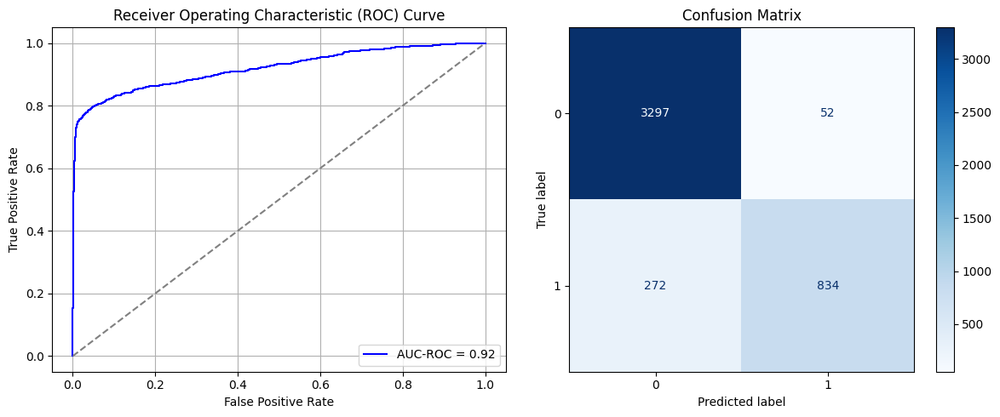

Best threshold based on F1-score: 0.6226513385772705
Time elapsed (performance): 26.02032904200007


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - AUC: 0.7187 - loss: 0.7180 - val_AUC: 0.6981 - val_loss: 0.5029
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7275 - loss: 0.5179 - val_AUC: 0.7048 - val_loss: 0.4938
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7274 - loss: 0.5102 - val_AUC: 0.7059 - val_loss: 0.4931
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7412 - loss: 0.4999 - val_AUC: 0.7070 - val_loss: 0.4930
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.4935 - val_AUC: 0.7060 - val_loss: 0.4942
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7434 - loss: 0.5062 - val_AUC: 0.7068 - val_loss: 0.4935
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7261 - loss: 0.4900 - val_AUC: 0.7069 - val_loss: 0.4931
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7392 - loss: 0.5041 - val_AUC: 0.707

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - AUC: 0.7227 - loss: 0.7261 - val_AUC: 0.6978 - val_loss: 0.5031
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7216 - loss: 0.5078 - val_AUC: 0.7043 - val_loss: 0.4948
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 - loss: 0.5079 - val_AUC: 0.7056 - val_loss: 0.4956
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7313 - loss: 0.4997 - val_AUC: 0.7053 - val_loss: 0.4929
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss: 0.4980 - val_AUC: 0.7059 - val_loss: 0.4934
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7270 - loss: 0.5001 - val_AUC: 0.7063 - val_loss: 0.4947
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.4966 - val_AUC: 0.7074 - val_loss: 0.4941
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 - loss: 0.5031 - val_AUC: 0.7076 - val_loss: 0.4942
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7292 - loss: 0.4989 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.6884 - loss: 0.7899 - val_AUC: 0.6994 - val_loss: 0.5024
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5172 - val_AUC: 0.7044 - val_loss: 0.4937
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7278 - loss: 0.5003 - val_AUC: 0.7042 - val_loss: 0.4941
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7436 - loss: 0.4983 - val_AUC: 0.7054 - val_loss: 0.4942
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7395 - loss: 0.4952 - val_AUC: 0.7065 - val_loss: 0.4930
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5030 - val_AUC: 0.7062 - val_loss: 0.4940
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7348 - loss: 0.4851 - val_AUC: 0.7064 - val_loss: 0.4960
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.4962 - val_AUC: 0.7077 - val_loss: 0.4929
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7228 - loss: 0.5068 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - AUC: 0.7025 - loss: 0.7728 - val_AUC: 0.6973 - val_loss: 0.5088
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7089 - loss: 0.5167 - val_AUC: 0.7046 - val_loss: 0.4945
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7102 - loss: 0.5066 - val_AUC: 0.7051 - val_loss: 0.4936
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.5141 - val_AUC: 0.7050 - val_loss: 0.4931
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.5003 - val_AUC: 0.7059 - val_loss: 0.4938
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7013 - loss: 0.5202 - val_AUC: 0.7062 - val_loss: 0.4931
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.4989 - val_AUC: 0.7061 - val_loss: 0.4950
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.4958 - val_AUC: 0.7062 - val_loss: 0.4935
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7283 - loss: 0.5166 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7204 - loss: 0.7362 - val_AUC: 0.6990 - val_loss: 0.5054
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7244 - loss: 0.5131 - val_AUC: 0.7051 - val_loss: 0.4946
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7176 - loss: 0.5055 - val_AUC: 0.7054 - val_loss: 0.4934
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.4961 - val_AUC: 0.7061 - val_loss: 0.4940
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5085 - val_AUC: 0.7063 - val_loss: 0.4932
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5115 - val_AUC: 0.7059 - val_loss: 0.4936
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5107 - val_AUC: 0.7061 - val_loss: 0.4946
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7260 - loss: 0.5126 - val_AUC: 0.7068 - val_loss: 0.4951
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7305 - loss: 0.5074 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7303 - loss: 0.7093 - val_AUC: 0.6990 - val_loss: 0.5015
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7473 - loss: 0.4912 - val_AUC: 0.7043 - val_loss: 0.4976
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5042 - val_AUC: 0.7063 - val_loss: 0.4940
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.4899 - val_AUC: 0.7058 - val_loss: 0.4938
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7344 - loss: 0.4890 - val_AUC: 0.7061 - val_loss: 0.4945
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7163 - loss: 0.5063 - val_AUC: 0.7060 - val_loss: 0.4931
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7319 - loss: 0.4980 - val_AUC: 0.7066 - val_loss: 0.4934
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7118 - loss: 0.5096 - val_AUC: 0.7068 - val_loss: 0.4935
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7330 - loss: 0.4968 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7178 - loss: 0.7537 - val_AUC: 0.6985 - val_loss: 0.5069
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.6952 - loss: 0.5193 - val_AUC: 0.7046 - val_loss: 0.4943
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.4966 - val_AUC: 0.7059 - val_loss: 0.4932
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5058 - val_AUC: 0.7069 - val_loss: 0.4928
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7386 - loss: 0.4970 - val_AUC: 0.7070 - val_loss: 0.4952
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7341 - loss: 0.4900 - val_AUC: 0.7057 - val_loss: 0.4951
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7435 - loss: 0.4919 - val_AUC: 0.7078 - val_loss: 0.4955
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7371 - loss: 0.4964 - val_AUC: 0.7084 - val_loss: 0.4934
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7326 - loss: 0.4863 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7016 - loss: 0.7336 - val_AUC: 0.6973 - val_loss: 0.5050
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7342 - loss: 0.5102 - val_AUC: 0.7042 - val_loss: 0.4940
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7263 - loss: 0.5229 - val_AUC: 0.7059 - val_loss: 0.4942
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7173 - loss: 0.5090 - val_AUC: 0.7062 - val_loss: 0.4939
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7320 - loss: 0.5058 - val_AUC: 0.7067 - val_loss: 0.4949
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7424 - loss: 0.4920 - val_AUC: 0.7070 - val_loss: 0.4951
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5139 - val_AUC: 0.7072 - val_loss: 0.4931
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.4746 - val_AUC: 0.7077 - val_loss: 0.4942
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7286 - loss: 0.5057 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - AUC: 0.7135 - loss: 0.7527 - val_AUC: 0.6974 - val_loss: 0.5051
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.5126 - val_AUC: 0.7049 - val_loss: 0.4967
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7246 - loss: 0.5028 - val_AUC: 0.7059 - val_loss: 0.4937
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7162 - loss: 0.5174 - val_AUC: 0.7056 - val_loss: 0.4935
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7126 - loss: 0.5061 - val_AUC: 0.7060 - val_loss: 0.4932
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7128 - loss: 0.5184 - val_AUC: 0.7065 - val_loss: 0.4928
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5191 - val_AUC: 0.7063 - val_loss: 0.4930
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7427 - loss: 0.4953 - val_AUC: 0.7074 - val_loss: 0.4948
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5116 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7349 - loss: 0.7240 - val_AUC: 0.6985 - val_loss: 0.5046
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7266 - loss: 0.5184 - val_AUC: 0.7053 - val_loss: 0.4949
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7368 - loss: 0.4982 - val_AUC: 0.7036 - val_loss: 0.4938
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7311 - loss: 0.5043 - val_AUC: 0.7060 - val_loss: 0.4930
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7194 - loss: 0.5082 - val_AUC: 0.7060 - val_loss: 0.4936
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7190 - loss: 0.5129 - val_AUC: 0.7063 - val_loss: 0.4940
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.5008 - val_AUC: 0.7078 - val_loss: 0.4934
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7458 - loss: 0.5035 - val_AUC: 0.7076 - val_loss: 0.4939
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7448 - loss: 0.4901 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7153 - loss: 0.7247 - val_AUC: 0.6977 - val_loss: 0.5042
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 - loss: 0.5016 - val_AUC: 0.7059 - val_loss: 0.4937
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7424 - loss: 0.4893 - val_AUC: 0.7068 - val_loss: 0.4943
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7314 - loss: 0.5032 - val_AUC: 0.7064 - val_loss: 0.4946
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7317 - loss: 0.5048 - val_AUC: 0.7072 - val_loss: 0.4929
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5038 - val_AUC: 0.7074 - val_loss: 0.4934
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6980 - loss: 0.5110 - val_AUC: 0.7074 - val_loss: 0.4930
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5037 - val_AUC: 0.7081 - val_loss: 0.4948
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7542 - loss: 0.4971 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7198 - loss: 0.7639 - val_AUC: 0.6987 - val_loss: 0.5015
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7366 - loss: 0.5014 - val_AUC: 0.7041 - val_loss: 0.4949
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.4969 - val_AUC: 0.7066 - val_loss: 0.4941
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5086 - val_AUC: 0.7062 - val_loss: 0.4932
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.5027 - val_AUC: 0.7063 - val_loss: 0.4934
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5121 - val_AUC: 0.7074 - val_loss: 0.4944
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7244 - loss: 0.5037 - val_AUC: 0.7070 - val_loss: 0.4929
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7344 - loss: 0.4990 - val_AUC: 0.7073 - val_loss: 0.4939
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss: 0.4992 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - AUC: 0.7288 - loss: 0.7042 - val_AUC: 0.6979 - val_loss: 0.5019
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7278 - loss: 0.5009 - val_AUC: 0.7057 - val_loss: 0.4941
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5095 - val_AUC: 0.7065 - val_loss: 0.4924
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7183 - loss: 0.5160 - val_AUC: 0.7054 - val_loss: 0.4933
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.5006 - val_AUC: 0.7072 - val_loss: 0.4940
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.4913 - val_AUC: 0.7075 - val_loss: 0.4941
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.4970 - val_AUC: 0.7074 - val_loss: 0.4933
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.4995 - val_AUC: 0.7078 - val_loss: 0.4931
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7179 - loss: 0.4991 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7053 - loss: 0.7493 - val_AUC: 0.6986 - val_loss: 0.5033
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5094 - val_AUC: 0.7062 - val_loss: 0.4944
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7337 - loss: 0.5011 - val_AUC: 0.7056 - val_loss: 0.4928
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7504 - loss: 0.4905 - val_AUC: 0.7053 - val_loss: 0.4947
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7363 - loss: 0.5074 - val_AUC: 0.7063 - val_loss: 0.4932
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.5000 - val_AUC: 0.7062 - val_loss: 0.4936
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7394 - loss: 0.4941 - val_AUC: 0.7059 - val_loss: 0.4935
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7339 - loss: 0.5163 - val_AUC: 0.7063 - val_loss: 0.4930
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7277 - loss: 0.5095 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - AUC: 0.7152 - loss: 0.7405 - val_AUC: 0.6982 - val_loss: 0.5047
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7359 - loss: 0.4979 - val_AUC: 0.7054 - val_loss: 0.4963
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7306 - loss: 0.5000 - val_AUC: 0.7055 - val_loss: 0.4933
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7135 - loss: 0.5062 - val_AUC: 0.7055 - val_loss: 0.4931
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.4945 - val_AUC: 0.7055 - val_loss: 0.4937
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.4928 - val_AUC: 0.7073 - val_loss: 0.4930
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7456 - loss: 0.5036 - val_AUC: 0.7052 - val_loss: 0.4938
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5048 - val_AUC: 0.7086 - val_loss: 0.4932
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7366 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - AUC: 0.7257 - loss: 0.7469 - val_AUC: 0.6980 - val_loss: 0.5058
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7238 - loss: 0.5057 - val_AUC: 0.7048 - val_loss: 0.4945
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5090 - val_AUC: 0.7060 - val_loss: 0.4935
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7259 - loss: 0.5041 - val_AUC: 0.7062 - val_loss: 0.4930
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7249 - loss: 0.5051 - val_AUC: 0.7054 - val_loss: 0.4929
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7147 - loss: 0.5056 - val_AUC: 0.7057 - val_loss: 0.4925
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7518 - loss: 0.4889 - val_AUC: 0.7062 - val_loss: 0.4961
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7449 - loss: 0.5011 - val_AUC: 0.7066 - val_loss: 0.4943
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - AUC: 0.7266 - loss: 0.7248 - val_AUC: 0.6973 - val_loss: 0.5088
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7236 - loss: 0.5127 - val_AUC: 0.7057 - val_loss: 0.4956
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7384 - loss: 0.5029 - val_AUC: 0.7062 - val_loss: 0.4937
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5004 - val_AUC: 0.7056 - val_loss: 0.4936
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7292 - loss: 0.4949 - val_AUC: 0.7074 - val_loss: 0.4937
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7189 - loss: 0.5112 - val_AUC: 0.7073 - val_loss: 0.4927
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7318 - loss: 0.4898 - val_AUC: 0.7072 - val_loss: 0.4942
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5090 - val_AUC: 0.7079 - val_loss: 0.4944
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7452 - loss: 0.4860 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7300 - loss: 0.7306 - val_AUC: 0.6969 - val_loss: 0.5059
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5104 - val_AUC: 0.7046 - val_loss: 0.4957
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7146 - loss: 0.5255 - val_AUC: 0.7055 - val_loss: 0.4950
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5224 - val_AUC: 0.7068 - val_loss: 0.4943
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7486 - loss: 0.4843 - val_AUC: 0.7067 - val_loss: 0.4942
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7270 - loss: 0.5058 - val_AUC: 0.7064 - val_loss: 0.4933
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7411 - loss: 0.4997 - val_AUC: 0.7060 - val_loss: 0.4939
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5141 - val_AUC: 0.7073 - val_loss: 0.4934
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7097 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - AUC: 0.6878 - loss: 0.8477 - val_AUC: 0.6985 - val_loss: 0.5098
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7232 - loss: 0.5210 - val_AUC: 0.7058 - val_loss: 0.4945
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.5167 - val_AUC: 0.7068 - val_loss: 0.4927
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.4947 - val_AUC: 0.7068 - val_loss: 0.4935
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7177 - loss: 0.5071 - val_AUC: 0.7057 - val_loss: 0.4931
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7368 - loss: 0.4909 - val_AUC: 0.7070 - val_loss: 0.4934
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7525 - loss: 0.4782 - val_AUC: 0.7067 - val_loss: 0.4955
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7347 - loss: 0.5051 - val_AUC: 0.7080 - val_loss: 0.4936
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7404 - loss: 0.4895 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7186 - loss: 0.7326 - val_AUC: 0.6992 - val_loss: 0.5041
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7217 - loss: 0.5070 - val_AUC: 0.7059 - val_loss: 0.4940
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7358 - loss: 0.4935 - val_AUC: 0.7066 - val_loss: 0.4948
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.4951 - val_AUC: 0.7073 - val_loss: 0.4932
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7283 - loss: 0.4944 - val_AUC: 0.7063 - val_loss: 0.4930
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7362 - loss: 0.4960 - val_AUC: 0.7064 - val_loss: 0.4930
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7567 - loss: 0.4861 - val_AUC: 0.7074 - val_loss: 0.4940
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7372 - loss: 0.5008 - val_AUC: 0.7072 - val_loss: 0.4935
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.4941 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.7060 - loss: 0.4924 - val_AUC: 0.9017 - val_loss: 0.2548
Epoch 2/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8949 - loss: 0.2609 - val_AUC: 0.9126 - val_loss: 0.2427
Epoch 3/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9023 - loss: 0.2577 - val_AUC: 0.9168 - val_loss: 0.2381
Epoch 4/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9113 - loss: 0.2433 - val_AUC: 0.9163 - val_loss: 0.2383
Epoch 5/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9198 - loss: 0.2288 - val_AUC: 0.9167 - val_loss: 0.2360
Epoch 6/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9184 - loss: 0.2381 - val_AUC: 0.9207 - val_loss: 0.2311
Epoch 7/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9244 - loss: 0.2288 - val_AUC: 0.9208 - val_loss: 0.2338
Epoch 8/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9210 - loss: 0.2323 - val_AUC: 0.9205 - val_loss: 0.2371
Epoch 9/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

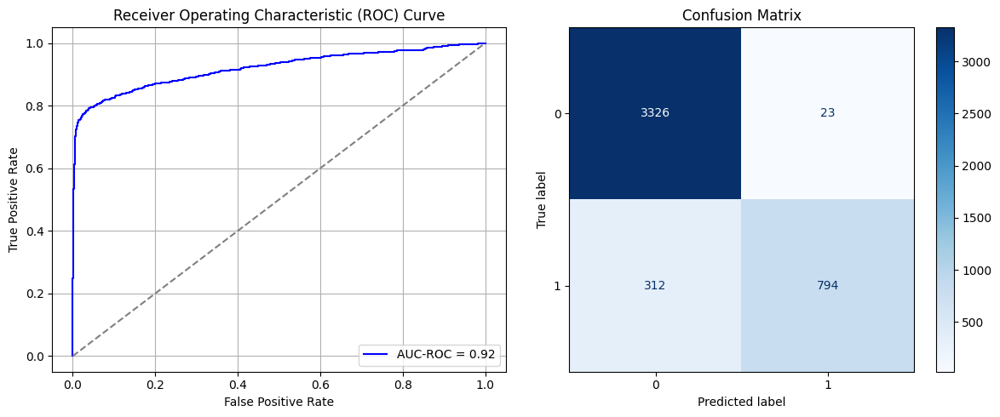

Best threshold based on F1-score: 0.34395527839660645
Time elapsed (performance): 29.90559845900009


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7103 - loss: 0.7023 - val_AUC: 0.7149 - val_loss: 0.4985
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5031 - val_AUC: 0.7148 - val_loss: 0.4976
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7064 - loss: 0.5078 - val_AUC: 0.7162 - val_loss: 0.4954
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.5159 - val_AUC: 0.7162 - val_loss: 0.4968
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.5077 - val_AUC: 0.7175 - val_loss: 0.4947
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7274 - loss: 0.4956 - val_AUC: 0.7177 - val_loss: 0.4952
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.4915 - val_AUC: 0.7188 - val_loss: 0.4943
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5128 - val_AUC: 0.7186 - val_loss: 0.4938
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.7062 - loss: 0.7028 - val_AUC: 0.7141 - val_loss: 0.4992
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7165 - loss: 0.5065 - val_AUC: 0.7150 - val_loss: 0.4985
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.5077 - val_AUC: 0.7157 - val_loss: 0.4972
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7154 - loss: 0.5068 - val_AUC: 0.7163 - val_loss: 0.4960
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7290 - loss: 0.5001 - val_AUC: 0.7167 - val_loss: 0.4957
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7141 - loss: 0.5000 - val_AUC: 0.7174 - val_loss: 0.4963
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7298 - loss: 0.4978 - val_AUC: 0.7189 - val_loss: 0.4949
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7326 - loss: 0.5029 - val_AUC: 0.7178 - val_loss: 0.4959
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7233 - loss: 0.5031 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7157 - loss: 0.6805 - val_AUC: 0.7150 - val_loss: 0.4991
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.4926 - val_AUC: 0.7160 - val_loss: 0.5000
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7049 - loss: 0.5286 - val_AUC: 0.7167 - val_loss: 0.4960
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7295 - loss: 0.4951 - val_AUC: 0.7176 - val_loss: 0.4957
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7210 - loss: 0.5142 - val_AUC: 0.7183 - val_loss: 0.4953
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7024 - loss: 0.5063 - val_AUC: 0.7187 - val_loss: 0.4947
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7052 - loss: 0.5132 - val_AUC: 0.7196 - val_loss: 0.4937
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.4859 - val_AUC: 0.7180 - val_loss: 0.4960
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.4867 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6978 - loss: 0.7179 - val_AUC: 0.7147 - val_loss: 0.4983
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7062 - loss: 0.5153 - val_AUC: 0.7154 - val_loss: 0.4964
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6909 - loss: 0.5247 - val_AUC: 0.7170 - val_loss: 0.4954
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7178 - loss: 0.5036 - val_AUC: 0.7172 - val_loss: 0.4966
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5023 - val_AUC: 0.7173 - val_loss: 0.4962
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.4987 - val_AUC: 0.7176 - val_loss: 0.4950
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.4984 - val_AUC: 0.7184 - val_loss: 0.4956
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7168 - loss: 0.4929 - val_AUC: 0.7181 - val_loss: 0.4946
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7214 - loss: 0.4999 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.6916 - loss: 0.7248 - val_AUC: 0.7149 - val_loss: 0.5009
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7146 - loss: 0.5118 - val_AUC: 0.7154 - val_loss: 0.4990
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7204 - loss: 0.4986 - val_AUC: 0.7159 - val_loss: 0.4973
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7361 - loss: 0.4898 - val_AUC: 0.7169 - val_loss: 0.4967
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7061 - loss: 0.5212 - val_AUC: 0.7177 - val_loss: 0.4958
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7260 - loss: 0.4905 - val_AUC: 0.7174 - val_loss: 0.4971
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.4840 - val_AUC: 0.7180 - val_loss: 0.4944
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.5012 - val_AUC: 0.7188 - val_loss: 0.4944
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5076 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6983 - loss: 0.7233 - val_AUC: 0.7121 - val_loss: 0.5031
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7108 - loss: 0.5281 - val_AUC: 0.7165 - val_loss: 0.5001
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.5032 - val_AUC: 0.7173 - val_loss: 0.4959
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7239 - loss: 0.4979 - val_AUC: 0.7171 - val_loss: 0.4968
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7182 - loss: 0.5087 - val_AUC: 0.7179 - val_loss: 0.4963
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7334 - loss: 0.5078 - val_AUC: 0.7171 - val_loss: 0.4973
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7167 - loss: 0.5075 - val_AUC: 0.7198 - val_loss: 0.4953
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7258 - loss: 0.5008 - val_AUC: 0.7194 - val_loss: 0.4937
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7198 - loss: 0.5130 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7135 - loss: 0.6994 - val_AUC: 0.7145 - val_loss: 0.4986
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7116 - loss: 0.5069 - val_AUC: 0.7153 - val_loss: 0.4967
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5067 - val_AUC: 0.7161 - val_loss: 0.4962
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7167 - loss: 0.5051 - val_AUC: 0.7161 - val_loss: 0.4987
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7400 - loss: 0.4944 - val_AUC: 0.7164 - val_loss: 0.4976
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.4902 - val_AUC: 0.7170 - val_loss: 0.4972
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7202 - loss: 0.5033 - val_AUC: 0.7179 - val_loss: 0.4954
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6994 - loss: 0.5065 - val_AUC: 0.7186 - val_loss: 0.4939
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5038 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - AUC: 0.7024 - loss: 0.7132 - val_AUC: 0.7152 - val_loss: 0.4991
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5023 - val_AUC: 0.7161 - val_loss: 0.4976
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.4974 - val_AUC: 0.7159 - val_loss: 0.4970
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7402 - loss: 0.5111 - val_AUC: 0.7156 - val_loss: 0.4964
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7111 - loss: 0.5103 - val_AUC: 0.7171 - val_loss: 0.4947
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6928 - loss: 0.5204 - val_AUC: 0.7178 - val_loss: 0.4951
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7089 - loss: 0.5151 - val_AUC: 0.7179 - val_loss: 0.4939
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.4976 - val_AUC: 0.7174 - val_loss: 0.4950
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5068 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - AUC: 0.7217 - loss: 0.6932 - val_AUC: 0.7136 - val_loss: 0.4996
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7224 - loss: 0.4964 - val_AUC: 0.7151 - val_loss: 0.4971
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7241 - loss: 0.5022 - val_AUC: 0.7161 - val_loss: 0.4973
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7172 - loss: 0.5113 - val_AUC: 0.7166 - val_loss: 0.4964
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7358 - loss: 0.4892 - val_AUC: 0.7167 - val_loss: 0.4972
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7385 - loss: 0.5044 - val_AUC: 0.7179 - val_loss: 0.4961
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5034 - val_AUC: 0.7192 - val_loss: 0.4950
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.4992 - val_AUC: 0.7181 - val_loss: 0.4948
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7132 - loss: 0.5234 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - AUC: 0.7189 - loss: 0.6687 - val_AUC: 0.7139 - val_loss: 0.4992
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7169 - loss: 0.5211 - val_AUC: 0.7151 - val_loss: 0.4974
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6987 - loss: 0.5133 - val_AUC: 0.7157 - val_loss: 0.4967
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5072 - val_AUC: 0.7163 - val_loss: 0.4970
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7027 - loss: 0.5123 - val_AUC: 0.7168 - val_loss: 0.4950
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5076 - val_AUC: 0.7163 - val_loss: 0.4953
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7445 - loss: 0.4850 - val_AUC: 0.7175 - val_loss: 0.4978
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5175 - val_AUC: 0.7173 - val_loss: 0.4950
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7339 - loss: 0.4962 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7084 - loss: 0.7409 - val_AUC: 0.7143 - val_loss: 0.4999
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7103 - loss: 0.5161 - val_AUC: 0.7144 - val_loss: 0.4971
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7137 - loss: 0.4958 - val_AUC: 0.7158 - val_loss: 0.4975
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7290 - loss: 0.5045 - val_AUC: 0.7164 - val_loss: 0.4968
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7243 - loss: 0.4905 - val_AUC: 0.7175 - val_loss: 0.4957
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.4966 - val_AUC: 0.7171 - val_loss: 0.4946
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.5136 - val_AUC: 0.7182 - val_loss: 0.4961
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7368 - loss: 0.4932 - val_AUC: 0.7175 - val_loss: 0.4954
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7113 - loss: 0.5023 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7176 - loss: 0.6908 - val_AUC: 0.7145 - val_loss: 0.4981
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7114 - loss: 0.5028 - val_AUC: 0.7146 - val_loss: 0.4983
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6983 - loss: 0.5222 - val_AUC: 0.7174 - val_loss: 0.4957
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7272 - loss: 0.5098 - val_AUC: 0.7171 - val_loss: 0.4960
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7147 - loss: 0.5109 - val_AUC: 0.7178 - val_loss: 0.4954
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5027 - val_AUC: 0.7170 - val_loss: 0.4954
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7087 - loss: 0.4994 - val_AUC: 0.7176 - val_loss: 0.4955
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5115 - val_AUC: 0.7181 - val_loss: 0.4941
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7091 - loss: 0.5125 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6896 - loss: 0.7436 - val_AUC: 0.7136 - val_loss: 0.4994
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7237 - loss: 0.5073 - val_AUC: 0.7149 - val_loss: 0.4992
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5057 - val_AUC: 0.7157 - val_loss: 0.4983
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7137 - loss: 0.4994 - val_AUC: 0.7180 - val_loss: 0.4949
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7175 - loss: 0.5043 - val_AUC: 0.7178 - val_loss: 0.4946
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7176 - loss: 0.4935 - val_AUC: 0.7178 - val_loss: 0.4947
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5101 - val_AUC: 0.7178 - val_loss: 0.4938
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7369 - loss: 0.4970 - val_AUC: 0.7177 - val_loss: 0.4944
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7296 - loss: 0.5026 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - AUC: 0.7084 - loss: 0.6700 - val_AUC: 0.7152 - val_loss: 0.4983
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7085 - loss: 0.5152 - val_AUC: 0.7162 - val_loss: 0.4973
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7187 - loss: 0.5089 - val_AUC: 0.7169 - val_loss: 0.4957
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5018 - val_AUC: 0.7157 - val_loss: 0.4969
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7288 - loss: 0.4950 - val_AUC: 0.7171 - val_loss: 0.4978
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7233 - loss: 0.4969 - val_AUC: 0.7178 - val_loss: 0.4949
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6939 - loss: 0.5375 - val_AUC: 0.7188 - val_loss: 0.4952
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.5021 - val_AUC: 0.7181 - val_loss: 0.4942
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.4932 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - AUC: 0.6878 - loss: 0.7708 - val_AUC: 0.7141 - val_loss: 0.4994
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7289 - loss: 0.5042 - val_AUC: 0.7147 - val_loss: 0.4983
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7290 - loss: 0.5024 - val_AUC: 0.7153 - val_loss: 0.4979
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7074 - loss: 0.5118 - val_AUC: 0.7165 - val_loss: 0.4981
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.5055 - val_AUC: 0.7175 - val_loss: 0.4953
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7186 - loss: 0.5164 - val_AUC: 0.7182 - val_loss: 0.4953
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7131 - loss: 0.5026 - val_AUC: 0.7179 - val_loss: 0.4943
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7098 - loss: 0.5095 - val_AUC: 0.7189 - val_loss: 0.4944
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7136 - loss: 0.4991 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7228 - loss: 0.7041 - val_AUC: 0.7150 - val_loss: 0.4992
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7239 - loss: 0.5040 - val_AUC: 0.7157 - val_loss: 0.4985
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7156 - loss: 0.5098 - val_AUC: 0.7159 - val_loss: 0.4968
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7167 - loss: 0.5102 - val_AUC: 0.7159 - val_loss: 0.4965
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7240 - loss: 0.5000 - val_AUC: 0.7166 - val_loss: 0.4970
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7080 - loss: 0.5173 - val_AUC: 0.7184 - val_loss: 0.4945
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7115 - loss: 0.5039 - val_AUC: 0.7176 - val_loss: 0.4939
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5076 - val_AUC: 0.7171 - val_loss: 0.4948
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7276 - loss: 0.5060 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6955 - loss: 0.7514 - val_AUC: 0.7148 - val_loss: 0.4994
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7028 - loss: 0.5207 - val_AUC: 0.7153 - val_loss: 0.4969
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5037 - val_AUC: 0.7146 - val_loss: 0.4984
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.5069 - val_AUC: 0.7166 - val_loss: 0.4966
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7063 - loss: 0.5142 - val_AUC: 0.7170 - val_loss: 0.4954
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7249 - loss: 0.5028 - val_AUC: 0.7176 - val_loss: 0.4950
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.4977 - val_AUC: 0.7188 - val_loss: 0.4956
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.5155 - val_AUC: 0.7192 - val_loss: 0.4947
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7432 - loss: 0.4846 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6968 - loss: 0.7496 - val_AUC: 0.7146 - val_loss: 0.4987
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7174 - loss: 0.5245 - val_AUC: 0.7143 - val_loss: 0.4977
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7082 - loss: 0.5056 - val_AUC: 0.7164 - val_loss: 0.4968
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7187 - loss: 0.5116 - val_AUC: 0.7164 - val_loss: 0.4968
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.5220 - val_AUC: 0.7160 - val_loss: 0.4961
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7235 - loss: 0.5127 - val_AUC: 0.7174 - val_loss: 0.4951
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5033 - val_AUC: 0.7181 - val_loss: 0.4955
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7281 - loss: 0.4936 - val_AUC: 0.7170 - val_loss: 0.4957
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.5013 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.6908 - loss: 0.7402 - val_AUC: 0.7156 - val_loss: 0.4987
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7125 - loss: 0.5260 - val_AUC: 0.7153 - val_loss: 0.4984
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.4897 - val_AUC: 0.7161 - val_loss: 0.4987
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.5069 - val_AUC: 0.7163 - val_loss: 0.4964
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7048 - loss: 0.5259 - val_AUC: 0.7169 - val_loss: 0.4949
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.4973 - val_AUC: 0.7182 - val_loss: 0.4960
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7308 - loss: 0.4822 - val_AUC: 0.7177 - val_loss: 0.4984
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7181 - loss: 0.5023 - val_AUC: 0.7179 - val_loss: 0.4952
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5000 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.6988 - loss: 0.7624 - val_AUC: 0.7145 - val_loss: 0.4988
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7033 - loss: 0.5150 - val_AUC: 0.7153 - val_loss: 0.4967
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7003 - loss: 0.5145 - val_AUC: 0.7148 - val_loss: 0.4967
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7125 - loss: 0.5065 - val_AUC: 0.7164 - val_loss: 0.4958
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.5187 - val_AUC: 0.7167 - val_loss: 0.4959
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7360 - loss: 0.4889 - val_AUC: 0.7173 - val_loss: 0.4959
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5038 - val_AUC: 0.7186 - val_loss: 0.4944
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7047 - loss: 0.5165 - val_AUC: 0.7174 - val_loss: 0.4936
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5052 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - AUC: 0.7166 - loss: 0.4866 - val_AUC: 0.9071 - val_loss: 0.2526
Epoch 2/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9016 - loss: 0.2552 - val_AUC: 0.9134 - val_loss: 0.2451
Epoch 3/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9113 - loss: 0.2487 - val_AUC: 0.9154 - val_loss: 0.2431
Epoch 4/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9196 - loss: 0.2292 - val_AUC: 0.9235 - val_loss: 0.2326
Epoch 5/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9198 - loss: 0.2346 - val_AUC: 0.9258 - val_loss: 0.2354
Epoch 6/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9282 - loss: 0.2196 - val_AUC: 0.9253 - val_loss: 0.2264
Epoch 7/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9235 - loss: 0.2225 - val_AUC: 0.9199 - val_loss: 0.2351
Epoch 8/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9268 - loss: 0.2258 - val_AUC: 0.9270 - val_loss: 0.2229
Epoch 9/10
446/446 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

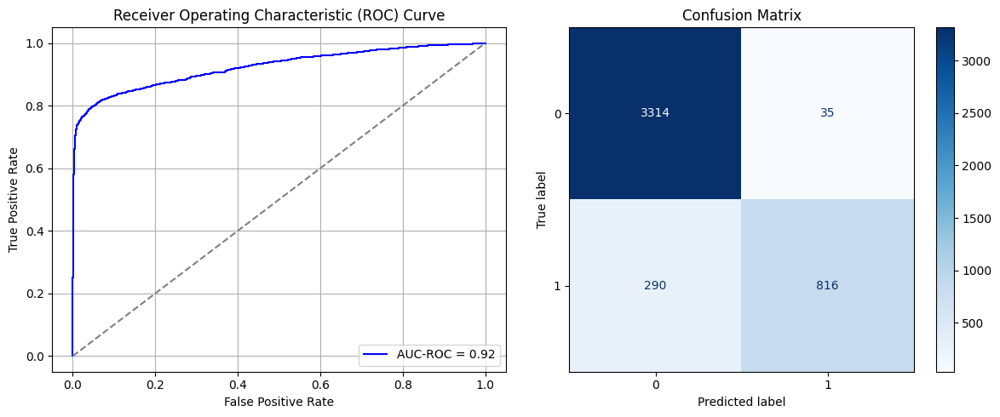

Best threshold based on F1-score: 0.43809473514556885
Time elapsed (performance): 27.947094102999927


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - AUC: 0.7309 - loss: 0.6495 - val_AUC: 0.7259 - val_loss: 0.4962
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7386 - loss: 0.4986 - val_AUC: 0.7251 - val_loss: 0.4941
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7307 - loss: 0.4960 - val_AUC: 0.7244 - val_loss: 0.4930
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5040 - val_AUC: 0.7254 - val_loss: 0.4925
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.5144 - val_AUC: 0.7263 - val_loss: 0.4910
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7374 - loss: 0.5008 - val_AUC: 0.7264 - val_loss: 0.4919
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7138 - loss: 0.4979 - val_AUC: 0.7278 - val_loss: 0.4907
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7053 - loss: 0.5158 - val_AUC: 0.727

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - AUC: 0.7219 - loss: 0.6268 - val_AUC: 0.7254 - val_loss: 0.4971
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.5120 - val_AUC: 0.7259 - val_loss: 0.4938
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7098 - loss: 0.5046 - val_AUC: 0.7257 - val_loss: 0.4934
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5022 - val_AUC: 0.7246 - val_loss: 0.4936
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7392 - loss: 0.5078 - val_AUC: 0.7247 - val_loss: 0.4929
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7298 - loss: 0.4866 - val_AUC: 0.7276 - val_loss: 0.4933
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7283 - loss: 0.4971 - val_AUC: 0.7251 - val_loss: 0.4927
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7186 - loss: 0.4999 - val_AUC: 0.7281 - val_loss: 0.4903
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.4933 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7200 - loss: 0.6506 - val_AUC: 0.7246 - val_loss: 0.4942
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7142 - loss: 0.5187 - val_AUC: 0.7245 - val_loss: 0.4940
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7200 - loss: 0.4877 - val_AUC: 0.7255 - val_loss: 0.4926
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.5159 - val_AUC: 0.7255 - val_loss: 0.4940
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5119 - val_AUC: 0.7258 - val_loss: 0.4924
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.4961 - val_AUC: 0.7254 - val_loss: 0.4926
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.4947 - val_AUC: 0.7257 - val_loss: 0.4923
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.4951 - val_AUC: 0.7247 - val_loss: 0.4926
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7117 - loss: 0.5013 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7078 - loss: 0.6688 - val_AUC: 0.7246 - val_loss: 0.4947
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5078 - val_AUC: 0.7257 - val_loss: 0.4941
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7043 - loss: 0.5211 - val_AUC: 0.7257 - val_loss: 0.4927
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7210 - loss: 0.5052 - val_AUC: 0.7252 - val_loss: 0.4934
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5124 - val_AUC: 0.7270 - val_loss: 0.4910
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7119 - loss: 0.5075 - val_AUC: 0.7266 - val_loss: 0.4911
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7156 - loss: 0.4952 - val_AUC: 0.7272 - val_loss: 0.4904
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - loss: 0.4925 - val_AUC: 0.7265 - val_loss: 0.4923
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7175 - loss: 0.5074 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7006 - loss: 0.6753 - val_AUC: 0.7253 - val_loss: 0.4944
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5048 - val_AUC: 0.7251 - val_loss: 0.4938
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7049 - loss: 0.5081 - val_AUC: 0.7264 - val_loss: 0.4930
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6988 - loss: 0.5141 - val_AUC: 0.7248 - val_loss: 0.4923
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.5009 - val_AUC: 0.7262 - val_loss: 0.4915
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7137 - loss: 0.5194 - val_AUC: 0.7259 - val_loss: 0.4915
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7169 - loss: 0.5035 - val_AUC: 0.7286 - val_loss: 0.4904
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7438 - loss: 0.4974 - val_AUC: 0.7279 - val_loss: 0.4907
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7159 - loss: 0.5083 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - AUC: 0.6920 - loss: 0.6952 - val_AUC: 0.7250 - val_loss: 0.4937
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7130 - loss: 0.5170 - val_AUC: 0.7254 - val_loss: 0.4936
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7086 - loss: 0.5096 - val_AUC: 0.7257 - val_loss: 0.4922
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7059 - loss: 0.5094 - val_AUC: 0.7264 - val_loss: 0.4917
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7064 - loss: 0.5067 - val_AUC: 0.7266 - val_loss: 0.4905
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5143 - val_AUC: 0.7260 - val_loss: 0.4907
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 - loss: 0.5165 - val_AUC: 0.7276 - val_loss: 0.4917
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5143 - val_AUC: 0.7252 - val_loss: 0.4937
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7283 - loss: 0.5077 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7112 - loss: 0.6338 - val_AUC: 0.7251 - val_loss: 0.4941
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.5103 - val_AUC: 0.7255 - val_loss: 0.4942
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7079 - loss: 0.5293 - val_AUC: 0.7249 - val_loss: 0.4930
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5141 - val_AUC: 0.7240 - val_loss: 0.4930
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7137 - loss: 0.5098 - val_AUC: 0.7268 - val_loss: 0.4907
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7044 - loss: 0.5142 - val_AUC: 0.7252 - val_loss: 0.4918
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.4947 - val_AUC: 0.7274 - val_loss: 0.4909
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7163 - loss: 0.5109 - val_AUC: 0.7258 - val_loss: 0.4923
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss:

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7191 - loss: 0.6227 - val_AUC: 0.7245 - val_loss: 0.4950
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5061 - val_AUC: 0.7250 - val_loss: 0.4936
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.5058 - val_AUC: 0.7262 - val_loss: 0.4926
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7266 - loss: 0.5001 - val_AUC: 0.7248 - val_loss: 0.4946
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7198 - loss: 0.5041 - val_AUC: 0.7272 - val_loss: 0.4911
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7188 - loss: 0.5134 - val_AUC: 0.7263 - val_loss: 0.4909
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5081 - val_AUC: 0.7279 - val_loss: 0.4898
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5097 - val_AUC: 0.7272 - val_loss: 0.4910
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7448 - loss: 0.4932 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7027 - loss: 0.6568 - val_AUC: 0.7244 - val_loss: 0.4945
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7028 - loss: 0.5159 - val_AUC: 0.7240 - val_loss: 0.4949
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7176 - loss: 0.5029 - val_AUC: 0.7263 - val_loss: 0.4920
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5118 - val_AUC: 0.7249 - val_loss: 0.4928
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7108 - loss: 0.5148 - val_AUC: 0.7264 - val_loss: 0.4915
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5129 - val_AUC: 0.7260 - val_loss: 0.4926
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.5083 - val_AUC: 0.7260 - val_loss: 0.4910
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7457 - loss: 0.4833 - val_AUC: 0.7278 - val_loss: 0.4938
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.4974 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7268 - loss: 0.6523 - val_AUC: 0.7247 - val_loss: 0.4948
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.5109 - val_AUC: 0.7248 - val_loss: 0.4939
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5029 - val_AUC: 0.7251 - val_loss: 0.4942
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7133 - loss: 0.5148 - val_AUC: 0.7275 - val_loss: 0.4910
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7085 - loss: 0.5108 - val_AUC: 0.7268 - val_loss: 0.4905
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7213 - loss: 0.5178 - val_AUC: 0.7256 - val_loss: 0.4915
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5045 - val_AUC: 0.7272 - val_loss: 0.4909
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7276 - loss: 0.4961 - val_AUC: 0.7264 - val_loss: 0.4913
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7336 - loss: 0.4897 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7335 - loss: 0.6252 - val_AUC: 0.7251 - val_loss: 0.4955
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5082 - val_AUC: 0.7251 - val_loss: 0.4942
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7153 - loss: 0.5091 - val_AUC: 0.7263 - val_loss: 0.4925
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6930 - loss: 0.5250 - val_AUC: 0.7267 - val_loss: 0.4931
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5042 - val_AUC: 0.7257 - val_loss: 0.4925
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7418 - loss: 0.4937 - val_AUC: 0.7239 - val_loss: 0.4942
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5075 - val_AUC: 0.7261 - val_loss: 0.4911
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7204 - loss: 0.5014 - val_AUC: 0.7277 - val_loss: 0.4908
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7235 - loss: 0.5099 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7057 - loss: 0.6556 - val_AUC: 0.7247 - val_loss: 0.4940
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7211 - loss: 0.5165 - val_AUC: 0.7239 - val_loss: 0.4947
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5196 - val_AUC: 0.7246 - val_loss: 0.4928
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5117 - val_AUC: 0.7261 - val_loss: 0.4919
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7124 - loss: 0.5086 - val_AUC: 0.7273 - val_loss: 0.4901
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.4931 - val_AUC: 0.7262 - val_loss: 0.4917
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.4928 - val_AUC: 0.7262 - val_loss: 0.4906
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7402 - loss: 0.4930 - val_AUC: 0.7255 - val_loss: 0.4936
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7200 - loss: 0.4949 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7095 - loss: 0.6612 - val_AUC: 0.7250 - val_loss: 0.4951
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7094 - loss: 0.5302 - val_AUC: 0.7235 - val_loss: 0.4951
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5045 - val_AUC: 0.7246 - val_loss: 0.4941
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7334 - loss: 0.4955 - val_AUC: 0.7254 - val_loss: 0.4932
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.4985 - val_AUC: 0.7258 - val_loss: 0.4919
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7203 - loss: 0.5023 - val_AUC: 0.7256 - val_loss: 0.4919
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.4959 - val_AUC: 0.7273 - val_loss: 0.4914
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.5039 - val_AUC: 0.7273 - val_loss: 0.4908
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7258 - loss: 0.4995 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - AUC: 0.6939 - loss: 0.6745 - val_AUC: 0.7249 - val_loss: 0.4937
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7227 - loss: 0.5098 - val_AUC: 0.7234 - val_loss: 0.4955
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7092 - loss: 0.5117 - val_AUC: 0.7260 - val_loss: 0.4921
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6991 - loss: 0.5124 - val_AUC: 0.7275 - val_loss: 0.4915
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7318 - loss: 0.4947 - val_AUC: 0.7269 - val_loss: 0.4920
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7292 - loss: 0.5064 - val_AUC: 0.7262 - val_loss: 0.4923
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7111 - loss: 0.5211 - val_AUC: 0.7281 - val_loss: 0.4891
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7239 - loss: 0.5030 - val_AUC: 0.7259 - val_loss: 0.4923
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7279 - loss: 0.5037 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - AUC: 0.7021 - loss: 0.6454 - val_AUC: 0.7246 - val_loss: 0.4951
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7302 - loss: 0.5073 - val_AUC: 0.7241 - val_loss: 0.4945
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7303 - loss: 0.5036 - val_AUC: 0.7225 - val_loss: 0.4954
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7226 - loss: 0.5125 - val_AUC: 0.7228 - val_loss: 0.4944
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.4919 - val_AUC: 0.7270 - val_loss: 0.4919
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7215 - loss: 0.4948 - val_AUC: 0.7273 - val_loss: 0.4921
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7017 - loss: 0.5169 - val_AUC: 0.7276 - val_loss: 0.4903
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5082 - val_AUC: 0.7279 - val_loss: 0.4926
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7217 - loss: 0.5060 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - AUC: 0.7110 - loss: 0.6433 - val_AUC: 0.7239 - val_loss: 0.4946
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7190 - loss: 0.5113 - val_AUC: 0.7255 - val_loss: 0.4930
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7281 - loss: 0.4946 - val_AUC: 0.7255 - val_loss: 0.4929
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.4988 - val_AUC: 0.7235 - val_loss: 0.4940
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.5097 - val_AUC: 0.7241 - val_loss: 0.4920
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7173 - loss: 0.5069 - val_AUC: 0.7275 - val_loss: 0.4911
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7195 - loss: 0.4991 - val_AUC: 0.7272 - val_loss: 0.4915
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7264 - loss: 0.5052 - val_AUC: 0.7272 - val_loss: 0.4899
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7080 - loss: 0.5116 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - AUC: 0.7109 - loss: 0.6720 - val_AUC: 0.7245 - val_loss: 0.4943
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7215 - loss: 0.5153 - val_AUC: 0.7245 - val_loss: 0.4955
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5056 - val_AUC: 0.7251 - val_loss: 0.4944
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7280 - loss: 0.4975 - val_AUC: 0.7263 - val_loss: 0.4924
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.4988 - val_AUC: 0.7265 - val_loss: 0.4917
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7293 - loss: 0.4972 - val_AUC: 0.7248 - val_loss: 0.4925
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7118 - loss: 0.5125 - val_AUC: 0.7278 - val_loss: 0.4901
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7475 - loss: 0.4746 - val_AUC: 0.7243 - val_loss: 0.4950
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7101 - loss: 0.5049 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7143 - loss: 0.6582 - val_AUC: 0.7239 - val_loss: 0.4951
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7208 - loss: 0.4977 - val_AUC: 0.7247 - val_loss: 0.4939
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5011 - val_AUC: 0.7254 - val_loss: 0.4930
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7249 - loss: 0.4964 - val_AUC: 0.7273 - val_loss: 0.4914
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7067 - loss: 0.5065 - val_AUC: 0.7266 - val_loss: 0.4905
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5047 - val_AUC: 0.7268 - val_loss: 0.4900
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5020 - val_AUC: 0.7272 - val_loss: 0.4897
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7104 - loss: 0.5117 - val_AUC: 0.7278 - val_loss: 0.4891
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7303 - loss: 0.4869 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - AUC: 0.7187 - loss: 0.6678 - val_AUC: 0.7249 - val_loss: 0.4948
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7221 - loss: 0.4958 - val_AUC: 0.7236 - val_loss: 0.4949
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.4922 - val_AUC: 0.7250 - val_loss: 0.4933
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7106 - loss: 0.5045 - val_AUC: 0.7269 - val_loss: 0.4910
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7036 - loss: 0.5315 - val_AUC: 0.7255 - val_loss: 0.4923
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7217 - loss: 0.5129 - val_AUC: 0.7250 - val_loss: 0.4920
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.4956 - val_AUC: 0.7268 - val_loss: 0.4911
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7270 - loss: 0.5021 - val_AUC: 0.7263 - val_loss: 0.4920
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7159 - loss: 0.5028 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - AUC: 0.7139 - loss: 0.6341 - val_AUC: 0.7231 - val_loss: 0.4946
Epoch 2/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7245 - loss: 0.5109 - val_AUC: 0.7251 - val_loss: 0.4938
Epoch 3/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7050 - loss: 0.5001 - val_AUC: 0.7273 - val_loss: 0.4914
Epoch 4/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7076 - loss: 0.5226 - val_AUC: 0.7265 - val_loss: 0.4922
Epoch 5/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5062 - val_AUC: 0.7255 - val_loss: 0.4916
Epoch 6/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7077 - loss: 0.5226 - val_AUC: 0.7266 - val_loss: 0.4906
Epoch 7/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7273 - loss: 0.4987 - val_AUC: 0.7281 - val_loss: 0.4895
Epoch 8/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.5160 - val_AUC: 0.7269 - val_loss: 0.4904
Epoch 9/10
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7238 - loss: 0.5167 - v

In [35]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train, X_T_test, y_T_train, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

In [38]:
print(ParamFit)
ParamFit.to_csv('Imbalanced_Fine_Tuning.csv')

         FPR       FNR
0   0.059406  0.700441
1   0.067893  0.687225
2   0.069307  0.687225
3   0.057992  0.704846
4   0.048091  0.740088
..       ...       ...
95  0.084866  0.669604
96  0.089109  0.656388
97  0.080622  0.678414
98  0.083451  0.674009
99  0.090523  0.656388

[100 rows x 2 columns]


In [39]:
ParamFit['FNR'].mean()

np.float64(0.6823348017621145)

# Random Undersampling (RUS) to balance Dataset:

## SRS Sample without Replacement:

In [40]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,Y2
0,0.010101,1.0,0.333333,0.333333,0.051724,0.4,0.1,0.1,0.0,0.0,...,0.160138,0.080648,0.260979,0.000000,0.000561,0.000000,0.000000,0.000000,0.000000,1
1,0.111111,1.0,0.333333,0.666667,0.086207,0.4,0.2,0.2,0.2,0.4,...,0.163220,0.084074,0.263485,0.000000,0.000815,0.001116,0.001610,0.000000,0.003783,0
2,0.080808,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,...,0.173637,0.095470,0.272928,0.001738,0.001222,0.001116,0.001610,0.002345,0.009458,0
3,0.040404,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,...,0.186809,0.109363,0.283685,0.002290,0.001645,0.001339,0.001771,0.002506,0.001892,0
4,0.040404,0.0,0.333333,0.333333,0.620690,0.2,0.1,0.2,0.2,0.2,...,0.179863,0.099633,0.275681,0.002290,0.029893,0.011160,0.014493,0.001615,0.001284,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22266,0.202020,0.0,0.333333,0.333333,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.162493,0.083127,0.262900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
22267,0.090909,0.0,0.000000,0.666667,0.293103,0.1,0.1,0.2,0.2,0.2,...,0.226667,0.149535,0.303248,0.002290,0.091097,0.004464,0.004831,0.004689,0.003783,0
22268,0.070707,0.0,0.333333,0.666667,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.233160,0.162558,0.323347,0.008013,0.002852,0.000000,0.011272,0.000000,0.007566,1
22269,0.020202,0.0,0.333333,0.666667,0.275862,0.5,0.4,0.1,0.2,0.2,...,0.179805,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864,1


In [41]:
X_S_SRS, y_S_SRS = SRS_undersampler(data_S_full, data_S_full['Y2'])
print(y_S_SRS)

5472
16799
8892     0
6856     0
18816    0
6588     0
11951    0
        ..
22255    1
22258    1
22266    1
22268    1
22269    1
Name: Y2, Length: 10944, dtype: int64


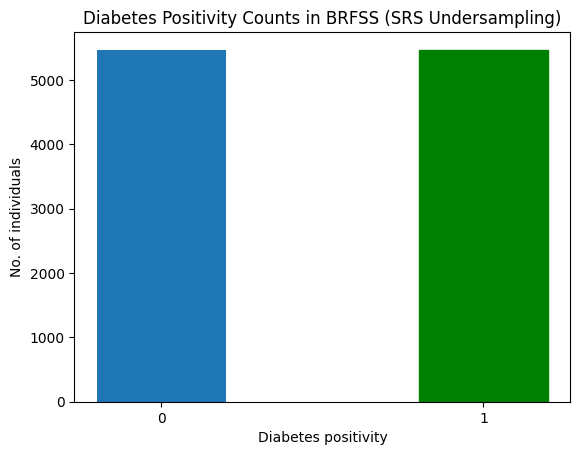

In [42]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Undersampling)")
plt.show()

In [43]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRS_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRS)


958
2777
497     0
2803    0
1564    0
3777    0
577     0
       ..
1871    1
1701    1
2897    1
2599    1
2607    1
Name: Y, Length: 1916, dtype: int64


In [44]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (8755, 22)
y_S_train: (8755,)
X_S_test: (2189, 22)
y_S_test: (2189,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - AUC: 0.7223 - loss: 0.6029 - val_AUC: 0.8893 - val_loss: 0.3954
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.8960 - loss: 0.3614 - val_AUC: 0.9130 - val_loss: 0.3246
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9108 - loss: 0.3341 - val_AUC: 0.9150 - val_loss: 0.3170
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9121 - loss: 0.3318 - val_AUC: 0.9206 - val_loss: 0.3128
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9147 - loss: 0.3276 - val_AUC: 0.9158 - val_loss: 0.3151
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9096 - loss: 0.3352 - val_AUC: 0.9253 - val_loss: 0.3306
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9149 - loss: 0.3286 - val_AUC: 0.9204 - val_loss: 0.3124
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9172 - loss: 0.3245 - val_AUC: 0.9218 - val_loss: 0.3074
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step -

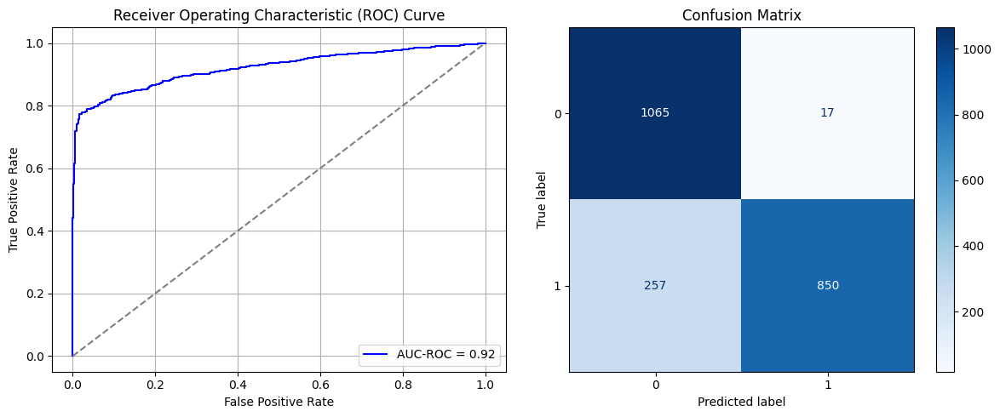

Best threshold based on F1-score: 0.3043026328086853
Time elapsed (performance): 16.645139665999977


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7220 - loss: 0.6883 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7168 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7540 - loss: 0.5473 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7301 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7184 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7523 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.9274
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7191 - loss: 0.7031 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7376 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7393 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7147 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7512 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7412 - loss: 0.5579 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7269 - loss: 0.6828 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7328 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7453 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7403 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7207 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7259 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9819
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7380 - loss: 0.6535 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7255 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9576
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7300 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7378 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7331 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7084 - loss: 0.7002 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7180 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9478
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7519 - loss: 0.5576 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.7265 - loss: 0.6892 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.6075 - val_AUC: 0.0000e+00 - val_loss: 0.9470
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7281 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9570
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.9240
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7209 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7119 - loss: 0.6710 - val_AUC: 0.0000e+00 - val_loss: 0.9417
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7501 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6963 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.9749
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8254
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8156
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7349 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7109 - loss: 0.7021 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7400 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7413 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8929
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7388 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7453 - loss: 0.5561 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9443
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7098 - loss: 0.6987 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7200 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7286 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7417 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7367 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7465 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7325 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7125 - loss: 0.7065 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7313 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8497
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7426 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7456 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5679 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7489 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7471 - loss: 0.5596 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - AUC: 0.7070 - loss: 0.6781 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7417 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7388 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7437 - loss: 0.5668 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7411 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7374 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7561 - loss: 0.5550 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7170 - loss: 0.6807 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7392 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7280 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7352 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7324 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7275 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9468
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7287 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7206 - loss: 0.6771 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8783
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7492 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7432 - loss: 0.5629 - val_AUC: 0.0000e+00 - val_loss: 0.8257
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7404 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7001 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7409 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7262 - loss: 0.6720 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7180 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7270 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7485 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9449
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7547 - loss: 0.5507 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7147 - loss: 0.6913 - val_AUC: 0.0000e+00 - val_loss: 0.9519
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.6067 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7300 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7380 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9773
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6840 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.9631
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7503 - loss: 0.5608 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7434 - loss: 0.6607 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9560
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7481 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.9793
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7115 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7490 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.8302
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7377 - loss: 0.6610 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7393 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7493 - loss: 0.5584 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7348 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7107 - loss: 0.6996 - val_AUC: 0.0000e+00 - val_loss: 0.8535
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7319 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7115 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7424 - loss: 0.5632 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8579
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7177 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7509 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8557
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7226 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8226
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7329 - loss: 0.6760 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7363 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7113 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7290 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7391 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7294 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7224 - loss: 0.6997 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7170 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8338
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7437 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9461
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7364 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7333 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7158 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8835
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7443 - loss: 0.5591 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7377 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 14ms/step - AUC: 0.7158 - loss: 0.5994 - val_AUC: 0.8964 - val_loss: 0.3727
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.8889 - loss: 0.3925 - val_AUC: 0.9113 - val_loss: 0.3561
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9080 - loss: 0.3402 - val_AUC: 0.9167 - val_loss: 0.3130
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9138 - loss: 0.3276 - val_AUC: 0.9190 - val_loss: 0.3121
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9104 - loss: 0.3381 - val_AUC: 0.9183 - val_loss: 0.3124
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9190 - loss: 0.3171 - val_AUC: 0.9166 - val_loss: 0.3209
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9148 - loss: 0.3248 - val_AUC: 0.9178 - val_loss: 0.3113
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9218 - loss: 0.3140 - val_AUC: 0.9218 - val_loss: 0.3074
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step -

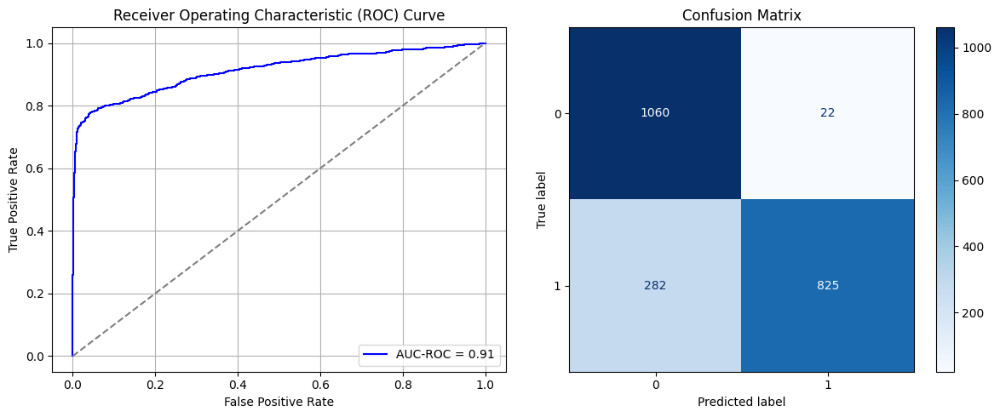

Best threshold based on F1-score: 0.3596833348274231
Time elapsed (performance): 19.277039519000027


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6778 - loss: 0.7846 - val_AUC: 0.0000e+00 - val_loss: 0.9691
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7036 - loss: 0.6587 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7324 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7193 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7336 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7206 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7313 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7162 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.7290 - loss: 0.7378 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.9802
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7317 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7282 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7374 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.9584
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9628
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7378 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.6999 - loss: 0.7470 - val_AUC: 0.0000e+00 - val_loss: 0.9652
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7099 - loss: 0.6501 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7115 - loss: 0.6155 - val_AUC: 0.0000e+00 - val_loss: 0.9061
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9693
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7037 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7707 - loss: 0.5467 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - AUC: 0.7243 - loss: 0.7414 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6962 - loss: 0.6643 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7405 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7128 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7598 - loss: 0.5487 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7506 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7226 - loss: 0.7253 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7398 - loss: 0.6453 - val_AUC: 0.0000e+00 - val_loss: 0.9526
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7352 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9507
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7435 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7389 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7483 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.9602
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7267 - loss: 0.7161 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7106 - loss: 0.6420 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7396 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9482
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7408 - loss: 0.5575 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7509 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7446 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7507 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6817 - loss: 0.7948 - val_AUC: 0.0000e+00 - val_loss: 0.9478
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 - loss: 0.6373 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7245 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.9914
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7266 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7410 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.9412
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7579 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7130 - loss: 0.7697 - val_AUC: 0.0000e+00 - val_loss: 0.9669
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7145 - loss: 0.6364 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7428 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7271 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7350 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7505 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.9214
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7128 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7170 - loss: 0.7263 - val_AUC: 0.0000e+00 - val_loss: 0.9820
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7046 - loss: 0.6444 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7246 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9672
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7322 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9533
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7273 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7324 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9728
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7424 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7755 - loss: 0.5502 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7440 - loss: 0.6908 - val_AUC: 0.0000e+00 - val_loss: 0.9454
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7306 - loss: 0.6442 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6904 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7143 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7265 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9613
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7445 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7261 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7492 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7188 - loss: 0.7462 - val_AUC: 0.0000e+00 - val_loss: 0.9891
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7299 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.9589
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7406 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9758
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7481 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7140 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7407 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7228 - loss: 0.7836 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.6584 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7045 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7513 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7323 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7324 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - AUC: 0.6846 - loss: 0.8225 - val_AUC: 0.0000e+00 - val_loss: 0.9722
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7060 - loss: 0.6726 - val_AUC: 0.0000e+00 - val_loss: 0.9607
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7359 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7080 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7491 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.9561
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7237 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7095 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.9671
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6893 - loss: 0.7776 - val_AUC: 0.0000e+00 - val_loss: 0.9548
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7153 - loss: 0.6379 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7334 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7582 - loss: 0.5574 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7303 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7321 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7000 - loss: 0.7937 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.9871
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7086 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7263 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7340 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7402 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7062 - loss: 0.7823 - val_AUC: 0.0000e+00 - val_loss: 0.9581
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6998 - loss: 0.6578 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7252 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7286 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7605 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7350 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7462 - loss: 0.5617 - val_AUC: 0.0000e+00 - val_loss: 0.8382
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7290 - loss: 0.7155 - val_AUC: 0.0000e+00 - val_loss: 0.9929
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.6552 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7365 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7349 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.9272
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7307 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7312 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7242 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.6858 - loss: 0.7908 - val_AUC: 0.0000e+00 - val_loss: 1.0495
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6997 - loss: 0.6668 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7215 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7294 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7256 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7530 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8219
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7402 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7177 - loss: 0.7324 - val_AUC: 0.0000e+00 - val_loss: 0.9487
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7003 - loss: 0.6651 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7197 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9690
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7419 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7249 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7196 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7587 - loss: 0.5604 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - AUC: 0.7290 - loss: 0.7197 - val_AUC: 0.0000e+00 - val_loss: 0.9269
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.6426 - val_AUC: 0.0000e+00 - val_loss: 0.9275
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7265 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.9502
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7481 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7352 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9398
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7546 - loss: 0.5548 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7340 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - AUC: 0.7218 - loss: 0.6275 - val_AUC: 0.8979 - val_loss: 0.3656
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8938 - loss: 0.3754 - val_AUC: 0.9121 - val_loss: 0.3420
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9080 - loss: 0.3341 - val_AUC: 0.9158 - val_loss: 0.3366
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9179 - loss: 0.3213 - val_AUC: 0.9211 - val_loss: 0.3173
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9167 - loss: 0.3262 - val_AUC: 0.9226 - val_loss: 0.3129
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9184 - loss: 0.3237 - val_AUC: 0.9224 - val_loss: 0.3049
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9172 - loss: 0.3240 - val_AUC: 0.9229 - val_loss: 0.3051
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9232 - loss: 0.3153 - val_AUC: 0.9272 - val_loss: 0.3012
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

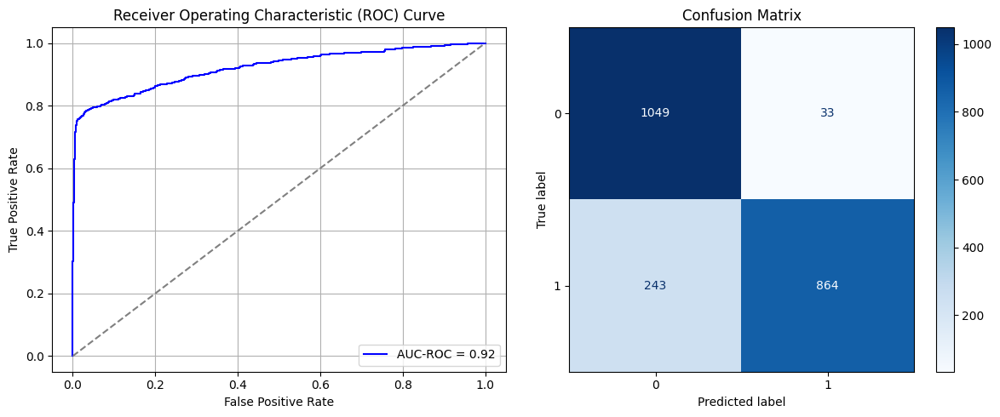

Best threshold based on F1-score: 0.4901858866214752
Time elapsed (performance): 18.491797689000123


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7176 - loss: 0.7157 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7431 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7316 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.7929
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6871 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7217 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8063
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7382 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7266 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7007 - loss: 0.7117 - val_AUC: 0.0000e+00 - val_loss: 0.9971
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7197 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7086 - loss: 0.6037 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7058 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7501 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.9473
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7516 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7400 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7140 - loss: 0.6892 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.6318 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7311 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7362 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7284 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.9604
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7361 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.7196 - loss: 0.6826 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7168 - loss: 0.6156 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7086 - loss: 0.6046 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7529 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9420
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9340
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7154 - loss: 0.7050 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7038 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7341 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7295 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8330
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7285 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7312 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7381 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7449 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - AUC: 0.7286 - loss: 0.6617 - val_AUC: 0.0000e+00 - val_loss: 0.9702
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7403 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.9175
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7140 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7363 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9042
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7449 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7471 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7258 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7192 - loss: 0.6846 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7117 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7429 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.7907
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7263 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7240 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7298 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9990
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9949
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7091 - loss: 0.7004 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7169 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7365 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7215 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8634
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7288 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7427 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8661
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7122 - loss: 0.6967 - val_AUC: 0.0000e+00 - val_loss: 0.9488
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7257 - loss: 0.6151 - val_AUC: 0.0000e+00 - val_loss: 0.9621
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6991 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.9701
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7331 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7135 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.7276 - loss: 0.6755 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.7179 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.9877
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6990 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7246 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8247
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7067 - loss: 0.7160 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.6125 - val_AUC: 0.0000e+00 - val_loss: 0.8222
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7237 - loss: 0.6137 - val_AUC: 0.0000e+00 - val_loss: 0.9832
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7076 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9629
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7063 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 0.9725
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7486 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7124 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7258 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7163 - loss: 0.6926 - val_AUC: 0.0000e+00 - val_loss: 0.8009
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7222 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 1.0908
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7121 - loss: 0.6193 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7206 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9772
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7283 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7248 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.7958
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - AUC: 0.7151 - loss: 0.6970 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7152 - loss: 0.6354 - val_AUC: 0.0000e+00 - val_loss: 0.9827
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7324 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7248 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7088 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7304 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7229 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7267 - loss: 0.6849 - val_AUC: 0.0000e+00 - val_loss: 0.9448
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7153 - loss: 0.6282 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7221 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.9611
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7245 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7386 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7593 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7150 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - AUC: 0.7077 - loss: 0.7064 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7182 - loss: 0.6272 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7357 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6978 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7245 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7290 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7420 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7169 - loss: 0.6839 - val_AUC: 0.0000e+00 - val_loss: 0.8054
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.6563 - val_AUC: 0.0000e+00 - val_loss: 0.9482
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6935 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.8230
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6939 - loss: 0.6068 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7439 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.8124
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9551
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7387 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7176 - loss: 0.7243 - val_AUC: 0.0000e+00 - val_loss: 0.9512
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.6328 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7040 - loss: 0.6142 - val_AUC: 0.0000e+00 - val_loss: 1.0333
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7014 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7332 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9698
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7459 - loss: 0.5532 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7186 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7182 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7000 - loss: 0.7410 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7234 - loss: 0.6334 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7135 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7285 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9546
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7538 - loss: 0.5621 - val_AUC: 0.0000e+00 - val_loss: 0.8929
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7383 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.9399
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7533 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8542
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7289 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7230 - loss: 0.6754 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 - loss: 0.6367 - val_AUC: 0.0000e+00 - val_loss: 0.9141
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6920 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7285 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7556 - loss: 0.5606 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - AUC: 0.7252 - loss: 0.6743 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7152 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7038 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8536
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7206 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7343 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9674
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7450 - loss: 0.5534 - val_AUC: 0.0000e+00 - val_loss: 0.8011
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - AUC: 0.7449 - loss: 0.6069 - val_AUC: 0.8837 - val_loss: 0.3855
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8845 - loss: 0.3867 - val_AUC: 0.9102 - val_loss: 0.3237
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9041 - loss: 0.3387 - val_AUC: 0.9211 - val_loss: 0.3197
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9115 - loss: 0.3306 - val_AUC: 0.9227 - val_loss: 0.3055
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9175 - loss: 0.3248 - val_AUC: 0.9208 - val_loss: 0.3067
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9209 - loss: 0.3165 - val_AUC: 0.9244 - val_loss: 0.3035
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9216 - loss: 0.3106 - val_AUC: 0.9186 - val_loss: 0.3124
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9168 - loss: 0.3254 - val_AUC: 0.9277 - val_loss: 0.2966
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

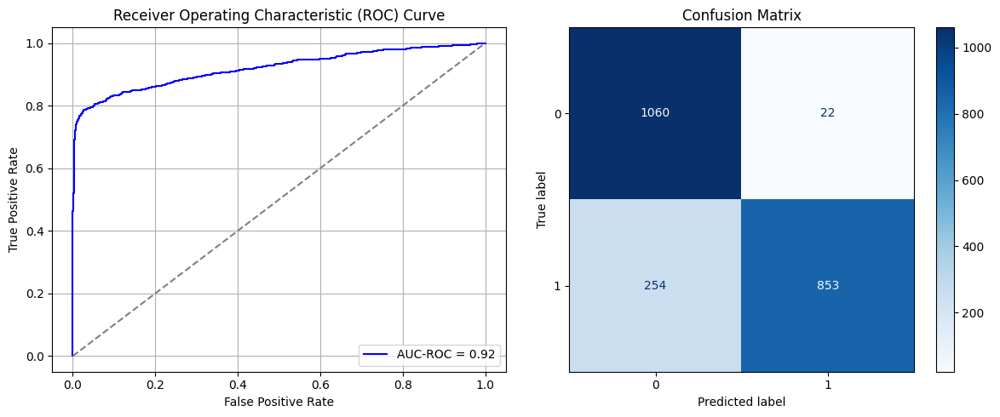

Best threshold based on F1-score: 0.2711370885372162
Time elapsed (performance): 16.977999998000087


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.7634 - loss: 0.6136 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6969 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7386 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7413 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7412 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7353 - loss: 0.6568 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7480 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7350 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7318 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7377 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7252 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7205 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7298 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7086 - loss: 0.7243 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7241 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7504 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7105 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7173 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - AUC: 0.7265 - loss: 0.6972 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7298 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7316 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7093 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7476 - loss: 0.5672 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7253 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8623
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7046 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.7358 - loss: 0.6882 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7318 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9407
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7469 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7322 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7308 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7466 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7417 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7434 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.6902 - loss: 0.7707 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7411 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7403 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7325 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7451 - loss: 0.5583 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7322 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7474 - loss: 0.6649 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7360 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7078 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7244 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6972 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7306 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7226 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7141 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7287 - loss: 0.6736 - val_AUC: 0.0000e+00 - val_loss: 0.9239
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7440 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7498 - loss: 0.5515 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7351 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7256 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7392 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7331 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7333 - loss: 0.6855 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7284 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7470 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7251 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8664
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7286 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7466 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7399 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7418 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7186 - loss: 0.7101 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7409 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7308 - loss: 0.5633 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7149 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7593 - loss: 0.5526 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7412 - loss: 0.5586 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7414 - loss: 0.5640 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6987 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7324 - loss: 0.6843 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7449 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7212 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7263 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7274 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7128 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7066 - loss: 0.7245 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7165 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7557 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7211 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7459 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7341 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7077 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7389 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7181 - loss: 0.7079 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7242 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6945 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8116
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7390 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7049 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7483 - loss: 0.5647 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7279 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7363 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7275 - loss: 0.6757 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7330 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7369 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7492 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7126 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7247 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7217 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7415 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7405 - loss: 0.6500 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7242 - loss: 0.6104 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7438 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7363 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8283
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7062 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7161 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7137 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - AUC: 0.7421 - loss: 0.6788 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7169 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7521 - loss: 0.5521 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7442 - loss: 0.5610 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7323 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7251 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7205 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7298 - loss: 0.6694 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7543 - loss: 0.5541 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7512 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7336 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7366 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8488
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7144 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7409 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.6977 - loss: 0.7084 - val_AUC: 0.0000e+00 - val_loss: 0.9420
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6990 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7145 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7305 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7159 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7182 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8496
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.6966 - loss: 0.7450 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7082 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7176 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7370 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7235 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7261 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7018 - loss: 0.5985 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7359 - loss: 0.6616 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7170 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6998 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7040 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7420 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7231 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7206 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7044 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.9633
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - AUC: 0.7151 - loss: 0.6146 - val_AUC: 0.8976 - val_loss: 0.3528
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8893 - loss: 0.3793 - val_AUC: 0.9090 - val_loss: 0.3299
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9023 - loss: 0.3452 - val_AUC: 0.9197 - val_loss: 0.3168
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9110 - loss: 0.3360 - val_AUC: 0.9203 - val_loss: 0.3137
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9083 - loss: 0.3424 - val_AUC: 0.9174 - val_loss: 0.3145
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9183 - loss: 0.3272 - val_AUC: 0.9200 - val_loss: 0.3124
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9188 - loss: 0.3208 - val_AUC: 0.9261 - val_loss: 0.3059
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9244 - loss: 0.3097 - val_AUC: 0.9247 - val_loss: 0.3041
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step -

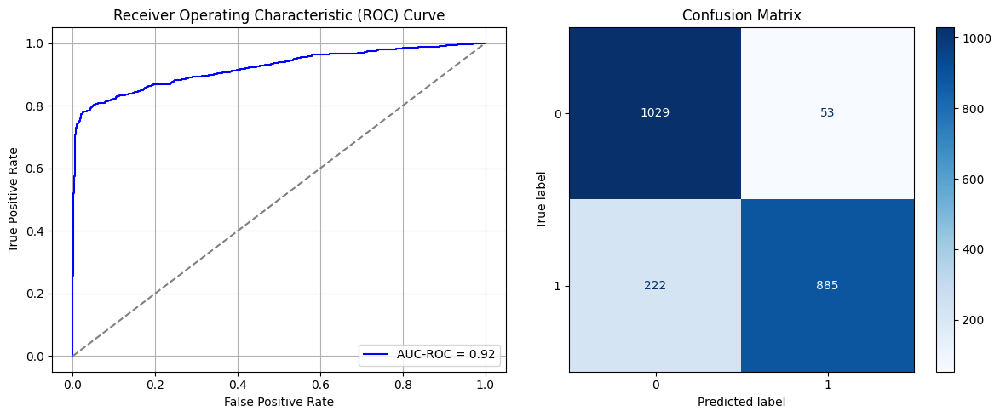

Best threshold based on F1-score: 0.4942283034324646
Time elapsed (performance): 17.130556656000408


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7073 - loss: 0.7609 - val_AUC: 0.0000e+00 - val_loss: 1.0196
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7128 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7271 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7132 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7373 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7317 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - AUC: 0.7234 - loss: 0.7058 - val_AUC: 0.0000e+00 - val_loss: 1.0074
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6972 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7404 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7219 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7185 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7185 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7339 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6846 - loss: 0.7371 - val_AUC: 0.0000e+00 - val_loss: 1.0392
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7061 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7122 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8607
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7387 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7151 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7185 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7264 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7231 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9595
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6901 - loss: 0.7801 - val_AUC: 0.0000e+00 - val_loss: 1.0180
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7177 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7260 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9263
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7462 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7329 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7429 - loss: 0.5669 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1470 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1471 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1476 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7268 - loss: 0.6974 - val_AUC: 0.0000e+00 - val_loss: 0.9924
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7247 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7100 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9396
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7065 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7355 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6984 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7321 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1477 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1478 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1483 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7078 - loss: 0.7199 - val_AUC: 0.0000e+00 - val_loss: 1.0061
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7297 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7408 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7043 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7485 - loss: 0.5552 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7377 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7233 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7408 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1485 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1490 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.7127 - loss: 0.7580 - val_AUC: 0.0000e+00 - val_loss: 1.0005
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7111 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7055 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7187 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7425 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7504 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.9223
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7170 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1491 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1492 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1493 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1497 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7149 - loss: 0.7573 - val_AUC: 0.0000e+00 - val_loss: 0.9600
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7252 - loss: 0.6203 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7389 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7183 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7284 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7047 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7472 - loss: 0.5587 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1498 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1499 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1500 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1504 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.7140 - loss: 0.7087 - val_AUC: 0.0000e+00 - val_loss: 1.0475
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7232 - loss: 0.6245 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7114 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7118 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7254 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7065 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7308 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1505 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1506 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1507 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1511 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7160 - loss: 0.7112 - val_AUC: 0.0000e+00 - val_loss: 1.0267
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7404 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7061 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7380 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7016 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7057 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7263 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.9184
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1512 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1513 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1514 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1518 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7068 - loss: 0.7580 - val_AUC: 0.0000e+00 - val_loss: 1.0194
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7392 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7180 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7407 - loss: 0.5614 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7169 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7113 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.9521
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7283 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7047 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1519 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1520 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1521 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1525 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7406 - loss: 0.7010 - val_AUC: 0.0000e+00 - val_loss: 0.9970
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - AUC: 0.7345 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7257 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7443 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7260 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7177 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7071 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7124 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1526 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1527 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1528 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1532 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.6979 - loss: 0.7417 - val_AUC: 0.0000e+00 - val_loss: 1.0143
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7355 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7125 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7224 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7340 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7185 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7119 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7283 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1533 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1534 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1535 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1539 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.6870 - loss: 0.7783 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7109 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7167 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7311 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9244
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7370 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7180 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6882 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1540 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1541 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1542 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1546 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7430 - loss: 0.6653 - val_AUC: 0.0000e+00 - val_loss: 1.0673
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7253 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7324 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.9613
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7181 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7216 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7410 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7264 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7183 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1547 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1548 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1553 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6975 - loss: 0.7646 - val_AUC: 0.0000e+00 - val_loss: 0.9875
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7116 - loss: 0.6235 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7201 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7280 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8169
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7339 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7410 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7263 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1555 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1560 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.7092 - loss: 0.7230 - val_AUC: 0.0000e+00 - val_loss: 0.9859
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7059 - loss: 0.6210 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7319 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7252 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7478 - loss: 0.5522 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7393 - loss: 0.5620 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7000 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1561 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1562 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1567 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7109 - loss: 0.7317 - val_AUC: 0.0000e+00 - val_loss: 0.9765
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7229 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7243 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7182 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7198 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7165 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7336 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7320 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1568 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1569 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1574 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7031 - loss: 0.7645 - val_AUC: 0.0000e+00 - val_loss: 0.9943
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7191 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9223
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7383 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7163 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7236 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6725 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7365 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1575 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1576 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1581 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - AUC: 0.7128 - loss: 0.7023 - val_AUC: 0.0000e+00 - val_loss: 0.9817
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7175 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7380 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7331 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8912
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7415 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7343 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7354 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

In [48]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']


# fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)

In [49]:
print(ParamFit)
ParamFit.to_csv('SRS_Fine_Tuning.csv')

         FPR       FNR
0   0.125884  0.581498
1   0.124470  0.585903
2   0.125884  0.585903
3   0.125884  0.581498
4   0.127298  0.581498
..       ...       ...
95  0.147100  0.555066
96  0.125884  0.594714
97  0.130127  0.568282
98  0.117397  0.603524
99  0.142857  0.568282

[100 rows x 2 columns]


In [50]:
ParamFit['FNR'].mean()

np.float64(0.5762995594713657)

## Simple Random Sampling with Replacement:

In [31]:
data_S_full

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,Y2
0,0.010101,1.0,0.333333,0.333333,0.051724,0.4,0.1,0.1,0.0,0.0,...,0.160138,0.080648,0.260979,0.000000,0.000561,0.000000,0.000000,0.000000,0.000000,1
1,0.111111,1.0,0.333333,0.666667,0.086207,0.4,0.2,0.2,0.2,0.4,...,0.163220,0.084074,0.263485,0.000000,0.000815,0.001116,0.001610,0.000000,0.003783,0
2,0.080808,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,...,0.173637,0.095470,0.272928,0.001738,0.001222,0.001116,0.001610,0.002345,0.009458,0
3,0.040404,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,...,0.186809,0.109363,0.283685,0.002290,0.001645,0.001339,0.001771,0.002506,0.001892,0
4,0.040404,0.0,0.333333,0.333333,0.620690,0.2,0.1,0.2,0.2,0.2,...,0.179863,0.099633,0.275681,0.002290,0.029893,0.011160,0.014493,0.001615,0.001284,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22266,0.202020,0.0,0.333333,0.333333,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.162493,0.083127,0.262900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1
22267,0.090909,0.0,0.000000,0.666667,0.293103,0.1,0.1,0.2,0.2,0.2,...,0.226667,0.149535,0.303248,0.002290,0.091097,0.004464,0.004831,0.004689,0.003783,0
22268,0.070707,0.0,0.333333,0.666667,0.224138,0.4,0.4,0.4,0.4,0.4,...,0.233160,0.162558,0.323347,0.008013,0.002852,0.000000,0.011272,0.000000,0.007566,1
22269,0.020202,0.0,0.333333,0.666667,0.275862,0.5,0.4,0.1,0.2,0.2,...,0.179805,0.101057,0.275854,0.000000,0.000000,0.024552,0.006763,0.004689,0.005864,1


In [32]:
data_T_full

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,Y
0,0.131313,1.0,0.666667,0.333333,0.120690,0.2,0.4,0.2,0.2,0.2,...,0.171640,0.092342,0.263837,0.003811,0.000000,0.000482,0.001610,0.002345,0.001892,0
1,0.191919,1.0,0.666667,0.666667,0.224138,0.2,0.4,0.2,0.2,0.1,...,0.162505,0.082461,0.263846,0.002640,0.000010,0.000056,0.000483,0.008764,0.000125,0
2,0.040404,1.0,0.666667,1.000000,0.034483,0.4,0.2,0.2,0.2,0.2,...,0.187240,0.109930,0.284195,0.000000,0.001222,0.001228,0.001932,0.003048,0.002081,0
3,0.121212,1.0,0.666667,0.666667,0.310345,0.2,0.2,0.2,0.2,0.1,...,0.179558,0.092351,0.261693,0.003434,0.001253,0.001116,0.003221,0.002180,0.063866,0
4,0.040404,0.0,0.666667,0.666667,0.034483,0.2,0.2,0.2,0.2,0.2,...,0.187424,0.110226,0.284069,0.002259,0.001162,0.001117,0.002306,0.002490,0.001886,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4664,0.040404,0.0,0.666667,0.666667,0.362069,0.2,0.2,0.2,0.2,0.2,...,0.207576,0.100451,0.276113,0.011448,0.003260,0.005580,0.004831,0.010550,0.003783,0
4665,0.000000,0.0,0.666667,0.333333,0.379310,0.2,0.2,0.0,0.0,0.0,...,0.160138,0.080648,0.260979,0.002290,0.000000,0.000000,0.000000,0.000000,0.000000,0
4666,0.212121,0.0,0.666667,0.333333,0.310345,0.2,0.2,0.2,0.2,0.2,...,0.243036,0.111622,0.273259,0.009730,0.016299,0.005583,0.004907,0.011723,0.001892,0
4667,0.141414,0.0,0.666667,0.666667,0.379310,0.1,0.1,0.1,0.2,0.2,...,0.168596,0.085794,0.260979,0.002103,0.002873,0.010042,0.000208,0.000000,0.000000,0


In [33]:
X_S_SRSwR, y_S_SRSwR = SRSwR_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(X_S_SRSwR)

5472
16799
             0    1         2         3         4    5    6    7    8    9   \
20873  0.070707  1.0  0.333333  0.333333  0.103448  0.1  0.1  0.1  0.1  0.1   
20394  0.191919  0.0  0.000000  0.666667  0.189655  0.2  0.2  0.2  0.2  0.2   
10362  0.090909  0.0  0.333333  0.333333  0.120690  0.1  0.0  0.0  0.0  0.0   
17878  0.141414  1.0  0.333333  0.333333  0.517241  0.2  0.2  0.2  0.2  0.2   
134    0.494949  1.0  0.000000  0.333333  0.448276  0.2  0.2  0.2  0.2  0.2   
...         ...  ...       ...       ...       ...  ...  ...  ...  ...  ...   
22255  0.030303  0.0  0.333333  0.666667  0.448276  0.4  0.5  0.4  0.4  0.4   
22258  0.040404  0.0  0.333333  0.333333  0.396552  0.4  0.4  0.4  0.2  0.2   
22266  0.202020  0.0  0.333333  0.333333  0.224138  0.4  0.4  0.4  0.4  0.4   
22268  0.070707  0.0  0.333333  0.666667  0.224138  0.4  0.4  0.4  0.4  0.4   
22269  0.020202  0.0  0.333333  0.666667  0.275862  0.5  0.4  0.1  0.2  0.2   

       ...        12        13        14

In [34]:
X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRSwR, y_S_SRSwR, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRSwR, y_T_train_SRSwR = SRSwR_undersampler(T_train, T_train.iloc[:,-1])
print(y_T_train_SRSwR)

958
2777
4311    0
3620    0
863     0
2517    0
4155    0
       ..
1871    1
1701    1
2897    1
2599    1
2607    1
Name: Y, Length: 1916, dtype: int64


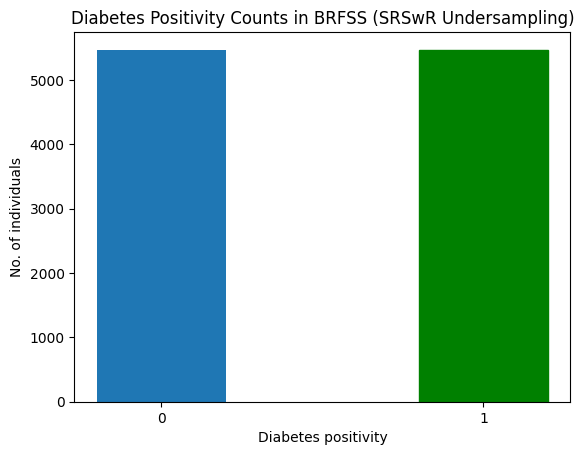

In [35]:
barlist = plt.bar([str(0),str(1)], y_S_SRSwR.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRSwR Undersampling)")
plt.show()

In [36]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (8755, 22)
y_S_train: (8755,)
X_S_test: (2189, 22)
y_S_test: (2189,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 12s 14ms/step - AUC: 0.6684 - loss: 0.6300 - val_AUC: 0.8970 - val_loss: 0.3922
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8928 - loss: 0.3836 - val_AUC: 0.9147 - val_loss: 0.3353
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9056 - loss: 0.3494 - val_AUC: 0.9197 - val_loss: 0.3063
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9112 - loss: 0.3361 - val_AUC: 0.9162 - val_loss: 0.3255
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9093 - loss: 0.3306 - val_AUC: 0.9150 - val_loss: 0.3301
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9152 - loss: 0.3257 - val_AUC: 0.9172 - val_loss: 0.3300
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9188 - loss: 0.3145 - val_AUC: 0.9225 - val_loss: 0.3080
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9240 - loss: 0.3154 - val_AUC: 0.9218 - val_loss: 0.3076
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step 

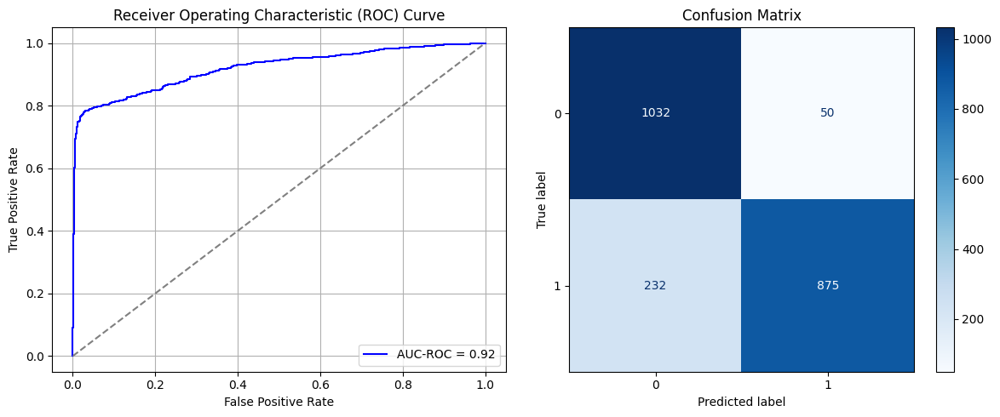

Best threshold based on F1-score: 0.5398790240287781
Time elapsed (performance): 21.479792937000184


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6836 - loss: 0.8550 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7072 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6801 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7270 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7014 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7071 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7231 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7062 - loss: 0.7810 - val_AUC: 0.0000e+00 - val_loss: 0.9759
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7034 - loss: 0.6369 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7142 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7106 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8721
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7192 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9656
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7272 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8347
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6906 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6888 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7204 - loss: 0.7713 - val_AUC: 0.0000e+00 - val_loss: 0.9720
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6960 - loss: 0.6428 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7251 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7032 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7182 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7276 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7284 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6934 - loss: 0.8550 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6938 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7262 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7274 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7014 - loss: 0.7894 - val_AUC: 0.0000e+00 - val_loss: 1.0207
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7121 - loss: 0.6320 - val_AUC: 0.0000e+00 - val_loss: 0.9335
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6967 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7323 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7334 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9759
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7305 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6895 - loss: 0.8897 - val_AUC: 0.0000e+00 - val_loss: 0.9481
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6834 - loss: 0.6504 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7079 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7062 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8393
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7035 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7453 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.9532
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - AUC: 0.7255 - loss: 0.7559 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7050 - loss: 0.6455 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6853 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.8738
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7278 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7485 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7279 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7438 - loss: 0.5553 - val_AUC: 0.0000e+00 - val_loss: 0.9266
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7161 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8654
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.7166 - loss: 0.7769 - val_AUC: 0.0000e+00 - val_loss: 0.9513
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7056 - loss: 0.6374 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7069 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7152 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9742
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7324 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7304 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7231 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9493
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7143 - loss: 0.7883 - val_AUC: 0.0000e+00 - val_loss: 0.9787
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6962 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7048 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7183 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7187 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7395 - loss: 0.5659 - val_AUC: 0.0000e+00 - val_loss: 0.9636
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7260 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6911 - loss: 0.8366 - val_AUC: 0.0000e+00 - val_loss: 0.9435
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6908 - loss: 0.6330 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7089 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7124 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7106 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7333 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7416 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7364 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7114 - loss: 0.7896 - val_AUC: 0.0000e+00 - val_loss: 0.9551
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6993 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7191 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7373 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7268 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.9573
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7425 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7144 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7439 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9214
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.6890 - loss: 0.8263 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6893 - loss: 0.6544 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7141 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7407 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7125 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7379 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7120 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7013 - loss: 0.8120 - val_AUC: 0.0000e+00 - val_loss: 0.9734
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6949 - loss: 0.6443 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7220 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7260 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7165 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6994 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9543
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7172 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7019 - loss: 0.8116 - val_AUC: 0.0000e+00 - val_loss: 0.9466
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7079 - loss: 0.6311 - val_AUC: 0.0000e+00 - val_loss: 0.9663
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7195 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7405 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7187 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7114 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9374
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7161 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6920 - loss: 0.8641 - val_AUC: 0.0000e+00 - val_loss: 0.9389
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7059 - loss: 0.6316 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7156 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6892 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7164 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7195 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.9507
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7034 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.9384
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7185 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6999 - loss: 0.7689 - val_AUC: 0.0000e+00 - val_loss: 0.9951
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7205 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7019 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9074
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6971 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.9335
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7192 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6807 - loss: 0.8419 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7003 - loss: 0.6329 - val_AUC: 0.0000e+00 - val_loss: 0.9261
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7175 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9428
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7119 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7255 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7263 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9298
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7308 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.7124 - loss: 0.7467 - val_AUC: 0.0000e+00 - val_loss: 0.9813
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7254 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7387 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7336 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7146 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7103 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6936 - loss: 0.8183 - val_AUC: 0.0000e+00 - val_loss: 0.9328
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6983 - loss: 0.6376 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7043 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7305 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7045 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7216 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6959 - loss: 0.8001 - val_AUC: 0.0000e+00 - val_loss: 0.9402
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6892 - loss: 0.6681 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7111 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6877 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7260 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7439 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.9338
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - AUC: 0.6745 - loss: 0.6264 - val_AUC: 0.8925 - val_loss: 0.3848
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8835 - loss: 0.3921 - val_AUC: 0.9006 - val_loss: 0.3713
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9083 - loss: 0.3423 - val_AUC: 0.9116 - val_loss: 0.3168
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9120 - loss: 0.3330 - val_AUC: 0.9158 - val_loss: 0.3077
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9158 - loss: 0.3240 - val_AUC: 0.9204 - val_loss: 0.3088
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9179 - loss: 0.3242 - val_AUC: 0.9110 - val_loss: 0.3156
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9225 - loss: 0.3096 - val_AUC: 0.9212 - val_loss: 0.3053
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9225 - loss: 0.3163 - val_AUC: 0.9181 - val_loss: 0.3099
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

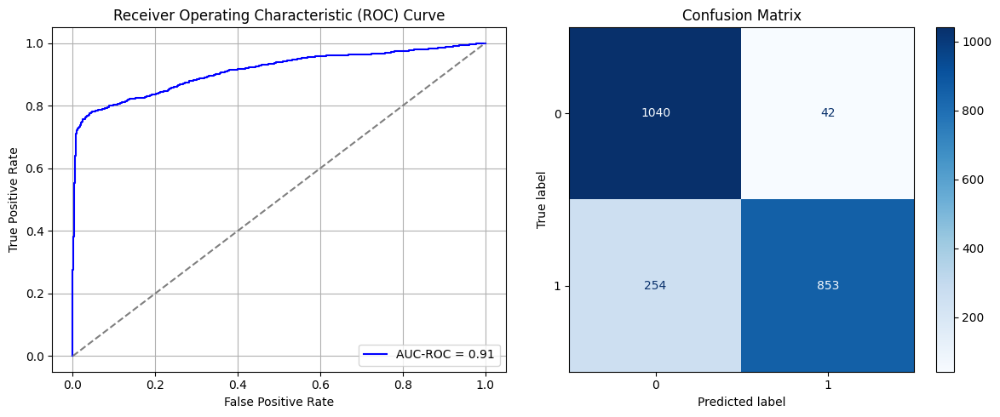

Best threshold based on F1-score: 0.4546288549900055
Time elapsed (performance): 17.934224507999716


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - AUC: 0.7135 - loss: 0.7425 - val_AUC: 0.0000e+00 - val_loss: 0.9524
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7138 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7345 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7447 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7251 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8652
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7476 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7400 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6929 - loss: 0.7531 - val_AUC: 0.0000e+00 - val_loss: 0.9742
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7111 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7094 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7162 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7401 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9418
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7467 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9395
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7151 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8573
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7145 - loss: 0.7680 - val_AUC: 0.0000e+00 - val_loss: 0.9575
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6912 - loss: 0.6506 - val_AUC: 0.0000e+00 - val_loss: 0.9927
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7022 - loss: 0.6260 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7397 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9683
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7230 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7286 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7367 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6835 - loss: 0.7729 - val_AUC: 0.0000e+00 - val_loss: 1.0615
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7033 - loss: 0.6342 - val_AUC: 0.0000e+00 - val_loss: 1.0076
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7207 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8883
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7353 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7343 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9039
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7245 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7552 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.9849
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7320 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7093 - loss: 0.7979 - val_AUC: 0.0000e+00 - val_loss: 1.0197
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7182 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7048 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7315 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.9214
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7451 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7214 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6949 - loss: 0.7713 - val_AUC: 0.0000e+00 - val_loss: 1.0043
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7011 - loss: 0.6459 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7044 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7225 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7418 - loss: 0.5624 - val_AUC: 0.0000e+00 - val_loss: 0.8309
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7226 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7439 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7066 - loss: 0.7818 - val_AUC: 0.0000e+00 - val_loss: 0.9349
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7180 - loss: 0.6674 - val_AUC: 0.0000e+00 - val_loss: 0.9719
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7089 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7030 - loss: 0.6115 - val_AUC: 0.0000e+00 - val_loss: 0.9609
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7446 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9349
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7201 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7320 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7339 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 58ms/step - AUC: 0.6994 - loss: 0.7746 - val_AUC: 0.0000e+00 - val_loss: 1.0556
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7176 - loss: 0.6426 - val_AUC: 0.0000e+00 - val_loss: 1.0336
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7077 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9631
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7333 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7534 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7309 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8450
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7136 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7210 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6945 - loss: 0.7868 - val_AUC: 0.0000e+00 - val_loss: 1.0048
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.6414 - val_AUC: 0.0000e+00 - val_loss: 0.9889
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7318 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7367 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7549 - loss: 0.5512 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7206 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7334 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7037 - loss: 0.8088 - val_AUC: 0.0000e+00 - val_loss: 0.9545
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7280 - loss: 0.6404 - val_AUC: 0.0000e+00 - val_loss: 1.0280
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7117 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7157 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7175 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7132 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9726
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7503 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 40ms/step - AUC: 0.6875 - loss: 0.8089 - val_AUC: 0.0000e+00 - val_loss: 1.0214
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7045 - loss: 0.6643 - val_AUC: 0.0000e+00 - val_loss: 0.9625
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7197 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.9511
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7306 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7329 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7150 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7438 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7407 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7141 - loss: 0.7601 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7254 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7123 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7330 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7242 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6926 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8449
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7506 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7266 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.6985 - loss: 0.7729 - val_AUC: 0.0000e+00 - val_loss: 0.9849
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7001 - loss: 0.6368 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6988 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7298 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9779
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7219 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9354
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7399 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7345 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7199 - loss: 0.7264 - val_AUC: 0.0000e+00 - val_loss: 0.9815
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6973 - loss: 0.6505 - val_AUC: 0.0000e+00 - val_loss: 0.9689
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7022 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7399 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7264 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7443 - loss: 0.5631 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7249 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7474 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.6811 - loss: 0.8158 - val_AUC: 0.0000e+00 - val_loss: 0.9930
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7072 - loss: 0.6459 - val_AUC: 0.0000e+00 - val_loss: 0.9540
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9647
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7262 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7165 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9381
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7044 - loss: 0.8108 - val_AUC: 0.0000e+00 - val_loss: 0.9963
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7423 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9762
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7314 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7375 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.9099
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7430 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8582
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7192 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.9412
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6911 - loss: 0.7619 - val_AUC: 0.0000e+00 - val_loss: 0.9939
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7185 - loss: 0.6170 - val_AUC: 0.0000e+00 - val_loss: 0.9298
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7453 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7212 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7442 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9474
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 37ms/step - AUC: 0.7120 - loss: 0.7361 - val_AUC: 0.0000e+00 - val_loss: 0.9761
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7030 - loss: 0.6284 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7300 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7147 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7420 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7356 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7434 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9811
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7252 - loss: 0.7448 - val_AUC: 0.0000e+00 - val_loss: 0.9826
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7085 - loss: 0.6302 - val_AUC: 0.0000e+00 - val_loss: 1.0450
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7081 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7356 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9863
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6983 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7363 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9469
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7321 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6917 - loss: 0.8717 - val_AUC: 0.0000e+00 - val_loss: 0.9773
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7135 - loss: 0.6539 - val_AUC: 0.0000e+00 - val_loss: 0.9765
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7138 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7116 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9247
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7584 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.9940
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7350 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7556 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step - AUC: 0.7392 - loss: 0.5888 - val_AUC: 0.9080 - val_loss: 0.3394
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8964 - loss: 0.3594 - val_AUC: 0.9184 - val_loss: 0.3186
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9065 - loss: 0.3410 - val_AUC: 0.9165 - val_loss: 0.3099
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9150 - loss: 0.3257 - val_AUC: 0.9224 - val_loss: 0.3062
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9205 - loss: 0.3117 - val_AUC: 0.9207 - val_loss: 0.3019
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9179 - loss: 0.3177 - val_AUC: 0.9213 - val_loss: 0.3062
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9189 - loss: 0.3183 - val_AUC: 0.9216 - val_loss: 0.3077
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9203 - loss: 0.3094 - val_AUC: 0.9212 - val_loss: 0.3258
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

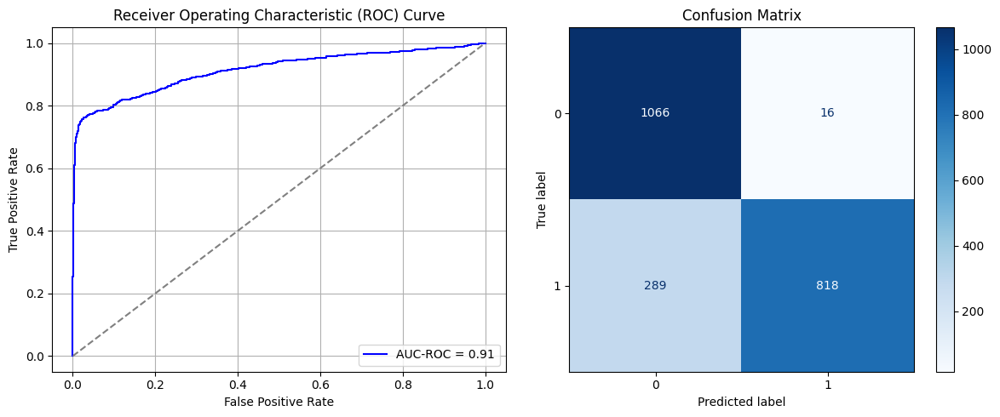

Best threshold based on F1-score: 0.33976027369499207
Time elapsed (performance): 18.57112903699999


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7204 - loss: 0.7763 - val_AUC: 0.0000e+00 - val_loss: 0.9527
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7234 - loss: 0.6375 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7210 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7520 - loss: 0.5630 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7280 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7289 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7234 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 41ms/step - AUC: 0.6943 - loss: 0.7856 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7030 - loss: 0.6376 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7240 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7109 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7180 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7140 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7413 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7354 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7037 - loss: 0.8293 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7020 - loss: 0.6573 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7158 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7246 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7248 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7190 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7111 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7107 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6907 - loss: 0.8530 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7038 - loss: 0.6845 - val_AUC: 0.0000e+00 - val_loss: 0.9411
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.9632
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7190 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7034 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7315 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7295 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7337 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - AUC: 0.7024 - loss: 0.8340 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7166 - loss: 0.6396 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7271 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7396 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7228 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7177 - loss: 0.7639 - val_AUC: 0.0000e+00 - val_loss: 0.9794
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7149 - loss: 0.6269 - val_AUC: 0.0000e+00 - val_loss: 0.9503
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7203 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7107 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7244 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7405 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7350 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9267
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - AUC: 0.7108 - loss: 0.7967 - val_AUC: 0.0000e+00 - val_loss: 0.9770
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7065 - loss: 0.6536 - val_AUC: 0.0000e+00 - val_loss: 0.9604
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7306 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7271 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.9658
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7352 - loss: 0.5595 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7322 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.7218 - loss: 0.7604 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7169 - loss: 0.6495 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7300 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7201 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7114 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7061 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7157 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6839 - loss: 0.8357 - val_AUC: 0.0000e+00 - val_loss: 0.9572
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7135 - loss: 0.6652 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9459
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7129 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9275
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7264 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7329 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7055 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7102 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6932 - loss: 0.8422 - val_AUC: 0.0000e+00 - val_loss: 0.9541
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7143 - loss: 0.6295 - val_AUC: 0.0000e+00 - val_loss: 0.9699
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7233 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7213 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7214 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7509 - loss: 0.5612 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7041 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7154 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7033 - loss: 0.8027 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7346 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7399 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7334 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8856
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7336 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9299
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - AUC: 0.6938 - loss: 0.8357 - val_AUC: 0.0000e+00 - val_loss: 0.9695
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7075 - loss: 0.6825 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7025 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9358
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7291 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7296 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7321 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6961 - loss: 0.8023 - val_AUC: 0.0000e+00 - val_loss: 0.9768
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7343 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7530 - loss: 0.5593 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7373 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7392 - loss: 0.5577 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7368 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.9247
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6988 - loss: 0.7956 - val_AUC: 0.0000e+00 - val_loss: 0.9490
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7184 - loss: 0.6268 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7145 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7244 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7230 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.9545
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7153 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7366 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.7146 - loss: 0.8123 - val_AUC: 0.0000e+00 - val_loss: 0.9786
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6870 - loss: 0.6798 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7199 - loss: 0.6069 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7487 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7094 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7002 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7433 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.9419
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7343 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - AUC: 0.7084 - loss: 0.8030 - val_AUC: 0.0000e+00 - val_loss: 0.9610
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6890 - loss: 0.6908 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7042 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7271 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7415 - loss: 0.5625 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7357 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.7216 - loss: 0.7622 - val_AUC: 0.0000e+00 - val_loss: 0.9466
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7011 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7383 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7382 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7256 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7096 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7386 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9610
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7030 - loss: 0.8372 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7150 - loss: 0.6438 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7109 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9793
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7353 - loss: 0.5565 - val_AUC: 0.0000e+00 - val_loss: 0.8198
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7132 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7413 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7019 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7196 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6991 - loss: 0.8616 - val_AUC: 0.0000e+00 - val_loss: 0.9510
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7059 - loss: 0.6628 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6995 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7112 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7171 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7531 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7230 - loss: 0.5665 - val_AUC: 0.0000e+00 - val_loss: 0.8414
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7245 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9413
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 42ms/step - AUC: 0.7043 - loss: 0.7981 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7030 - loss: 0.6508 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7431 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7502 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9306
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7172 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.9532
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7309 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7290 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - AUC: 0.7123 - loss: 0.6085 - val_AUC: 0.8998 - val_loss: 0.3635
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8949 - loss: 0.3621 - val_AUC: 0.9146 - val_loss: 0.3136
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9020 - loss: 0.3526 - val_AUC: 0.9213 - val_loss: 0.3056
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9187 - loss: 0.3187 - val_AUC: 0.9210 - val_loss: 0.3046
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9193 - loss: 0.3228 - val_AUC: 0.9194 - val_loss: 0.3062
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9165 - loss: 0.3281 - val_AUC: 0.9226 - val_loss: 0.3026
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9210 - loss: 0.3251 - val_AUC: 0.9215 - val_loss: 0.3070
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9306 - loss: 0.2962 - val_AUC: 0.9202 - val_loss: 0.3034
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

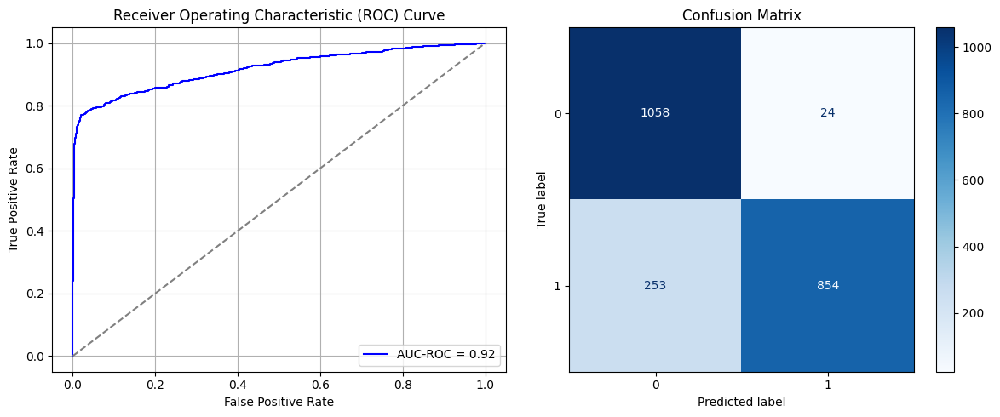

Best threshold based on F1-score: 0.4126420319080353
Time elapsed (performance): 18.091738953999993


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 39ms/step - AUC: 0.7178 - loss: 0.7631 - val_AUC: 0.0000e+00 - val_loss: 1.0136
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7144 - loss: 0.6516 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6928 - loss: 0.6279 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7248 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6991 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7159 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6957 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7320 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.6939 - loss: 0.7730 - val_AUC: 0.0000e+00 - val_loss: 0.9649
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7035 - loss: 0.6699 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6977 - loss: 0.6339 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6967 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6990 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9698
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6987 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7222 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7177 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6768 - loss: 0.8221 - val_AUC: 0.0000e+00 - val_loss: 0.9597
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7005 - loss: 0.7202 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7047 - loss: 0.6194 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7153 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7457 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.9227
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7024 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7383 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7324 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.6910 - loss: 0.7715 - val_AUC: 0.0000e+00 - val_loss: 0.9476
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7083 - loss: 0.6927 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6995 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7290 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7130 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6940 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7136 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7347 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7042 - loss: 0.7430 - val_AUC: 0.0000e+00 - val_loss: 0.9514
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6933 - loss: 0.6786 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6978 - loss: 0.6345 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7094 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7099 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8373
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7017 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7131 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9149
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7206 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 44ms/step - AUC: 0.7190 - loss: 0.7334 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7141 - loss: 0.6722 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7100 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7185 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7025 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7284 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9131
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6847 - loss: 0.7789 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6960 - loss: 0.6858 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7261 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7239 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7135 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7178 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7313 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7430 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.6976 - loss: 0.8368 - val_AUC: 0.0000e+00 - val_loss: 0.9530
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7157 - loss: 0.6609 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7062 - loss: 0.6211 - val_AUC: 0.0000e+00 - val_loss: 0.9554
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6838 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7256 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6925 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7142 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7057 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6978 - loss: 0.7997 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6837 - loss: 0.7347 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7149 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6982 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7014 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7094 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7388 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.9151
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7286 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6726 - loss: 0.8087 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6994 - loss: 0.6679 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7124 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7198 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7270 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7210 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7043 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - AUC: 0.6886 - loss: 0.8047 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7073 - loss: 0.6795 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7073 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9352
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7246 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7058 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7239 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.7062 - loss: 0.7985 - val_AUC: 0.0000e+00 - val_loss: 0.9650
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6908 - loss: 0.7090 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7099 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7064 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7180 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7088 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7100 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7162 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.6857 - loss: 0.8318 - val_AUC: 0.0000e+00 - val_loss: 0.9159
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7046 - loss: 0.6873 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6952 - loss: 0.6255 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7041 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7228 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6911 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7091 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.7087 - loss: 0.7939 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7101 - loss: 0.6643 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7070 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7176 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6821 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7237 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7191 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7145 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6805 - loss: 0.8096 - val_AUC: 0.0000e+00 - val_loss: 0.9443
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6901 - loss: 0.6935 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6987 - loss: 0.6329 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7279 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7232 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.9421
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7099 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7265 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7232 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8627
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 38ms/step - AUC: 0.7116 - loss: 0.7766 - val_AUC: 0.0000e+00 - val_loss: 0.9899
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.7046 - loss: 0.6706 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6980 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.8634
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7230 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6958 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7284 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7323 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7293 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9150
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 36ms/step - AUC: 0.7118 - loss: 0.7921 - val_AUC: 0.0000e+00 - val_loss: 0.9862
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7243 - loss: 0.6672 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7212 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7357 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7333 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.8368
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7235 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9243
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7103 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7339 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7074 - loss: 0.7704 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7054 - loss: 0.6558 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6909 - loss: 0.6406 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7119 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7024 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7339 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7222 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7148 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - AUC: 0.6896 - loss: 0.7756 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6664 - loss: 0.7358 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6967 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7251 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7188 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7115 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7102 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5685 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6973 - loss: 0.7876 - val_AUC: 0.0000e+00 - val_loss: 0.9593
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6832 - loss: 0.6832 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6804 - loss: 0.6366 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7046 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6905 - loss: 0.6129 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7317 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7225 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7118 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - AUC: 0.7072 - loss: 0.6130 - val_AUC: 0.8938 - val_loss: 0.3810
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8926 - loss: 0.3704 - val_AUC: 0.9101 - val_loss: 0.3211
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9033 - loss: 0.3399 - val_AUC: 0.9182 - val_loss: 0.3225
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9087 - loss: 0.3366 - val_AUC: 0.9159 - val_loss: 0.3100
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9183 - loss: 0.3202 - val_AUC: 0.9217 - val_loss: 0.3031
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9217 - loss: 0.3128 - val_AUC: 0.9204 - val_loss: 0.3054
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9237 - loss: 0.3072 - val_AUC: 0.9113 - val_loss: 0.3229
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9206 - loss: 0.3213 - val_AUC: 0.9241 - val_loss: 0.3029
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step -

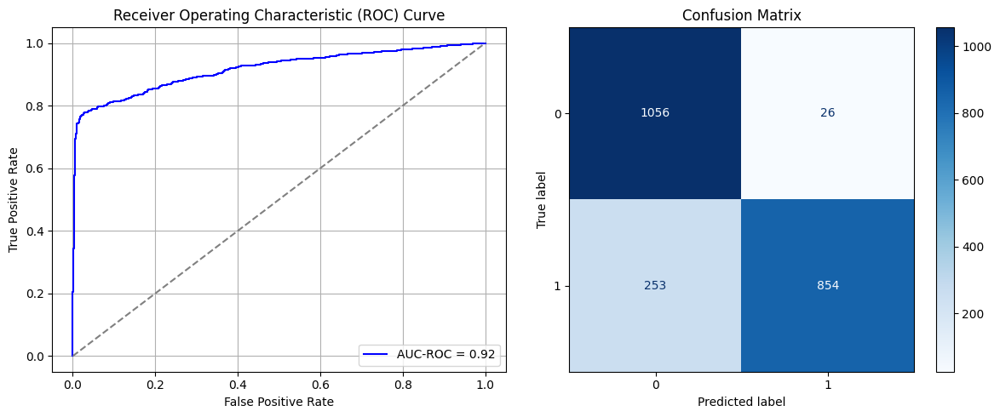

Best threshold based on F1-score: 0.4620336890220642
Time elapsed (performance): 18.066895461999593


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6905 - loss: 0.8173 - val_AUC: 0.0000e+00 - val_loss: 0.8593
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6899 - loss: 0.6392 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7029 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.9832
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7263 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7104 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7112 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7207 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7633 - loss: 0.5569 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7079 - loss: 0.8131 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7038 - loss: 0.6346 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7300 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7317 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7130 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7239 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7109 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7245 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9463
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - AUC: 0.6840 - loss: 0.8391 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7007 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7138 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7334 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6959 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7129 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7306 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7330 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9275
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - AUC: 0.6879 - loss: 0.8626 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6937 - loss: 0.6654 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7326 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7135 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7281 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7288 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7319 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7095 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - AUC: 0.7206 - loss: 0.7915 - val_AUC: 0.0000e+00 - val_loss: 0.8286
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7058 - loss: 0.6360 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7155 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7111 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7254 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7173 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7314 - loss: 0.7803 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7127 - loss: 0.6329 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7058 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7283 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7268 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7365 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7293 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step - AUC: 0.6887 - loss: 0.8330 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7027 - loss: 0.6588 - val_AUC: 0.0000e+00 - val_loss: 0.9007
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7157 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7190 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6904 - loss: 0.6222 - val_AUC: 0.0000e+00 - val_loss: 0.9261
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7346 - loss: 0.5680 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6866 - loss: 0.8632 - val_AUC: 0.0000e+00 - val_loss: 0.8527
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7096 - loss: 0.6814 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7144 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7257 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7273 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8869
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7253 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7298 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9594
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7368 - loss: 0.5599 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7264 - loss: 0.8053 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7086 - loss: 0.6556 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6951 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7262 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9226
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7167 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7489 - loss: 0.5613 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7458 - loss: 0.5654 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.6965 - loss: 0.8397 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7144 - loss: 0.6491 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7082 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7044 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7424 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7269 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8452
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7190 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7102 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 35ms/step - AUC: 0.7134 - loss: 0.8137 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7050 - loss: 0.6402 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8580
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6991 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7278 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7404 - loss: 0.5676 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7148 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7365 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.6981 - loss: 0.8820 - val_AUC: 0.0000e+00 - val_loss: 0.8381
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7143 - loss: 0.6610 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7027 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7331 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7340 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7175 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9601
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7408 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 37ms/step - AUC: 0.6766 - loss: 0.8716 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7076 - loss: 0.6384 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6984 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7131 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9052
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7279 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6960 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7267 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - AUC: 0.7031 - loss: 0.8567 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7177 - loss: 0.6246 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7072 - loss: 0.6242 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7136 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7473 - loss: 0.5544 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7240 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.9304
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7237 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7263 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - AUC: 0.7064 - loss: 0.8273 - val_AUC: 0.0000e+00 - val_loss: 0.8040
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7022 - loss: 0.6665 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7319 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7269 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9514
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7223 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.6968 - loss: 0.8802 - val_AUC: 0.0000e+00 - val_loss: 0.8162
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7261 - loss: 0.6431 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7025 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7312 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8480
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7218 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7097 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7146 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - AUC: 0.7251 - loss: 0.7836 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7034 - loss: 0.6319 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7102 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7341 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7282 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8662
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7300 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - AUC: 0.7182 - loss: 0.8321 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7166 - loss: 0.6333 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.6902 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7186 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7406 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9210
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7437 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7488 - loss: 0.5603 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.6896 - loss: 0.8407 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7242 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7152 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7282 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7283 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7378 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7424 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - AUC: 0.7139 - loss: 0.8027 - val_AUC: 0.0000e+00 - val_loss: 0.8551
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6963 - loss: 0.6766 - val_AUC: 0.0000e+00 - val_loss: 0.9432
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7056 - loss: 0.6275 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7084 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6978 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7138 - loss: 0.5984 - val_AUC: 0.0000e+00 - val_loss: 0.9592
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7161 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9644
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7219 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

In [38]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRSwR = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRSwR, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_SRSwR, X_T_test, y_T_train_SRSwR, y_T_test, 0, 4)

In [39]:
print(ParamFit)
ParamFit.to_csv('SRSwR_Fine_Tuning.csv')

         FPR       FNR
0   0.113154  0.594714
1   0.111740  0.603524
2   0.113154  0.599119
3   0.111740  0.607930
4   0.113154  0.599119
..       ...       ...
95  0.110325  0.594714
96  0.110325  0.594714
97  0.110325  0.594714
98  0.108911  0.603524
99  0.110325  0.594714

[100 rows x 2 columns]


In [40]:
ParamFit['FNR'].mean()

np.float64(0.6039207048458151)

## Systematic Sampling:

First, we select a single systematic sample from the majority class, in which $k = \frac{N_0}{N_1}$, where $N_0$ is the majority class size in the source domain and $N_1$ is the minority class in the source domain.

In [32]:
X_S_Sy, y_S_Sy = systematic_undersampler(data_S_full, data_S_full.iloc[:,-1])
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_undersampler(T_train, T_train.iloc[:, -1])
print(y_T_train_Sy)


5472
16799
3.0699926900584797
2
[1, 4, 7, 10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 43, 47, 50, 53, 56, 59, 62, 65, 68, 71, 74, 77, 80, 83, 86, 90, 93, 96, 99, 102, 105, 108, 111, 114, 117, 120, 123, 126, 129, 133, 136, 139, 142, 145, 148, 151, 154, 157, 160, 163, 166, 169, 172, 175, 179, 182, 185, 188, 191, 194, 197, 200, 203, 206, 209, 212, 215, 218, 222, 225, 228, 231, 234, 237, 240, 243, 246, 249, 252, 255, 258, 261, 265, 268, 271, 274, 277, 280, 283, 286, 289, 292, 295, 298, 301, 304, 307, 311, 314, 317, 320, 323, 326, 329, 332, 335, 338, 341, 344, 347, 350, 354, 357, 360, 363, 366, 369, 372, 375, 378, 381, 384, 387, 390, 393, 397, 400, 403, 406, 409, 412, 415, 418, 421, 424, 427, 430, 433, 436, 440, 443, 446, 449, 452, 455, 458, 461, 464, 467, 470, 473, 476, 479, 482, 486, 489, 492, 495, 498, 501, 504, 507, 510, 513, 516, 519, 522, 525, 529, 532, 535, 538, 541, 544, 547, 550, 553, 556, 559, 562, 565, 568, 572, 575, 578, 581, 584, 587, 590, 593, 596, 599, 602, 605, 608, 611, 614

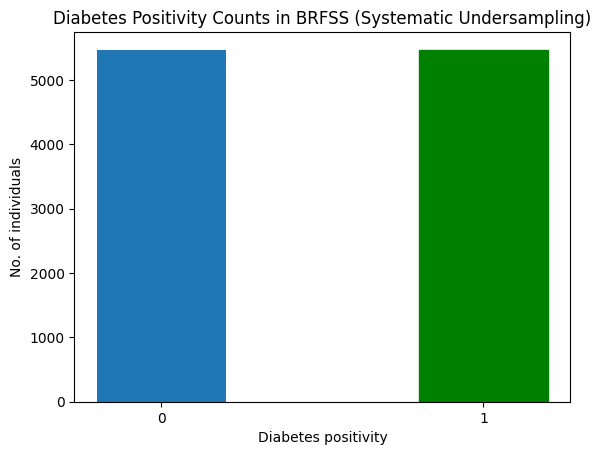

In [33]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Undersampling)")
plt.show()

In [34]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (8755, 22)
y_S_train: (8755,)
X_S_test: (2189, 22)
y_S_test: (2189,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_56 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.6760 - loss: 0.6213 - val_AUC: 0.8911 - val_loss: 0.3660
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8893 - loss: 0.3698 - val_AUC: 0.9100 - val_loss: 0.3237
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9110 - loss: 0.3335 - val_AUC: 0.9146 - val_loss: 0.3170
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9201 - loss: 0.3202 - val_AUC: 0.9099 - val_loss: 0.3474
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9117 - loss: 0.3378 - val_AUC: 0.9146 - val_loss: 0.3244
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9171 - loss: 0.3208 - val_AUC: 0.9128 - val_loss: 0.3399
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9198 - loss: 0.3167 - val_AUC: 0.9202 - val_loss: 0.3151
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9240 - loss: 0.3129 - val_AUC: 0.9201 - val_loss: 0.3088
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

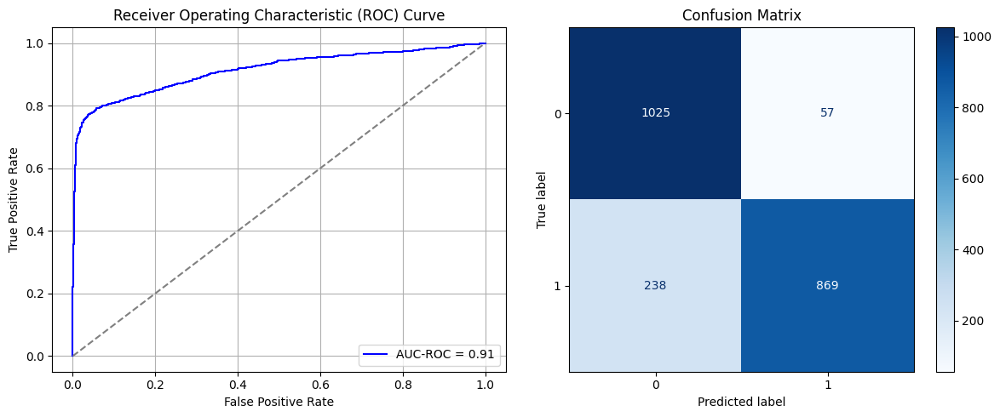

Best threshold based on F1-score: 0.4718717336654663
Time elapsed (performance): 18.95283600700003


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_63 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_68 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_69 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7147 - loss: 0.8184 - val_AUC: 0.0000e+00 - val_loss: 0.9806
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.6655 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6855 - loss: 0.6437 - val_AUC: 0.0000e+00 - val_loss: 0.9386
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7318 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7302 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7234 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7121 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_70 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_71 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_72 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_73 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_74 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_75 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_76 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7053 - loss: 0.8309 - val_AUC: 0.0000e+00 - val_loss: 0.9605
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7238 - loss: 0.6544 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7238 - loss: 0.6208 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7245 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9376
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7205 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7286 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9334
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7143 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.9355
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_77 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_78 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_79 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_80 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_81 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_82 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_83 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7120 - loss: 0.8191 - val_AUC: 0.0000e+00 - val_loss: 0.9747
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7003 - loss: 0.6999 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6986 - loss: 0.6436 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7243 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7111 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7229 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7165 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8623
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_84 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_85 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_86 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_87 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_88 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_89 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_90 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7082 - loss: 0.7516 - val_AUC: 0.0000e+00 - val_loss: 0.9802
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7066 - loss: 0.6634 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7113 - loss: 0.6164 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7241 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7434 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7169 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_91 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_93 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_94 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_95 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_96 (Dense)                │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_97 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7043 - loss: 0.8373 - val_AUC: 0.0000e+00 - val_loss: 0.9977
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6950 - loss: 0.6966 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7200 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7152 - loss: 0.6071 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7168 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7170 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_98 (Dense)                │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_99 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_100 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_101 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_102 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_103 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_104 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - AUC: 0.7125 - loss: 0.7984 - val_AUC: 0.0000e+00 - val_loss: 0.9922
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7012 - loss: 0.6773 - val_AUC: 0.0000e+00 - val_loss: 0.9262
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7191 - loss: 0.6224 - val_AUC: 0.0000e+00 - val_loss: 0.9221
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7238 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8389
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7115 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7348 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_105 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_106 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_107 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_108 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_110 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_111 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7045 - loss: 0.7777 - val_AUC: 0.0000e+00 - val_loss: 0.9758
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7031 - loss: 0.6894 - val_AUC: 0.0000e+00 - val_loss: 0.9641
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7090 - loss: 0.6267 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7033 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.9374
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7134 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7243 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7194 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9202
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7434 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_112 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_113 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_114 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_115 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_116 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_117 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_118 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7021 - loss: 0.7776 - val_AUC: 0.0000e+00 - val_loss: 1.0947
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.6583 - val_AUC: 0.0000e+00 - val_loss: 0.9395
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7277 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7250 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7318 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7343 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8125
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7370 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_119 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_120 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_121 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_122 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_123 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_124 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_125 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7124 - loss: 0.8278 - val_AUC: 0.0000e+00 - val_loss: 0.9774
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6926 - loss: 0.6900 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6988 - loss: 0.6596 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7116 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6979 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.9588
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7296 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8648
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7143 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8291
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7331 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_127 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_128 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_129 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_130 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_131 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_132 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7126 - loss: 0.7860 - val_AUC: 0.0000e+00 - val_loss: 1.0571
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7051 - loss: 0.6733 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7120 - loss: 0.6283 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7176 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7270 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9401
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7270 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_133 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_134 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_135 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_136 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_137 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_138 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_139 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6899 - loss: 0.8502 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6835 - loss: 0.7346 - val_AUC: 0.0000e+00 - val_loss: 0.9114
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.6189 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7242 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7184 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7261 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7166 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7023 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_140 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_141 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_142 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_143 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_144 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_145 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_146 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6896 - loss: 0.8763 - val_AUC: 0.0000e+00 - val_loss: 0.9523
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7328 - loss: 0.6619 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6933 - loss: 0.6445 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7227 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7312 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_147 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_148 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_149 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_150 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_151 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_152 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_153 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6939 - loss: 0.8204 - val_AUC: 0.0000e+00 - val_loss: 0.9888
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6962 - loss: 0.6948 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7164 - loss: 0.6521 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7255 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7167 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7394 - loss: 0.5611 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7273 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_154 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_155 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_156 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_157 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_158 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_159 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_160 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6903 - loss: 0.8087 - val_AUC: 0.0000e+00 - val_loss: 1.0276
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7086 - loss: 0.6524 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7109 - loss: 0.6192 - val_AUC: 0.0000e+00 - val_loss: 0.9438
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7271 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.9949
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7197 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7379 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.9223
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7383 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7357 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_161 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_162 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_163 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_164 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_165 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_166 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_167 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6919 - loss: 0.8176 - val_AUC: 0.0000e+00 - val_loss: 1.0130
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7391 - loss: 0.6478 - val_AUC: 0.0000e+00 - val_loss: 0.9381
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6915 - loss: 0.6444 - val_AUC: 0.0000e+00 - val_loss: 0.8408
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.6061 - val_AUC: 0.0000e+00 - val_loss: 0.9469
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7098 - loss: 0.6007 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7255 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_168 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_169 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_170 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_171 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_172 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_173 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_174 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7023 - loss: 0.8278 - val_AUC: 0.0000e+00 - val_loss: 1.0187
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - AUC: 0.7266 - loss: 0.6707 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7049 - loss: 0.6380 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7354 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7479 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8595
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7170 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7122 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_175 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_176 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_177 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_178 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_179 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_180 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_181 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - AUC: 0.7142 - loss: 0.8150 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6953 - loss: 0.6807 - val_AUC: 0.0000e+00 - val_loss: 0.9367
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6997 - loss: 0.6429 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7379 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7131 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_182 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_183 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_184 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_185 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_186 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_187 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_188 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6899 - loss: 0.8139 - val_AUC: 0.0000e+00 - val_loss: 0.9578
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6953 - loss: 0.6569 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6886 - loss: 0.6453 - val_AUC: 0.0000e+00 - val_loss: 0.9383
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7515 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9284
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7055 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9720
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7523 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7290 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9236
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7157 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_189 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_190 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_191 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_192 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_193 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_194 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_195 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7081 - loss: 0.7763 - val_AUC: 0.0000e+00 - val_loss: 1.1445
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6851 - loss: 0.6804 - val_AUC: 0.0000e+00 - val_loss: 0.8957
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.6219 - val_AUC: 0.0000e+00 - val_loss: 0.9451
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7124 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7152 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7406 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7243 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8355
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7359 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_196 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_197 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_198 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_199 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_200 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_201 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_202 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7073 - loss: 0.8006 - val_AUC: 0.0000e+00 - val_loss: 1.0011
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7066 - loss: 0.7059 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7051 - loss: 0.6432 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7389 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7305 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7202 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7201 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7299 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9086
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_203 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_204 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_205 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_206 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_207 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_208 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_209 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7089 - loss: 0.6108 - val_AUC: 0.8940 - val_loss: 0.3702
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9000 - loss: 0.3619 - val_AUC: 0.9120 - val_loss: 0.3219
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9115 - loss: 0.3338 - val_AUC: 0.9091 - val_loss: 0.3222
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9184 - loss: 0.3287 - val_AUC: 0.9204 - val_loss: 0.3063
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9102 - loss: 0.3379 - val_AUC: 0.9155 - val_loss: 0.3153
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9136 - loss: 0.3260 - val_AUC: 0.9119 - val_loss: 0.3496
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9136 - loss: 0.3278 - val_AUC: 0.9164 - val_loss: 0.3166
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9227 - loss: 0.3092 - val_AUC: 0.9208 - val_loss: 0.3076
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - 

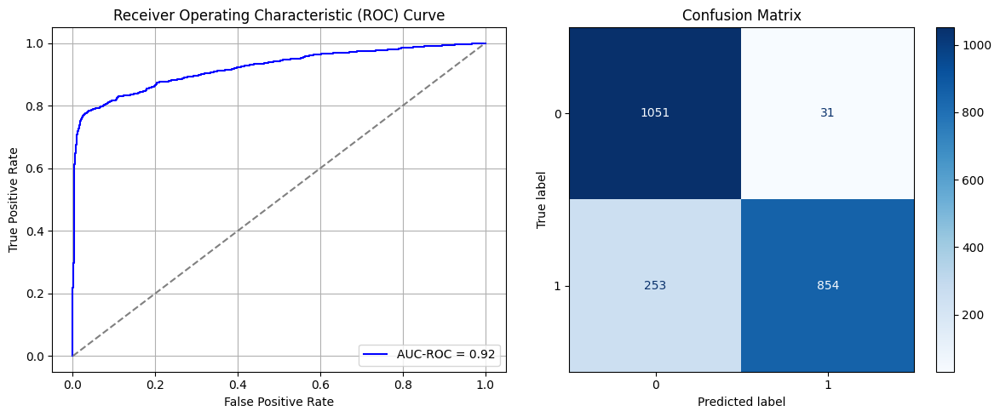

Best threshold based on F1-score: 0.4014061987400055
Time elapsed (performance): 14.77267869100001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_210 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_211 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_212 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_213 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_214 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_215 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_216 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7037 - loss: 0.8070 - val_AUC: 0.0000e+00 - val_loss: 1.0098
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7068 - loss: 0.6393 - val_AUC: 0.0000e+00 - val_loss: 0.9500
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7240 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7374 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7268 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6989 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8794
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8792
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7405 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_217 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_218 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_219 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_220 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_221 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_222 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_223 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7277 - loss: 0.7841 - val_AUC: 0.0000e+00 - val_loss: 0.9738
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7208 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9787
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7043 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7372 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7288 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7320 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7233 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9652
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7380 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8476
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_224 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_225 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_226 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_227 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_228 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_229 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_230 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7063 - loss: 0.8058 - val_AUC: 0.0000e+00 - val_loss: 0.9881
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7385 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7126 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.9596
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7041 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9825
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7095 - loss: 0.6055 - val_AUC: 0.0000e+00 - val_loss: 0.9223
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7280 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7508 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_231 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_232 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_233 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_234 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_235 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_236 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_237 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7162 - loss: 0.7671 - val_AUC: 0.0000e+00 - val_loss: 1.0426
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.6237 - val_AUC: 0.0000e+00 - val_loss: 0.9136
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7208 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7239 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9536
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7358 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7381 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7253 - loss: 0.5602 - val_AUC: 0.0000e+00 - val_loss: 0.7850
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7266 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_238 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_239 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_240 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_241 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_242 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_243 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_244 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7063 - loss: 0.7927 - val_AUC: 0.0000e+00 - val_loss: 1.0461
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7081 - loss: 0.6327 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7091 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9564
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7200 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7443 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7078 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7293 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_245 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_246 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_247 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_248 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_249 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_250 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_251 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7046 - loss: 0.8349 - val_AUC: 0.0000e+00 - val_loss: 0.9742
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7006 - loss: 0.6349 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7065 - loss: 0.6141 - val_AUC: 0.0000e+00 - val_loss: 0.9623
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7330 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9678
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7456 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9541
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6953 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.9878
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7541 - loss: 0.5566 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_252 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_253 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_254 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_255 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_256 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_257 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_258 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 33ms/step - AUC: 0.7071 - loss: 0.8119 - val_AUC: 0.0000e+00 - val_loss: 1.0023
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7171 - loss: 0.6204 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7222 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9602
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7115 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7289 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7119 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7211 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7241 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9496
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_259 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_260 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_261 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_262 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_263 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_264 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_265 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7073 - loss: 0.8568 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7186 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7194 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7489 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7487 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7405 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7047 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_266 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_267 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_268 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_269 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_270 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_271 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_272 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6898 - loss: 0.8370 - val_AUC: 0.0000e+00 - val_loss: 1.0123
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6867 - loss: 0.6753 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7067 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 1.0125
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7186 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_273 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_274 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_275 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_276 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_277 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_278 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_279 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7154 - loss: 0.8029 - val_AUC: 0.0000e+00 - val_loss: 1.0537
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6914 - loss: 0.6340 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7040 - loss: 0.6113 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7087 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7453 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8528
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7154 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7368 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9462
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7057 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9385
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_40"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_280 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_281 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_282 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_283 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_284 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_285 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_286 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6934 - loss: 0.8362 - val_AUC: 0.0000e+00 - val_loss: 0.9992
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6908 - loss: 0.6594 - val_AUC: 0.0000e+00 - val_loss: 0.9419
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9663
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7225 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9250
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7464 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9215
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7403 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9632
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_41"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_287 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_288 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_289 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_290 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_291 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_292 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_293 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7100 - loss: 0.8101 - val_AUC: 0.0000e+00 - val_loss: 1.0098
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6777 - loss: 0.6661 - val_AUC: 0.0000e+00 - val_loss: 0.9940
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7028 - loss: 0.6314 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7344 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7261 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7266 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9448
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7120 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.9226
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_42"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_294 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_295 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_296 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_297 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_298 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_299 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_300 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7302 - loss: 0.7966 - val_AUC: 0.0000e+00 - val_loss: 1.0039
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7240 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7061 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7054 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7264 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9807
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7017 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9226
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7229 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_43"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_301 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_302 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_303 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_304 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_305 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_306 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_307 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7276 - loss: 0.8286 - val_AUC: 0.0000e+00 - val_loss: 0.9517
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6967 - loss: 0.6361 - val_AUC: 0.0000e+00 - val_loss: 0.8581
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7417 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7116 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7406 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7135 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7163 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9011
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7262 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8439
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_44"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_308 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_309 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_310 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_311 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_312 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_313 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_314 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7023 - loss: 0.8571 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7125 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.9263
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7071 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7522 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7225 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7287 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7497 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7575 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_45"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_315 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_316 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_317 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_318 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_319 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_320 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_321 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6731 - loss: 0.8736 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7010 - loss: 0.6384 - val_AUC: 0.0000e+00 - val_loss: 0.9374
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7106 - loss: 0.6123 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7223 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9313
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7393 - loss: 0.5594 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7412 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7188 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9607
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_46"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_322 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_323 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_324 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_325 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_326 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_327 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_328 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7271 - loss: 0.7982 - val_AUC: 0.0000e+00 - val_loss: 0.9839
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7059 - loss: 0.6286 - val_AUC: 0.0000e+00 - val_loss: 0.9395
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8472
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7446 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7422 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7246 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7546 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8506
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_47"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_329 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_330 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_331 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_332 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_333 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_334 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_335 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7198 - loss: 0.7838 - val_AUC: 0.0000e+00 - val_loss: 1.0089
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6965 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7151 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 1.0216
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7120 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7333 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 1.0110
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7298 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7351 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8263
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7525 - loss: 0.5626 - val_AUC: 0.0000e+00 - val_loss: 0.8760
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_48"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_336 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_337 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_338 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_339 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_340 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_341 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_342 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7020 - loss: 0.8370 - val_AUC: 0.0000e+00 - val_loss: 0.9817
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7140 - loss: 0.6444 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7026 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9616
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7151 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9684
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7337 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7584 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_49"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_343 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_344 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_345 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_346 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_347 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_348 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_349 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7312 - loss: 0.7453 - val_AUC: 0.0000e+00 - val_loss: 0.9591
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7317 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7126 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7145 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7162 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9981
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7372 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.9385
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9522
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_50"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_350 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_351 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_352 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_353 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_354 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_355 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_356 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - AUC: 0.7019 - loss: 0.6241 - val_AUC: 0.8809 - val_loss: 0.4030
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8886 - loss: 0.3882 - val_AUC: 0.8977 - val_loss: 0.3790
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.8960 - loss: 0.3577 - val_AUC: 0.9097 - val_loss: 0.3234
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9037 - loss: 0.3476 - val_AUC: 0.9224 - val_loss: 0.3088
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9165 - loss: 0.3216 - val_AUC: 0.9218 - val_loss: 0.3063
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9183 - loss: 0.3190 - val_AUC: 0.9150 - val_loss: 0.3179
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9156 - loss: 0.3249 - val_AUC: 0.9146 - val_loss: 0.3161
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9242 - loss: 0.3161 - val_AUC: 0.9223 - val_loss: 0.3174
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

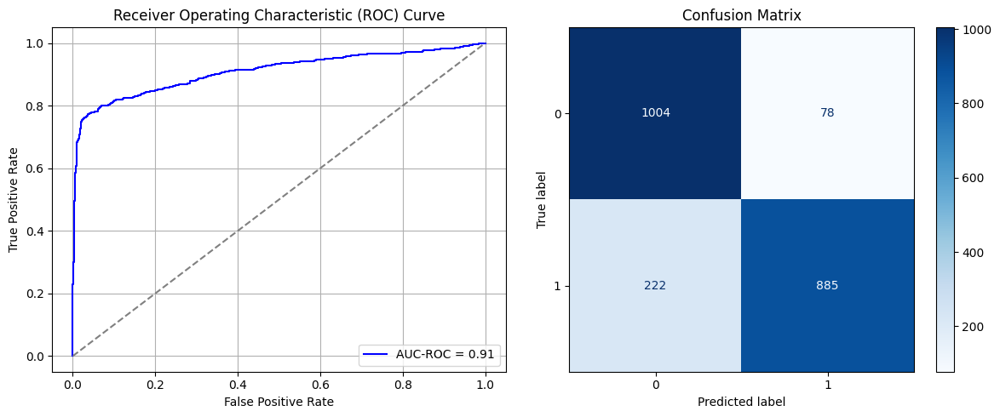

Best threshold based on F1-score: 0.5023015737533569
Time elapsed (performance): 17.38921560999995


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_51"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_357 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_358 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_359 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_360 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_361 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_362 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_363 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.6856 - loss: 0.9206 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6910 - loss: 0.6861 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7146 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7005 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.9095
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6940 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7030 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7087 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_52"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_364 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_365 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_366 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_367 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_368 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_369 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_370 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6834 - loss: 0.8991 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7150 - loss: 0.6554 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7127 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9321
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6989 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7160 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7188 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6993 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7108 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_53"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_371 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_372 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_373 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_374 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_375 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_376 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_377 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7070 - loss: 0.8693 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7040 - loss: 0.6735 - val_AUC: 0.0000e+00 - val_loss: 0.9222
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.6882 - loss: 0.6172 - val_AUC: 0.0000e+00 - val_loss: 0.9514
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7016 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6907 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6966 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7101 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9199
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7013 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9165
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_54"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_378 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_379 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_380 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_381 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_382 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_383 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_384 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6551 - loss: 0.9530 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.6719 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6968 - loss: 0.6222 - val_AUC: 0.0000e+00 - val_loss: 0.9433
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7215 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6983 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7444 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7299 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_385 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_386 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_387 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_388 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_389 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_390 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_391 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7217 - loss: 0.8384 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7059 - loss: 0.6630 - val_AUC: 0.0000e+00 - val_loss: 0.9215
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7003 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7077 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.9247
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7002 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6991 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7084 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_56"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_392 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_393 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_394 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_395 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_396 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_397 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_398 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7155 - loss: 0.8473 - val_AUC: 0.0000e+00 - val_loss: 0.8437
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6955 - loss: 0.6904 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6810 - loss: 0.6256 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6796 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6967 - loss: 0.5988 - val_AUC: 0.0000e+00 - val_loss: 0.9387
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6996 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7270 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9239
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7165 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_57"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_399 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_400 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_401 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_402 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_403 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_404 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_405 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7191 - loss: 0.8380 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7039 - loss: 0.6470 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7020 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6994 - loss: 0.6051 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7048 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7217 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_58"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_406 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_407 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_408 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_409 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_410 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_411 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_412 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7159 - loss: 0.8629 - val_AUC: 0.0000e+00 - val_loss: 0.8466
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6832 - loss: 0.7130 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6910 - loss: 0.6390 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6926 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7124 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7262 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7157 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_59"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_413 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_414 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_415 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_416 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_417 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_418 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_419 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7069 - loss: 0.8548 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7186 - loss: 0.6680 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6914 - loss: 0.6296 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6900 - loss: 0.6177 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7005 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7070 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6870 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_60"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_420 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_421 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_422 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_423 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_424 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_425 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_426 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - AUC: 0.7193 - loss: 0.8663 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6887 - loss: 0.6701 - val_AUC: 0.0000e+00 - val_loss: 0.9323
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7228 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9470
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7058 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9381
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7127 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7117 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7041 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_61"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_427 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_428 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_429 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_430 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_431 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_432 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_433 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7030 - loss: 0.9289 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6642 - loss: 0.7344 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6767 - loss: 0.6388 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7070 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6987 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7046 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9199
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7294 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7116 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.9121
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_62"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_434 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_435 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_436 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_437 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_438 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_439 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_440 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6795 - loss: 0.9274 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7144 - loss: 0.6687 - val_AUC: 0.0000e+00 - val_loss: 0.9307
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6914 - loss: 0.6187 - val_AUC: 0.0000e+00 - val_loss: 0.9124
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7121 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.9465
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6976 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6898 - loss: 0.6077 - val_AUC: 0.0000e+00 - val_loss: 0.9212
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6945 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7115 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_63"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_441 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_442 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_443 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_444 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_445 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_446 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_447 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6889 - loss: 0.9145 - val_AUC: 0.0000e+00 - val_loss: 0.8524
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7030 - loss: 0.6930 - val_AUC: 0.0000e+00 - val_loss: 0.9306
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7007 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7023 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6906 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7119 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6883 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_64"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_448 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_449 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_450 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_451 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_452 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_453 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_454 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6732 - loss: 0.9163 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6909 - loss: 0.6827 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7052 - loss: 0.6097 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6888 - loss: 0.6213 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7180 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7108 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7051 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9192
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7168 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_65"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_455 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_456 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_457 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_458 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_459 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_460 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_461 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6901 - loss: 0.8654 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7175 - loss: 0.6650 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6960 - loss: 0.6248 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7079 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7024 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.9267
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7296 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7196 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6848 - loss: 0.6182 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_66"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_462 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_463 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_464 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_465 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_466 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_467 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_468 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6768 - loss: 0.8943 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6846 - loss: 0.6960 - val_AUC: 0.0000e+00 - val_loss: 0.9369
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7007 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7000 - loss: 0.6014 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7066 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7149 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.9410
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7076 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.9207
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7170 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_67"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_469 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_470 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_471 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_472 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_473 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_474 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_475 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6830 - loss: 0.9301 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6667 - loss: 0.6867 - val_AUC: 0.0000e+00 - val_loss: 0.9279
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7008 - loss: 0.6258 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6928 - loss: 0.6060 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7087 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9280
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7080 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9359
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7120 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6973 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_68"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_476 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_477 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_478 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_479 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_480 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_481 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_482 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6911 - loss: 0.9078 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6928 - loss: 0.6654 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7030 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6800 - loss: 0.6105 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6863 - loss: 0.6086 - val_AUC: 0.0000e+00 - val_loss: 0.9141
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7111 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7263 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9289
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7147 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_69"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_483 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_484 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_485 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_486 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_487 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_488 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_489 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7012 - loss: 0.8602 - val_AUC: 0.0000e+00 - val_loss: 0.8403
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6754 - loss: 0.6688 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6866 - loss: 0.6246 - val_AUC: 0.0000e+00 - val_loss: 0.9460
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7027 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6971 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7106 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7086 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.9324
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7178 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9337
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_70"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_490 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_491 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_492 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_493 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_494 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_495 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_496 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7020 - loss: 0.9118 - val_AUC: 0.0000e+00 - val_loss: 0.8644
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7202 - loss: 0.6356 - val_AUC: 0.0000e+00 - val_loss: 0.9223
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7172 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.9523
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7187 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9306
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7196 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9140
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7131 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9443
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7231 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7226 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_71"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_497 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_498 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_499 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_500 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_501 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_502 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_503 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - AUC: 0.6826 - loss: 0.6211 - val_AUC: 0.8979 - val_loss: 0.3629
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.8977 - loss: 0.3645 - val_AUC: 0.9094 - val_loss: 0.3332
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9159 - loss: 0.3205 - val_AUC: 0.9215 - val_loss: 0.3210
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9111 - loss: 0.3250 - val_AUC: 0.9151 - val_loss: 0.3141
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9171 - loss: 0.3270 - val_AUC: 0.9158 - val_loss: 0.3187
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9201 - loss: 0.3179 - val_AUC: 0.9183 - val_loss: 0.3156
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9266 - loss: 0.3055 - val_AUC: 0.9241 - val_loss: 0.3033
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9192 - loss: 0.3154 - val_AUC: 0.9263 - val_loss: 0.3010
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

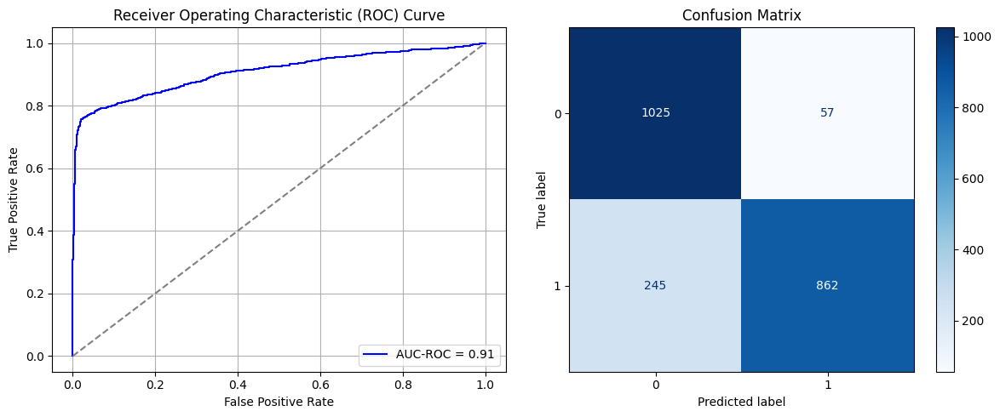

Best threshold based on F1-score: 0.47025686502456665
Time elapsed (performance): 20.17072627899995


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_72"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_504 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_505 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_506 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_507 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_508 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_509 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_510 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7068 - loss: 0.8369 - val_AUC: 0.0000e+00 - val_loss: 0.9523
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7202 - loss: 0.6334 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7038 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7005 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9785
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7220 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7138 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7168 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_73"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_511 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_512 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_513 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_514 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_515 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_516 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_517 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6717 - loss: 0.9045 - val_AUC: 0.0000e+00 - val_loss: 0.9452
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7134 - loss: 0.6304 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7295 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7335 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7069 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9695
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7263 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9419
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7160 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7234 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_74"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_518 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_519 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_520 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_521 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_522 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_523 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_524 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7225 - loss: 0.8052 - val_AUC: 0.0000e+00 - val_loss: 0.9781
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6994 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7196 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7321 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7299 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6978 - loss: 0.6100 - val_AUC: 0.0000e+00 - val_loss: 0.9331
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7530 - loss: 0.5655 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_525 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_526 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_527 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_528 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_529 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_530 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_531 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - AUC: 0.6995 - loss: 0.8088 - val_AUC: 0.0000e+00 - val_loss: 0.9896
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7101 - loss: 0.6334 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7312 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7177 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7236 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7415 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7351 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7404 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_76"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_532 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_533 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_534 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_535 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_536 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_537 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_538 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6845 - loss: 0.8395 - val_AUC: 0.0000e+00 - val_loss: 0.9570
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7018 - loss: 0.6184 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7131 - loss: 0.6008 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7105 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7330 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9572
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7038 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9521
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7381 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_77"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_539 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_540 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_541 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_542 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_543 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_544 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_545 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7060 - loss: 0.8028 - val_AUC: 0.0000e+00 - val_loss: 0.9611
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7042 - loss: 0.6126 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7170 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7219 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7231 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9636
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7383 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7313 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7341 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8245
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/ste

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_78"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_546 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_547 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_548 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_549 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_550 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_551 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_552 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6902 - loss: 0.8169 - val_AUC: 0.0000e+00 - val_loss: 0.9872
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7054 - loss: 0.6470 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7186 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7150 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7611 - loss: 0.5634 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7293 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9298
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7199 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9521
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7434 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_79"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_553 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_554 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_555 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_556 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_557 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_558 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_559 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6977 - loss: 0.8235 - val_AUC: 0.0000e+00 - val_loss: 0.9693
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7019 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7088 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.9821
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7167 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7250 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7244 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_80"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_560 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_561 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_562 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_563 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_564 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_565 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_566 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6865 - loss: 0.8485 - val_AUC: 0.0000e+00 - val_loss: 0.9257
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7067 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7325 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9544
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7362 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7272 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7345 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7437 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7016 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.9417
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_81"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_567 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_568 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_569 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_570 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_571 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_572 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_573 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6883 - loss: 0.8618 - val_AUC: 0.0000e+00 - val_loss: 0.9405
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7084 - loss: 0.6148 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7257 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6973 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7264 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7299 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7302 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.9626
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7243 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9250
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_82"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_574 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_575 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_576 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_577 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_578 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_579 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_580 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7040 - loss: 0.8423 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7104 - loss: 0.6320 - val_AUC: 0.0000e+00 - val_loss: 0.9475
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7576 - loss: 0.5505 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7253 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7081 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.9576
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7270 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9787
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7282 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7184 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_83"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_581 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_582 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_583 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_584 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_585 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_586 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_587 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - AUC: 0.6902 - loss: 0.8144 - val_AUC: 0.0000e+00 - val_loss: 0.9401
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7141 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7228 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7313 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6994 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9050
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7299 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8371
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7330 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7325 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_84"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_588 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_589 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_590 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_591 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_592 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_593 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_594 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6883 - loss: 0.8516 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7107 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7205 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9578
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7168 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9505
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7238 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9186
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7142 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7131 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6961 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9625
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_85"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_595 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_596 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_597 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_598 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_599 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_600 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_601 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6913 - loss: 0.8439 - val_AUC: 0.0000e+00 - val_loss: 0.9807
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7012 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7343 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7302 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9669
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7001 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7229 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7229 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9603
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_86"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_602 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_603 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_604 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_605 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_606 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_607 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_608 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6958 - loss: 0.8325 - val_AUC: 0.0000e+00 - val_loss: 0.9479
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7198 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7100 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6857 - loss: 0.6101 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7163 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.9485
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7200 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7110 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_87"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_609 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_610 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_611 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_612 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_613 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_614 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_615 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6963 - loss: 0.8372 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7120 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7178 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7256 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7270 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7174 - loss: 0.5970 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7042 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 1.0065
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7366 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_88"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_616 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_617 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_618 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_619 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_620 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_621 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_622 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7059 - loss: 0.8507 - val_AUC: 0.0000e+00 - val_loss: 0.9676
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6978 - loss: 0.6305 - val_AUC: 0.0000e+00 - val_loss: 1.0020
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7156 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.9332
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7327 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7399 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7215 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7186 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_89"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_623 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_624 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_625 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_626 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_627 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_628 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_629 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.6735 - loss: 0.8654 - val_AUC: 0.0000e+00 - val_loss: 1.0083
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7050 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7250 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9164
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7301 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7317 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9022
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7387 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9030
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7111 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7328 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_630 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_631 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_632 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_633 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_634 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_635 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_636 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7198 - loss: 0.8085 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6818 - loss: 0.6533 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7131 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.9538
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7247 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7230 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7243 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7328 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7291 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.9645
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_91"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_637 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_638 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_639 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_640 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_641 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_642 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_643 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6999 - loss: 0.8133 - val_AUC: 0.0000e+00 - val_loss: 0.9788
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6841 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.9514
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7157 - loss: 0.6064 - val_AUC: 0.0000e+00 - val_loss: 0.9869
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7154 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7257 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7219 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8514
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_92"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_644 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_645 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_646 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_647 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_648 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_649 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_650 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6854 - loss: 0.6185 - val_AUC: 0.8994 - val_loss: 0.3663
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9082 - loss: 0.3462 - val_AUC: 0.9133 - val_loss: 0.3220
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.9074 - loss: 0.3321 - val_AUC: 0.9152 - val_loss: 0.3157
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9157 - loss: 0.3135 - val_AUC: 0.9176 - val_loss: 0.3152
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9205 - loss: 0.3201 - val_AUC: 0.9223 - val_loss: 0.3288
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9156 - loss: 0.3273 - val_AUC: 0.9175 - val_loss: 0.3092
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9178 - loss: 0.3157 - val_AUC: 0.9170 - val_loss: 0.3199
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9197 - loss: 0.3220 - val_AUC: 0.9218 - val_loss: 0.3038
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

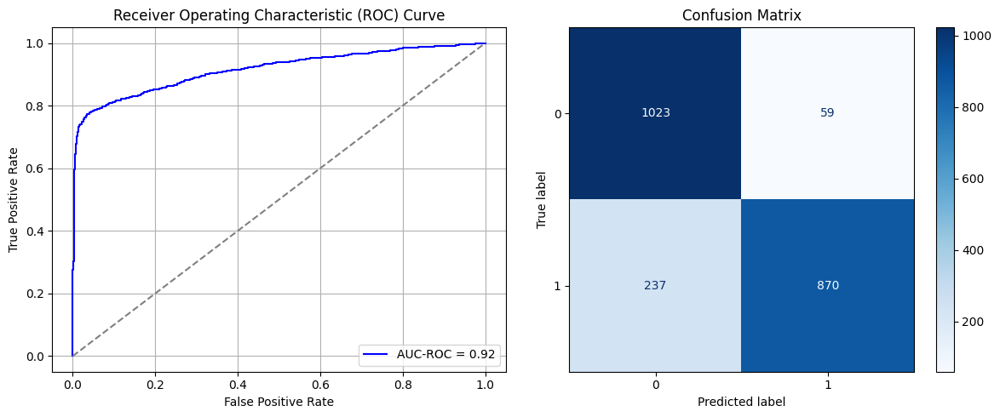

Best threshold based on F1-score: 0.5646188259124756
Time elapsed (performance): 17.46346237700004


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_93"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_651 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_652 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_653 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_654 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_655 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_656 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_657 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - AUC: 0.6871 - loss: 0.8576 - val_AUC: 0.0000e+00 - val_loss: 1.1035
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7044 - loss: 0.6695 - val_AUC: 0.0000e+00 - val_loss: 0.9310
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7033 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7243 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9554
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7366 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6890 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7144 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7299 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_94"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_658 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_659 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_660 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_661 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_662 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_663 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_664 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6919 - loss: 0.8763 - val_AUC: 0.0000e+00 - val_loss: 0.9738
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7008 - loss: 0.6583 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7411 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.9630
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7274 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.7842
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7294 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 1.0052
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7211 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9241
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7207 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7279 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_95"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_665 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_666 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_667 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_668 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_669 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_670 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_671 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7189 - loss: 0.7980 - val_AUC: 0.0000e+00 - val_loss: 1.0589
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7058 - loss: 0.6805 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7193 - loss: 0.6043 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7036 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7142 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7421 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7210 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8030
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7182 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_96"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_672 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_673 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_674 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_675 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_676 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_677 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_678 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7051 - loss: 0.8370 - val_AUC: 0.0000e+00 - val_loss: 0.9874
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7268 - loss: 0.6393 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6936 - loss: 0.6202 - val_AUC: 0.0000e+00 - val_loss: 0.9539
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7161 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7275 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7017 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.9088
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7167 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.7909
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7265 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9536
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/st

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_97"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_679 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_680 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_681 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_682 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_683 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_684 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_685 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7026 - loss: 0.8444 - val_AUC: 0.0000e+00 - val_loss: 1.0297
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6875 - loss: 0.6955 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7200 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7068 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7013 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.9284
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7310 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7465 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_98"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_686 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_687 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_688 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_689 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_690 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_691 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_692 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6966 - loss: 0.8735 - val_AUC: 0.0000e+00 - val_loss: 0.9275
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7320 - loss: 0.6549 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7130 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9534
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7279 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7268 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7260 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 1.0158
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7268 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9643
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7280 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8351
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_99"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_693 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_694 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_695 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_696 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_697 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_698 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_699 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6761 - loss: 0.9234 - val_AUC: 0.0000e+00 - val_loss: 1.0194
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6920 - loss: 0.6683 - val_AUC: 0.0000e+00 - val_loss: 1.0998
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6926 - loss: 0.6293 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7173 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7121 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.9131
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7552 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7374 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7156 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_100"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_700 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_701 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_702 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_703 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_704 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_705 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_706 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7098 - loss: 0.8561 - val_AUC: 0.0000e+00 - val_loss: 1.0349
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6956 - loss: 0.6675 - val_AUC: 0.0000e+00 - val_loss: 0.9463
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7083 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7333 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7152 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7185 - loss: 0.6117 - val_AUC: 0.0000e+00 - val_loss: 1.0194
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7375 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9494
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7265 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_101"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_707 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_708 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_709 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_710 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_711 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_712 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_713 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6966 - loss: 0.8667 - val_AUC: 0.0000e+00 - val_loss: 0.9817
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7110 - loss: 0.6552 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7219 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8207
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7049 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.9537
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7245 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7132 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7328 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.7827
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7287 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9183
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_102"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_714 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_715 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_716 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_717 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_718 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_719 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_720 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6865 - loss: 0.9052 - val_AUC: 0.0000e+00 - val_loss: 1.0102
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7061 - loss: 0.6666 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6935 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7051 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9666
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7451 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7154 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.9878
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7284 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.7747
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7516 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/ste

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_103"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_721 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_722 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_723 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_724 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_725 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_726 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_727 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 56ms/step - AUC: 0.7082 - loss: 0.8125 - val_AUC: 0.0000e+00 - val_loss: 1.0619
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6991 - loss: 0.6644 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7227 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7169 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9423
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7203 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7167 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9635
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7353 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7331 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_104"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_728 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_729 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_730 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_731 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_732 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_733 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_734 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7315 - loss: 0.7611 - val_AUC: 0.0000e+00 - val_loss: 1.0912
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7142 - loss: 0.6408 - val_AUC: 0.0000e+00 - val_loss: 1.0073
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6938 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7146 - loss: 0.6119 - val_AUC: 0.0000e+00 - val_loss: 0.9656
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7333 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8022
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7178 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7152 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7353 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_105"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_735 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_736 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_737 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_738 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_739 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_740 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_741 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - AUC: 0.7092 - loss: 0.8550 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7038 - loss: 0.6548 - val_AUC: 0.0000e+00 - val_loss: 0.9815
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6992 - loss: 0.6261 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7058 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.9520
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7134 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7182 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7426 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7342 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9808
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_106"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_742 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_743 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_744 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_745 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_746 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_747 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_748 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6998 - loss: 0.8646 - val_AUC: 0.0000e+00 - val_loss: 0.9853
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7248 - loss: 0.6351 - val_AUC: 0.0000e+00 - val_loss: 1.0241
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6981 - loss: 0.6244 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7162 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7401 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8801
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7295 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9597
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7313 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_107"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_749 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_750 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_751 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_752 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_753 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_754 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_755 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7064 - loss: 0.8767 - val_AUC: 0.0000e+00 - val_loss: 1.0121
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7106 - loss: 0.6827 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.7008 - loss: 0.6233 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7337 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7118 - loss: 0.6016 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7457 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7287 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7100 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_108"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_756 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_757 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_758 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_759 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_760 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_761 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_762 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6988 - loss: 0.8252 - val_AUC: 0.0000e+00 - val_loss: 1.1172
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6983 - loss: 0.6503 - val_AUC: 0.0000e+00 - val_loss: 0.9552
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7233 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.8320
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7208 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9473
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7577 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.8360
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7370 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7326 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7248 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_763 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_764 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_765 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_766 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_767 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_768 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_769 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.6947 - loss: 0.8287 - val_AUC: 0.0000e+00 - val_loss: 1.0031
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6874 - loss: 0.6773 - val_AUC: 0.0000e+00 - val_loss: 1.0018
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7253 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 1.0096
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7305 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7118 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7102 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7281 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_110"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_770 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_771 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_772 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_773 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_774 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_775 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_776 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7011 - loss: 0.9023 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6999 - loss: 0.6711 - val_AUC: 0.0000e+00 - val_loss: 0.9923
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7161 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7190 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7168 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7298 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7231 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9929
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7154 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_111"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_777 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_778 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_779 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_780 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_781 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_782 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_783 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7098 - loss: 0.8121 - val_AUC: 0.0000e+00 - val_loss: 0.9738
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6836 - loss: 0.6917 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7042 - loss: 0.6254 - val_AUC: 0.0000e+00 - val_loss: 0.9099
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7019 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 1.0143
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7458 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7319 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7494 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7375 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8273
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_112"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_784 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_785 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_786 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_787 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_788 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_789 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_790 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6953 - loss: 0.8910 - val_AUC: 0.0000e+00 - val_loss: 1.0425
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7349 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7135 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7191 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7078 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.9885
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8313
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7149 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9206
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7203 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

In [38]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']



In [39]:
print(ParamFit)
ParamFit.to_csv('Sy_Fine_Tuning.csv')

         FPR       FNR
0   0.110325  0.594714
1   0.115983  0.581498
2   0.111740  0.590308
3   0.113154  0.590308
4   0.115983  0.581498
..       ...       ...
95  0.115983  0.603524
96  0.117397  0.590308
97  0.118812  0.581498
98  0.117397  0.594714
99  0.115983  0.603524

[100 rows x 2 columns]


In [40]:
ParamFit['FNR'].mean()

np.float64(0.5910132158590309)

## Systematic Sampling (multiple samples):

Now, we investigate the possibility of conducting $m$ systematic samples, each with a sampling interval of $k=m*\frac{N_0}{N_1}$, and obtaining the undersampled majority class data using all $m$ systematic samples combined. This may more closely approximate SRS sampling.

For convenience, we take $m=10$ in this case.

In [41]:
X_S_Sy, y_S_Sy = multi_systematic_undersampler(data_S_full, data_S_full.iloc[:,-1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = multi_systematic_undersampler(T_train, T_train.iloc[:,-1], 10)
print(y_T_train_Sy)

5472
16799
3.0699926900584797
[21, 24, 27, 30, 33, 36, 39, 42, 45, 48, 51, 54, 57, 60, 63, 67, 70, 73, 76, 79, 82, 85, 88, 91, 94, 97, 100, 103, 106, 110, 113, 116, 119, 122, 125, 128, 131, 134, 137, 140, 143, 146, 149, 153, 156, 159, 162, 165, 168, 171, 174, 177, 180, 183, 186, 189, 192, 195, 199, 202, 205, 208, 211, 214, 217, 220, 223, 226, 229, 232, 235, 238, 242, 245, 248, 251, 254, 257, 260, 263, 266, 269, 272, 275, 278, 281, 285, 288, 291, 294, 297, 300, 303, 306, 309, 312, 315, 318, 321, 324, 327, 331, 334, 337, 340, 343, 346, 349, 352, 355, 358, 361, 364, 367, 370, 374, 377, 380, 383, 386, 389, 392, 395, 398, 401, 404, 407, 410, 413, 417, 420, 423, 426, 429, 432, 435, 438, 441, 444, 447, 450, 453, 456, 460, 463, 466, 469, 472, 475, 478, 481, 484, 487, 490, 493, 496, 499, 502, 506, 509, 512, 515, 518, 521, 524, 527, 530, 533, 536, 539, 542, 545, 549, 552, 555, 558, 561, 564, 567, 570, 573, 576, 579, 582, 585, 588, 592, 595, 598, 601, 604, 607, 610, 613, 616, 619, 622, 625, 628, 

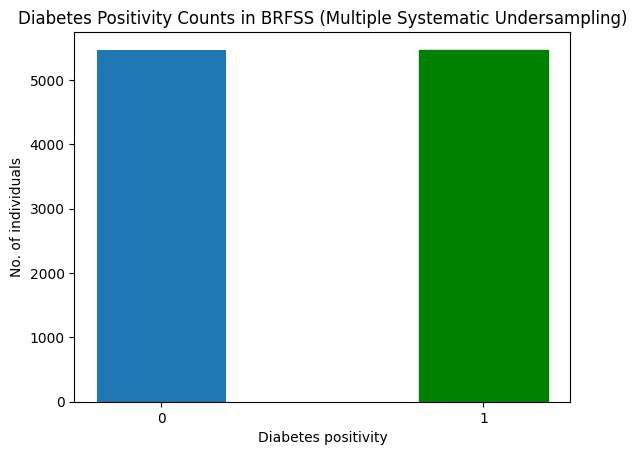

In [42]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Multiple Systematic Undersampling)")
plt.show()

In [43]:
print('X_S_train:',np.shape(X_S_train))
print('y_S_train:',np.shape(y_S_train))
print('X_S_test:',np.shape(X_S_test))
print('y_S_test:',np.shape(y_S_test))

X_S_train: (8753, 22)
y_S_train: (8753,)
X_S_test: (2189, 22)
y_S_test: (2189,)


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_121"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_847 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_848 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_849 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_850 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_851 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_852 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_853 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.6547 - loss: 0.6508 - val_AUC: 0.8697 - val_loss: 0.4199
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8895 - loss: 0.3831 - val_AUC: 0.8963 - val_loss: 0.3625
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9103 - loss: 0.3368 - val_AUC: 0.9150 - val_loss: 0.3349
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9151 - loss: 0.3271 - val_AUC: 0.9210 - val_loss: 0.3369
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9086 - loss: 0.3321 - val_AUC: 0.9234 - val_loss: 0.3173
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9227 - loss: 0.3065 - val_AUC: 0.9198 - val_loss: 0.3269
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9159 - loss: 0.3144 - val_AUC: 0.9247 - val_loss: 0.3145
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9218 - loss: 0.3145 - val_AUC: 0.9248 - val_loss: 0.3200
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - 

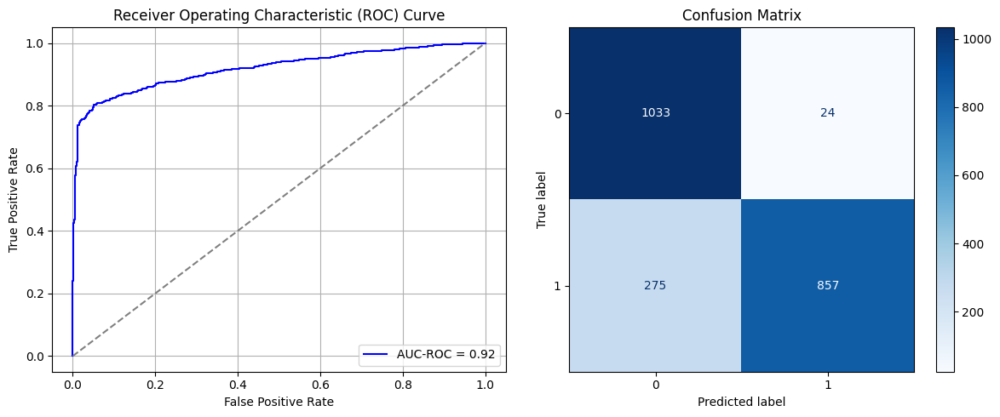

Best threshold based on F1-score: 0.3620290458202362
Time elapsed (performance): 16.72470050899983


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_122"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_854 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_855 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_856 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_857 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_858 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_859 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_860 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6815 - loss: 0.8473 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7156 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9536
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7208 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7070 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7252 - loss: 0.6054 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7331 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7197 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7533 - loss: 0.5639 - val_AUC: 0.0000e+00 - val_loss: 0.8216
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_123"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_861 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_862 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_863 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_864 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_865 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_866 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_867 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step - AUC: 0.6880 - loss: 0.7867 - val_AUC: 0.0000e+00 - val_loss: 0.9782
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6878 - loss: 0.6599 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7180 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7045 - loss: 0.6160 - val_AUC: 0.0000e+00 - val_loss: 0.9286
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7257 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7162 - loss: 0.6017 - val_AUC: 0.0000e+00 - val_loss: 0.9195
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7293 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7081 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_124"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_868 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_869 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_870 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_871 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_872 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_873 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_874 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7230 - loss: 0.7574 - val_AUC: 0.0000e+00 - val_loss: 0.9743
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.6348 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6980 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7109 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7076 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.9357
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7445 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7161 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_125"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_875 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_876 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_877 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_878 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_879 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_880 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_881 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6984 - loss: 0.7811 - val_AUC: 0.0000e+00 - val_loss: 1.0181
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7146 - loss: 0.6257 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6906 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8619
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7239 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7127 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9462
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7415 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8188
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7253 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_126"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_882 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_883 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_884 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_885 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_886 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_887 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_888 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6901 - loss: 0.8518 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6775 - loss: 0.6718 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7047 - loss: 0.6277 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6846 - loss: 0.6144 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7004 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8217
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7150 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9211
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7115 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7183 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_127"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_889 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_890 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_891 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_892 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_893 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_894 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_895 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6989 - loss: 0.8052 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6922 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7205 - loss: 0.6109 - val_AUC: 0.0000e+00 - val_loss: 0.9533
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7191 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8143
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7168 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7180 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7180 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8878
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7147 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_128"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_896 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_897 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_898 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_899 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_900 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_901 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_902 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7019 - loss: 0.8018 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7063 - loss: 0.6379 - val_AUC: 0.0000e+00 - val_loss: 0.8764
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7135 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7166 - loss: 0.5957 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6939 - loss: 0.6059 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7536 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6971 - loss: 0.5996 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7252 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8483
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_129"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_903 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_904 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_905 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_906 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_907 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_908 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_909 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7317 - loss: 0.7355 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6997 - loss: 0.6107 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7065 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7246 - loss: 0.5981 - val_AUC: 0.0000e+00 - val_loss: 1.0198
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7103 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7081 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_130"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_910 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_911 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_912 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_913 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_914 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_915 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_916 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7309 - loss: 0.7761 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7000 - loss: 0.6324 - val_AUC: 0.0000e+00 - val_loss: 0.9296
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7210 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8353
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7025 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.9995
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7093 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.9288
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7246 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8816
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7168 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7379 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_131"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_917 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_918 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_919 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_920 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_921 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_922 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_923 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7079 - loss: 0.7747 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6929 - loss: 0.6565 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7149 - loss: 0.6029 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6853 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7126 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7058 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.9013
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.8469
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7316 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_132"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_924 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_925 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_926 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_927 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_928 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_929 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_930 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.7009 - loss: 0.8385 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6827 - loss: 0.6666 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7064 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6974 - loss: 0.6088 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7217 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8384
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7288 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6834 - loss: 0.6108 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7362 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_133"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_931 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_932 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_933 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_934 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_935 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_936 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_937 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6900 - loss: 0.8274 - val_AUC: 0.0000e+00 - val_loss: 0.9515
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7141 - loss: 0.6171 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6948 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7102 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7249 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7198 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7221 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.9666
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7329 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_134"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_938 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_939 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_940 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_941 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_942 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_943 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_944 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7059 - loss: 0.7902 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7259 - loss: 0.5976 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6980 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7044 - loss: 0.6065 - val_AUC: 0.0000e+00 - val_loss: 0.9788
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7021 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7179 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9404
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - AUC: 0.7318 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7082 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.9737
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_135"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_945 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_946 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_947 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_948 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_949 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_950 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_951 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7105 - loss: 0.7771 - val_AUC: 0.0000e+00 - val_loss: 0.9618
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6957 - loss: 0.6548 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7057 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7184 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.9927
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7077 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.9178
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7275 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.9769
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7258 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_136"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_952 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_953 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_954 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_955 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_956 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_957 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_958 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6975 - loss: 0.8105 - val_AUC: 0.0000e+00 - val_loss: 0.9256
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7118 - loss: 0.6410 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7074 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.9586
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7118 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6925 - loss: 0.6032 - val_AUC: 0.0000e+00 - val_loss: 0.8605
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7342 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7144 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7364 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_137"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_959 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_960 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_961 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_962 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_963 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_964 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_965 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7184 - loss: 0.7535 - val_AUC: 0.0000e+00 - val_loss: 0.9459
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6977 - loss: 0.6350 - val_AUC: 0.0000e+00 - val_loss: 0.9753
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6832 - loss: 0.6238 - val_AUC: 0.0000e+00 - val_loss: 0.8337
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7171 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9706
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9399
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7083 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7364 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7217 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_138"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_966 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_967 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_968 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_969 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_970 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_971 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_972 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6886 - loss: 0.8424 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7311 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7028 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 1.0124
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7325 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7172 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7252 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9951
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7285 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7358 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_139"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_973 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_974 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_975 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_976 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_977 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_978 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_979 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6907 - loss: 0.7900 - val_AUC: 0.0000e+00 - val_loss: 0.9840
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7072 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7294 - loss: 0.6090 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7198 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7233 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7091 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7051 - loss: 0.6006 - val_AUC: 0.0000e+00 - val_loss: 0.9214
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7352 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_140"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_980 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_981 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_982 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_983 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_984 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_985 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_986 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6957 - loss: 0.8239 - val_AUC: 0.0000e+00 - val_loss: 0.9709
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7074 - loss: 0.6351 - val_AUC: 0.0000e+00 - val_loss: 0.9333
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7112 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8811
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7196 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7154 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7167 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8660
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7032 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.9491
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_141"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_987 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_988 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_989 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_990 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_991 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_992 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_993 (Dense)               │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.6849 - loss: 0.8761 - val_AUC: 0.0000e+00 - val_loss: 0.9800
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7203 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.9072
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7146 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7018 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7352 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8637
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7065 - loss: 0.6083 - val_AUC: 0.0000e+00 - val_loss: 0.9373
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7006 - loss: 0.6087 - val_AUC: 0.0000e+00 - val_loss: 0.9464
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7314 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_142"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_994 (Dense)               │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_995 (Dense)               │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_996 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_997 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_998 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_999 (Dense)               │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1000 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7268 - loss: 0.6021 - val_AUC: 0.8975 - val_loss: 0.3691
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.8919 - loss: 0.3583 - val_AUC: 0.8939 - val_loss: 0.3661
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9099 - loss: 0.3322 - val_AUC: 0.9143 - val_loss: 0.3356
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9169 - loss: 0.3201 - val_AUC: 0.8989 - val_loss: 0.3495
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9090 - loss: 0.3282 - val_AUC: 0.9178 - val_loss: 0.3383
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9259 - loss: 0.3056 - val_AUC: 0.9205 - val_loss: 0.3211
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9306 - loss: 0.3001 - val_AUC: 0.9192 - val_loss: 0.3323
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9282 - loss: 0.2981 - val_AUC: 0.9161 - val_loss: 0.3323
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

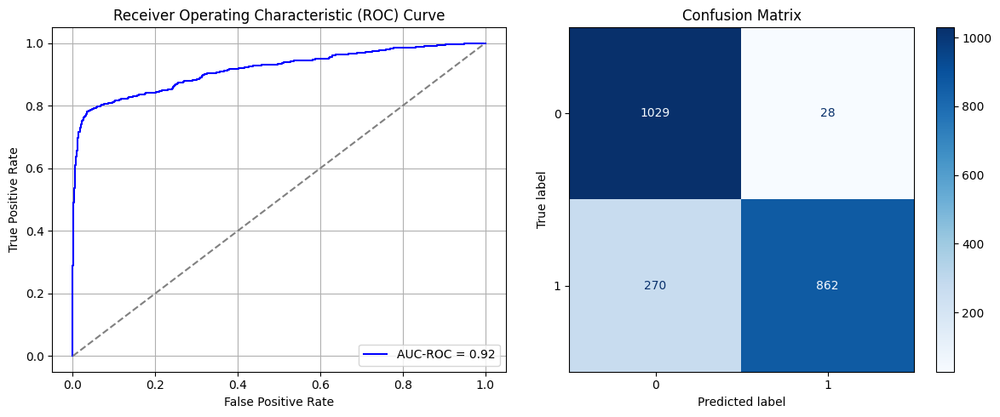

Best threshold based on F1-score: 0.43163344264030457
Time elapsed (performance): 16.41062364100003


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_143"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1001 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1002 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1003 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1007 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6896 - loss: 0.8501 - val_AUC: 0.0000e+00 - val_loss: 1.0794
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6737 - loss: 0.6693 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7169 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.9625
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7203 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8677
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7495 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7175 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7202 - los

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_144"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1008 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1009 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1010 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1014 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.6995 - loss: 0.8575 - val_AUC: 0.0000e+00 - val_loss: 0.9649
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6865 - loss: 0.6614 - val_AUC: 0.0000e+00 - val_loss: 0.9360
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7308 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7401 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7334 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7377 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7315 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7376 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_145"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1015 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1016 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1017 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1021 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6997 - loss: 0.8131 - val_AUC: 0.0000e+00 - val_loss: 1.1017
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6900 - loss: 0.6675 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7231 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7421 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7101 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9381
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8563
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7263 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7388 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_146"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1022 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1023 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1024 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1028 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - AUC: 0.7146 - loss: 0.7871 - val_AUC: 0.0000e+00 - val_loss: 1.0372
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7198 - loss: 0.6432 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7334 - loss: 0.6078 - val_AUC: 0.0000e+00 - val_loss: 0.9412
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7219 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7093 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8800
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7232 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7192 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8339
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7289 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_147"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1029 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1030 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1031 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1035 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6703 - loss: 0.8812 - val_AUC: 0.0000e+00 - val_loss: 1.0637
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6999 - loss: 0.6776 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7356 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9061
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6863 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7477 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.8482
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7340 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7559 - loss: 0.5627 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_148"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1036 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1037 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1038 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1042 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - AUC: 0.7062 - loss: 0.8082 - val_AUC: 0.0000e+00 - val_loss: 1.0491
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6948 - loss: 0.6464 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7244 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7200 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6971 - loss: 0.6092 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7329 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7407 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9265
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7415 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9271
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_149"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1043 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1044 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1045 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1049 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6992 - loss: 0.8572 - val_AUC: 0.0000e+00 - val_loss: 1.0100
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6975 - loss: 0.6587 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7244 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.9246
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7210 - loss: 0.6045 - val_AUC: 0.0000e+00 - val_loss: 0.9377
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7406 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7444 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7227 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7480 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_150"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1050 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1051 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1052 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1056 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - AUC: 0.7224 - loss: 0.7570 - val_AUC: 0.0000e+00 - val_loss: 1.0456
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7161 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7084 - loss: 0.6259 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7226 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7210 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7481 - loss: 0.5674 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7287 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7389 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_151"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1057 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1058 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1059 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1063 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6852 - loss: 0.8097 - val_AUC: 0.0000e+00 - val_loss: 0.9883
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7164 - loss: 0.6473 - val_AUC: 0.0000e+00 - val_loss: 0.8649
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7377 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9533
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7007 - loss: 0.6176 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7262 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9283
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - AUC: 0.7509 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7051 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7045 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/ste

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_152"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1064 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1065 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1066 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1070 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - AUC: 0.6860 - loss: 0.8380 - val_AUC: 0.0000e+00 - val_loss: 1.0106
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7270 - loss: 0.6423 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7093 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7132 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7058 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7377 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7335 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7400 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_153"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1071 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1072 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1073 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1077 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7118 - loss: 0.7571 - val_AUC: 0.0000e+00 - val_loss: 1.0122
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6968 - loss: 0.6453 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7199 - loss: 0.6150 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7085 - loss: 0.6152 - val_AUC: 0.0000e+00 - val_loss: 0.9500
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7217 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7412 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9226
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7132 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.9270
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7508 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_154"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1078 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1079 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1080 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1084 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - AUC: 0.6967 - loss: 0.7928 - val_AUC: 0.0000e+00 - val_loss: 1.0195
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6956 - loss: 0.6759 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7220 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7425 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7363 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8745
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7440 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7073 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7401 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_155"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1085 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1086 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1087 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1091 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6783 - loss: 0.8593 - val_AUC: 0.0000e+00 - val_loss: 1.0216
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7059 - loss: 0.6551 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7305 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.9281
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7613 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7329 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7069 - loss: 0.6005 - val_AUC: 0.0000e+00 - val_loss: 0.8183
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7191 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8375
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7175 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_156"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1092 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1093 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1094 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1098 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.7035 - loss: 0.7785 - val_AUC: 0.0000e+00 - val_loss: 1.0611
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7076 - loss: 0.6533 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7091 - loss: 0.6167 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7135 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7430 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7248 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7086 - loss: 0.6076 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7333 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_157"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1099 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1100 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1101 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1105 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6984 - loss: 0.8449 - val_AUC: 0.0000e+00 - val_loss: 1.0771
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7361 - loss: 0.6239 - val_AUC: 0.0000e+00 - val_loss: 0.8791
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7124 - loss: 0.6190 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7216 - loss: 0.6084 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7343 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7304 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7386 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8389
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7361 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9220
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_158"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1106 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1107 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1108 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1112 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.6994 - loss: 0.8018 - val_AUC: 0.0000e+00 - val_loss: 0.9935
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6924 - loss: 0.6657 - val_AUC: 0.0000e+00 - val_loss: 0.9746
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7270 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7187 - loss: 0.6098 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7418 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7075 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7406 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7116 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_159"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1113 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1114 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1115 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1119 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6958 - loss: 0.8590 - val_AUC: 0.0000e+00 - val_loss: 0.9875
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7141 - loss: 0.6495 - val_AUC: 0.0000e+00 - val_loss: 0.9406
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7194 - loss: 0.6002 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7441 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8704
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7457 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7338 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7358 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7397 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_160"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1120 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1121 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1122 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1126 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7012 - loss: 0.8067 - val_AUC: 0.0000e+00 - val_loss: 1.0146
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6988 - loss: 0.6589 - val_AUC: 0.0000e+00 - val_loss: 0.9613
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7086 - loss: 0.6128 - val_AUC: 0.0000e+00 - val_loss: 0.9005
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7331 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7355 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7361 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7428 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8241
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7288 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_161"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1127 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1128 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1129 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1133 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7088 - loss: 0.8027 - val_AUC: 0.0000e+00 - val_loss: 1.0248
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6864 - loss: 0.6712 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6992 - loss: 0.6377 - val_AUC: 0.0000e+00 - val_loss: 0.9500
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7207 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8725
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6859 - loss: 0.6172 - val_AUC: 0.0000e+00 - val_loss: 0.9560
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7469 - loss: 0.5643 - val_AUC: 0.0000e+00 - val_loss: 0.9152
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7172 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7272 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_162"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1134 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1135 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1136 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1140 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7072 - loss: 0.8101 - val_AUC: 0.0000e+00 - val_loss: 0.9753
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6782 - loss: 0.6777 - val_AUC: 0.0000e+00 - val_loss: 0.9408
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7423 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9247
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7146 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8884
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7071 - loss: 0.6103 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7447 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8690
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7312 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7478 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8473
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_163"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1141 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1142 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1143 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1147 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.7668 - loss: 0.5773 - val_AUC: 0.8984 - val_loss: 0.3747
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8973 - loss: 0.3621 - val_AUC: 0.9143 - val_loss: 0.3443
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9073 - loss: 0.3354 - val_AUC: 0.9103 - val_loss: 0.3614
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9113 - loss: 0.3326 - val_AUC: 0.9228 - val_loss: 0.3249
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9113 - loss: 0.3268 - val_AUC: 0.9216 - val_loss: 0.3264
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9199 - loss: 0.3150 - val_AUC: 0.9244 - val_loss: 0.3154
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.9140 - loss: 0.3242 - val_AUC: 0.9235 - val_loss: 0.3246
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9199 - loss: 0.3107 - val_AUC: 0.9028 - val_loss: 0.3438
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

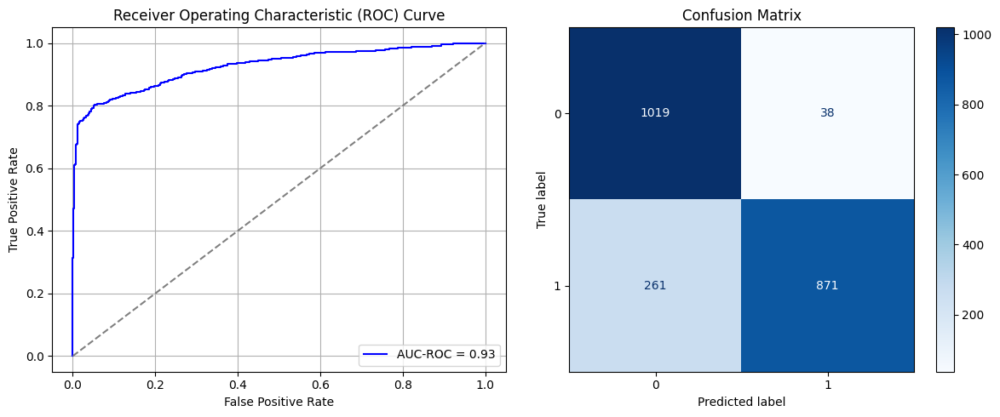

Best threshold based on F1-score: 0.4184953272342682
Time elapsed (performance): 16.359269809000125


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_164"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1148 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1149 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1150 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1154 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6845 - loss: 0.7930 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7250 - loss: 0.6377 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7296 - loss: 0.6139 - val_AUC: 0.0000e+00 - val_loss: 0.8683
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7331 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7413 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7225 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7247 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7395 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.9308
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_165"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1155 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1156 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1157 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1161 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7109 - loss: 0.7627 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6866 - loss: 0.6616 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7168 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7070 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6964 - loss: 0.6212 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7272 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7366 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7376 - loss: 0.5892 - val_AUC: 0.0000e+00 - val_loss: 0.9231
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_166"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1162 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1163 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1164 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1168 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7216 - loss: 0.7675 - val_AUC: 0.0000e+00 - val_loss: 0.9658
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7096 - loss: 0.6628 - val_AUC: 0.0000e+00 - val_loss: 0.8234
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7150 - loss: 0.6319 - val_AUC: 0.0000e+00 - val_loss: 0.8521
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7365 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6967 - loss: 0.6198 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7132 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8732
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7319 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7138 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_167"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1169 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1170 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1171 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1175 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7139 - loss: 0.7361 - val_AUC: 0.0000e+00 - val_loss: 1.0005
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7435 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7154 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7275 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8781
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7475 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.9165
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7276 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7345 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7118 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8651
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_168"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1176 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1177 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1178 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1182 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7055 - loss: 0.8036 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7268 - loss: 0.6312 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7254 - loss: 0.6264 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7343 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9009
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7496 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6915 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7258 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7280 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_169"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1183 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1184 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1185 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1189 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7249 - loss: 0.7522 - val_AUC: 0.0000e+00 - val_loss: 0.9445
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7089 - loss: 0.6597 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7090 - loss: 0.6404 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7276 - loss: 0.6044 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7210 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6960 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.8928
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7269 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7369 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_170"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1190 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1191 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1192 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1196 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7222 - loss: 0.7756 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7053 - loss: 0.6621 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7038 - loss: 0.6168 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7240 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7172 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8568
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7273 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8592
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7215 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_171"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1197 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1198 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1199 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1203 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7123 - loss: 0.7930 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7217 - loss: 0.6244 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7257 - loss: 0.6254 - val_AUC: 0.0000e+00 - val_loss: 0.8674
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7113 - loss: 0.5965 - val_AUC: 0.0000e+00 - val_loss: 0.8390
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7449 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7226 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7324 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7139 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9141
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_172"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1204 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1205 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1206 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1210 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.7094 - loss: 0.7539 - val_AUC: 0.0000e+00 - val_loss: 0.9122
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7270 - loss: 0.6271 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7132 - loss: 0.6186 - val_AUC: 0.0000e+00 - val_loss: 0.8392
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7311 - loss: 0.5972 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7239 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7148 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7479 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7301 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_173"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1211 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1212 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1213 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1217 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7264 - loss: 0.7301 - val_AUC: 0.0000e+00 - val_loss: 0.9529
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7314 - loss: 0.6445 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7138 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7292 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7280 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7255 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9058
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7206 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_174"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1218 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1219 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1220 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1224 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6960 - loss: 0.7627 - val_AUC: 0.0000e+00 - val_loss: 1.0071
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6905 - loss: 0.6583 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7096 - loss: 0.6254 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8891
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7329 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8196
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6985 - loss: 0.6056 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7463 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9294
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7116 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_175"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1225 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1226 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1227 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1231 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7074 - loss: 0.7806 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7282 - loss: 0.6161 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7461 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.8325
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7468 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8424
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7249 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7094 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7129 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7434 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_176"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1232 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1233 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1234 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1238 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7063 - loss: 0.8168 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7281 - loss: 0.6411 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7158 - loss: 0.6240 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7068 - loss: 0.6042 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7048 - loss: 0.6116 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7034 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8312
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7051 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7492 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_177"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1239 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1240 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1241 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1245 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - AUC: 0.7150 - loss: 0.7990 - val_AUC: 0.0000e+00 - val_loss: 0.9509
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.6515 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7124 - loss: 0.6347 - val_AUC: 0.0000e+00 - val_loss: 0.8933
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7200 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.6034 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7358 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7028 - loss: 0.6001 - val_AUC: 0.0000e+00 - val_loss: 0.8389
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7189 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_178"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1246 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1247 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1248 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1252 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7242 - loss: 0.7598 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7252 - loss: 0.6339 - val_AUC: 0.0000e+00 - val_loss: 0.8699
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7378 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7154 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7310 - loss: 0.5782 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7124 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7217 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7349 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_179"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1253 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1254 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1255 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1259 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7292 - loss: 0.7796 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7168 - loss: 0.6619 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7216 - loss: 0.6131 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7332 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7177 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7297 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7213 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.9490
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7167 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_180"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1260 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1261 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1262 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1266 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - AUC: 0.7064 - loss: 0.7885 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7245 - loss: 0.6228 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7373 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7238 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7393 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7148 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7128 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7327 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_181"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1267 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1268 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1269 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1273 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7232 - loss: 0.7754 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7164 - loss: 0.6466 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7304 - loss: 0.6231 - val_AUC: 0.0000e+00 - val_loss: 0.8457
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7235 - loss: 0.6169 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7337 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7374 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7333 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7203 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_182"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1274 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1275 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1276 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1280 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.6934 - loss: 0.8586 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7039 - loss: 0.6628 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7320 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8451
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7344 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9456
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7125 - loss: 0.5947 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7296 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7370 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7370 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8508
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_183"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1281 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1282 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1283 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1287 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7176 - loss: 0.7463 - val_AUC: 0.0000e+00 - val_loss: 0.9521
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7267 - loss: 0.6356 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7508 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7297 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7373 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7155 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7287 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_184"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1288 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1289 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1290 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1294 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - AUC: 0.7077 - loss: 0.6149 - val_AUC: 0.8785 - val_loss: 0.4040
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.8888 - loss: 0.3740 - val_AUC: 0.8998 - val_loss: 0.3492
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.9002 - loss: 0.3440 - val_AUC: 0.8758 - val_loss: 0.3907
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9109 - loss: 0.3294 - val_AUC: 0.9096 - val_loss: 0.3382
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9123 - loss: 0.3191 - val_AUC: 0.9161 - val_loss: 0.3330
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9232 - loss: 0.3045 - val_AUC: 0.9158 - val_loss: 0.3324
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9180 - loss: 0.3139 - val_AUC: 0.9142 - val_loss: 0.3270
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9237 - loss: 0.3038 - val_AUC: 0.9148 - val_loss: 0.3472
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

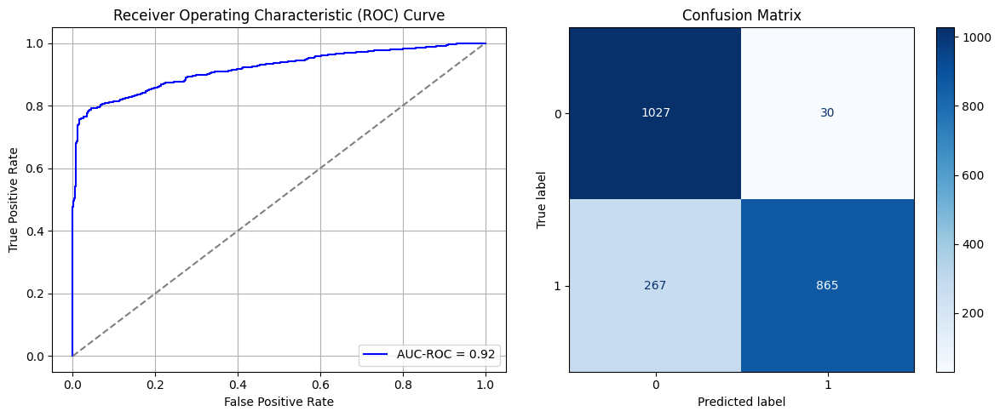

Best threshold based on F1-score: 0.41302138566970825
Time elapsed (performance): 16.96607833600001


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1295 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1296 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1297 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1301 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - AUC: 0.7182 - loss: 0.7612 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6970 - loss: 0.6292 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7303 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.9274
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7231 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7290 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6988 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9061
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7134 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7125 - l

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_186"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1302 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1303 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1304 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1308 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6866 - loss: 0.7782 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7003 - loss: 0.6442 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6916 - loss: 0.6166 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7031 - loss: 0.6091 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7289 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6928 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7139 - loss: 0.6003 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7147 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_187"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1309 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1310 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1311 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1315 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.6717 - loss: 0.8322 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7076 - loss: 0.6290 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7231 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7146 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7266 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7033 - loss: 0.6135 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7222 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7269 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_188"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1316 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1317 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1318 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1322 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7210 - loss: 0.7482 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7220 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9393
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7166 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7416 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7072 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6899 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.8885
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7077 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6946 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_189"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1323 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1324 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1325 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1329 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.7081 - loss: 0.7795 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6915 - loss: 0.6592 - val_AUC: 0.0000e+00 - val_loss: 0.9058
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7110 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7080 - loss: 0.6111 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7105 - loss: 0.5992 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7140 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7180 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7096 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_190"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1330 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1331 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1332 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1336 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7022 - loss: 0.7715 - val_AUC: 0.0000e+00 - val_loss: 0.8659
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7018 - loss: 0.6280 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7082 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9006
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6919 - loss: 0.6140 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7136 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7405 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9055
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7274 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_191"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1337 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1338 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1339 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1343 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7137 - loss: 0.7954 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6938 - loss: 0.6468 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6873 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.9109
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7269 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7146 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7031 - loss: 0.6047 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7101 - loss: 0.5979 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7149 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_192"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1344 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1345 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1346 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1350 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6890 - loss: 0.8172 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6804 - loss: 0.6525 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6891 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6870 - loss: 0.6133 - val_AUC: 0.0000e+00 - val_loss: 0.8874
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7140 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.9014
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7212 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7080 - loss: 0.6010 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.5678 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_193"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1351 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1352 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1353 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1357 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7079 - loss: 0.7532 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7196 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6933 - loss: 0.6072 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7265 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7093 - loss: 0.6024 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7042 - loss: 0.6025 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7261 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7291 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_194"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1358 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1359 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1360 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1364 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6900 - loss: 0.8046 - val_AUC: 0.0000e+00 - val_loss: 0.8617
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7223 - loss: 0.6157 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6893 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7189 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7225 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7155 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7242 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7251 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_195"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1365 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1366 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1367 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1371 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - AUC: 0.7125 - loss: 0.7813 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.6729 - loss: 0.6607 - val_AUC: 0.0000e+00 - val_loss: 0.9269
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7114 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7230 - loss: 0.5917 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7399 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7047 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7327 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6851 - loss: 0.6196 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/ste

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_196"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1372 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1373 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1374 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1375 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1376 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1377 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1378 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6961 - loss: 0.7868 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7176 - loss: 0.6081 - val_AUC: 0.0000e+00 - val_loss: 0.9079
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7280 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7077 - loss: 0.6038 - val_AUC: 0.0000e+00 - val_loss: 0.9027
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6977 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7138 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7114 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7200 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_197"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1379 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1380 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1381 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1382 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1383 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1384 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1385 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7229 - loss: 0.7196 - val_AUC: 0.0000e+00 - val_loss: 0.9063
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7216 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7022 - loss: 0.6063 - val_AUC: 0.0000e+00 - val_loss: 0.9204
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7210 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7231 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6940 - loss: 0.6089 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7111 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7228 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_198"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1386 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1387 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1388 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1389 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1390 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1391 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1392 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6912 - loss: 0.7741 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6944 - loss: 0.6547 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6967 - loss: 0.6035 - val_AUC: 0.0000e+00 - val_loss: 0.9117
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7353 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7181 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7098 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7236 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7110 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_199"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1393 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1394 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1395 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1396 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1397 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1398 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1399 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6893 - loss: 0.7794 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7054 - loss: 0.6225 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7138 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.9083
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6824 - loss: 0.6093 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6995 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7359 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7158 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7198 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/ste

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_200"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1400 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1401 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1402 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1403 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1404 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1405 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1406 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6720 - loss: 0.8010 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7206 - loss: 0.6217 - val_AUC: 0.0000e+00 - val_loss: 0.9226
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6972 - loss: 0.6200 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7189 - loss: 0.5941 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7292 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7106 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.7066 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7320 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_201"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1407 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1408 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1409 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1410 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1411 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1412 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1413 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6892 - loss: 0.8055 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6975 - loss: 0.6305 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7101 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6833 - loss: 0.6178 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7259 - loss: 0.5667 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7179 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7049 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7055 - loss: 0.5933 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_202"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1414 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1415 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1416 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1417 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1418 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1419 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1420 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7166 - loss: 0.7639 - val_AUC: 0.0000e+00 - val_loss: 0.8995
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7218 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6963 - loss: 0.6095 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7103 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8880
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7041 - loss: 0.6153 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7128 - loss: 0.5944 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - AUC: 0.6973 - loss: 0.6013 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7215 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_203"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1421 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1422 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1423 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1424 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1425 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1426 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1427 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7041 - loss: 0.8100 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6958 - loss: 0.6369 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6947 - loss: 0.6183 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7128 - loss: 0.5993 - val_AUC: 0.0000e+00 - val_loss: 0.8968
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7232 - loss: 0.5954 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7143 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8748
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7306 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9191
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7236 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_204"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1428 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1429 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1430 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1434 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - AUC: 0.7003 - loss: 0.7349 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6973 - loss: 0.6324 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7311 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7162 - loss: 0.5986 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7079 - loss: 0.5980 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7240 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6960 - loss: 0.6082 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7160 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_205"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1435 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1436 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1437 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1441 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.6667 - loss: 0.6402 - val_AUC: 0.8861 - val_loss: 0.3903
Epoch 2/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.8988 - loss: 0.3632 - val_AUC: 0.9011 - val_loss: 0.3557
Epoch 3/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9046 - loss: 0.3323 - val_AUC: 0.9116 - val_loss: 0.3336
Epoch 4/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.9155 - loss: 0.3213 - val_AUC: 0.9169 - val_loss: 0.3257
Epoch 5/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9189 - loss: 0.3187 - val_AUC: 0.9167 - val_loss: 0.3327
Epoch 6/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9216 - loss: 0.3079 - val_AUC: 0.9243 - val_loss: 0.3184
Epoch 7/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.9279 - loss: 0.3000 - val_AUC: 0.9221 - val_loss: 0.3316
Epoch 8/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9162 - loss: 0.3223 - val_AUC: 0.9173 - val_loss: 0.3407
Epoch 9/10
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

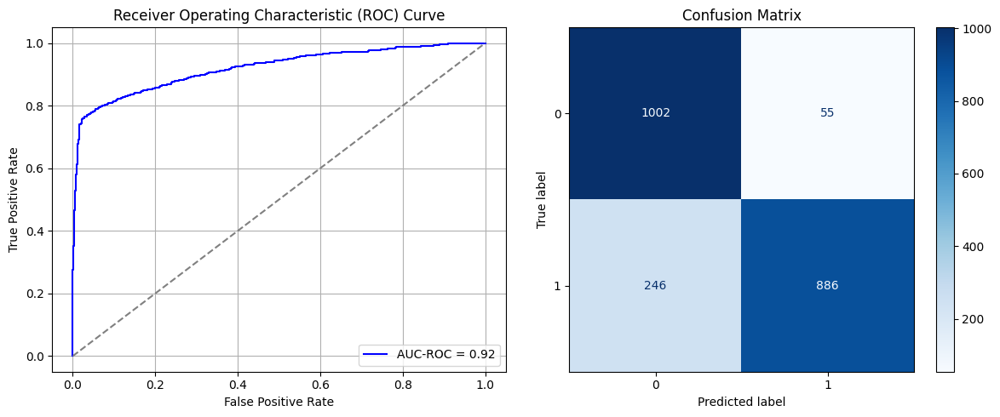

Best threshold based on F1-score: 0.43708592653274536
Time elapsed (performance): 17.615097672000047


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_206"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1442 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1443 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1444 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1448 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - AUC: 0.7039 - loss: 0.7740 - val_AUC: 0.0000e+00 - val_loss: 0.9816
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6946 - loss: 0.6653 - val_AUC: 0.0000e+00 - val_loss: 0.9326
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7145 - loss: 0.6028 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6918 - loss: 0.6207 - val_AUC: 0.0000e+00 - val_loss: 0.9611
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6857 - loss: 0.6058 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6852 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7095 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7117 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9141
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_207"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1449 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1450 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1451 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1455 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6861 - loss: 0.7991 - val_AUC: 0.0000e+00 - val_loss: 1.0150
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7187 - loss: 0.6214 - val_AUC: 0.0000e+00 - val_loss: 0.9092
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6839 - loss: 0.6096 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6974 - loss: 0.6039 - val_AUC: 0.0000e+00 - val_loss: 0.9315
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6729 - loss: 0.6175 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7021 - loss: 0.6099 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6891 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7291 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_208"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1456 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1457 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1458 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1462 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - AUC: 0.6993 - loss: 0.8134 - val_AUC: 0.0000e+00 - val_loss: 1.0021
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - AUC: 0.6813 - loss: 0.6544 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6876 - loss: 0.6234 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6839 - loss: 0.6085 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7143 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7037 - loss: 0.6110 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8559
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7158 - loss: 0.5937 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_209"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1463 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1464 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1465 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1469 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6547 - loss: 0.8638 - val_AUC: 0.0000e+00 - val_loss: 0.9533
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6790 - loss: 0.6725 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7137 - loss: 0.6079 - val_AUC: 0.0000e+00 - val_loss: 0.8743
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7090 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.9179
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7354 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6966 - loss: 0.5995 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7056 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6923 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8871
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_210"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1470 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1471 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1472 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1476 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - AUC: 0.7171 - loss: 0.7672 - val_AUC: 0.0000e+00 - val_loss: 0.9746
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7074 - loss: 0.6434 - val_AUC: 0.0000e+00 - val_loss: 0.8712
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7067 - loss: 0.6132 - val_AUC: 0.0000e+00 - val_loss: 0.8783
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6921 - loss: 0.6053 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7201 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6908 - loss: 0.6050 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7147 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8996
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7342 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8965
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_211"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1477 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1478 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1479 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1483 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.6672 - loss: 0.8913 - val_AUC: 0.0000e+00 - val_loss: 0.9762
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6808 - loss: 0.6414 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6787 - loss: 0.6269 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6973 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6975 - loss: 0.6041 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6985 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7107 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7203 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8971
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_212"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1484 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1485 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1486 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1490 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - AUC: 0.6750 - loss: 0.8657 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6936 - loss: 0.6526 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7217 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6951 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7057 - loss: 0.6080 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6805 - loss: 0.6181 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7214 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7292 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8638
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_213"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1491 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1492 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1493 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1497 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6903 - loss: 0.8592 - val_AUC: 0.0000e+00 - val_loss: 0.9630
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6720 - loss: 0.6815 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7098 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7066 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7301 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8882
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6953 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7120 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8990
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6993 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_214"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1498 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1499 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1500 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1504 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - AUC: 0.6768 - loss: 0.8623 - val_AUC: 0.0000e+00 - val_loss: 0.9970
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6971 - loss: 0.6857 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.6893 - loss: 0.6159 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7196 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7150 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7119 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6956 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.6764 - loss: 0.6138 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_215"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1505 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1506 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1507 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1511 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - AUC: 0.7093 - loss: 0.7991 - val_AUC: 0.0000e+00 - val_loss: 1.0020
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.6847 - loss: 0.6705 - val_AUC: 0.0000e+00 - val_loss: 0.8713
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7147 - loss: 0.6036 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7007 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.9187
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - AUC: 0.7163 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7352 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6904 - loss: 0.6012 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_216"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1512 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1513 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1514 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1518 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.7231 - loss: 0.6940 - val_AUC: 0.0000e+00 - val_loss: 1.0240
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7067 - loss: 0.6313 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6960 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7003 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7230 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8919
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7043 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7002 - loss: 0.6019 - val_AUC: 0.0000e+00 - val_loss: 0.8985
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7134 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_217"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1519 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1520 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1521 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1525 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - AUC: 0.7122 - loss: 0.7635 - val_AUC: 0.0000e+00 - val_loss: 0.9778
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7076 - loss: 0.6336 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7121 - loss: 0.6189 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7292 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7221 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7177 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6962 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7078 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_218"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1526 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1527 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1528 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1532 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.7039 - loss: 0.8056 - val_AUC: 0.0000e+00 - val_loss: 0.9966
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7030 - loss: 0.6288 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7094 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7066 - loss: 0.6040 - val_AUC: 0.0000e+00 - val_loss: 0.9176
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6883 - loss: 0.6057 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7032 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8992
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6872 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7152 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.8953
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_219"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1533 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1534 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1535 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1539 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6978 - loss: 0.7359 - val_AUC: 0.0000e+00 - val_loss: 1.0266
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7078 - loss: 0.6353 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7165 - loss: 0.5975 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7110 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7156 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7011 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7064 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6895 - loss: 0.6033 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_220"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1540 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1541 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1542 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1546 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6483 - loss: 0.8735 - val_AUC: 0.0000e+00 - val_loss: 0.9526
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6731 - loss: 0.6994 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6940 - loss: 0.6241 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7041 - loss: 0.6011 - val_AUC: 0.0000e+00 - val_loss: 0.9147
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7161 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8849
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6939 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7108 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6892 - loss: 0.6073 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_221"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1547 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1548 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1549 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1553 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6865 - loss: 0.8595 - val_AUC: 0.0000e+00 - val_loss: 0.9730
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6896 - loss: 0.6714 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6925 - loss: 0.6185 - val_AUC: 0.0000e+00 - val_loss: 0.8994
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6996 - loss: 0.6158 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7063 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7074 - loss: 0.6134 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7123 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6956 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_222"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1554 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1555 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1556 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1560 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6914 - loss: 0.8065 - val_AUC: 0.0000e+00 - val_loss: 0.9741
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6824 - loss: 0.6623 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7014 - loss: 0.6247 - val_AUC: 0.0000e+00 - val_loss: 0.9447
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7074 - loss: 0.6048 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7113 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6941 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.8747
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7282 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7257 - loss: 0.5684 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_223"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1561 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1562 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1563 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1567 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - AUC: 0.6862 - loss: 0.8793 - val_AUC: 0.0000e+00 - val_loss: 0.9780
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6947 - loss: 0.6499 - val_AUC: 0.0000e+00 - val_loss: 0.9202
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7005 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7130 - loss: 0.6018 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.7082 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.9014
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7126 - loss: 0.6000 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6951 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.6852 - loss: 0.6102 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1568 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1569 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1570 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1574 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6883 - loss: 0.8000 - val_AUC: 0.0000e+00 - val_loss: 0.9822
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6747 - loss: 0.6805 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6953 - loss: 0.6145 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7091 - loss: 0.5951 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.6973 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - AUC: 0.6995 - loss: 0.6020 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - AUC: 0.7122 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - AUC: 0.7079 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_225"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1575 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1576 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1577 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1581 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - AUC: 0.6916 - loss: 0.8684 - val_AUC: 0.0000e+00 - val_loss: 0.9602
Epoch 2/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - AUC: 0.7007 - loss: 0.6538 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 3/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6930 - loss: 0.6218 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 4/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 5/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - AUC: 0.7154 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 6/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - AUC: 0.7126 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8969
Epoch 7/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7244 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 8/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7007 - loss: 0.6015 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 9/10
48/48 ━━━━━━━━━━━━━━━━━━━━ 0

In [47]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [48]:
print(ParamFit)
ParamFit.to_csv('Sy_multi_Fine_Tuning.csv')

         FPR       FNR
0   0.147100  0.546256
1   0.141443  0.559471
2   0.127298  0.590308
3   0.144272  0.546256
4   0.132956  0.585903
..       ...       ...
95  0.140028  0.568282
96  0.144272  0.568282
97  0.144272  0.559471
98  0.141443  0.568282
99  0.141443  0.568282

[100 rows x 2 columns]


In [49]:
ParamFit['FNR'].mean()

np.float64(0.5656828193832598)

# Random Oversampling (ROS):

## Simple Random Sampling with Replacement:

In this case, we investigate the effectiveness of Random Oversampling methods, beginning with Simple Random Sampling (SRS) with replacement. For this, we perform random resampling from the minority class of size $N_1$ to generate an additional sample of size $N_0-N_1$, such that the oversampled minority class will have the same size as the majority class.

In [50]:
X_S_SRS, y_S_SRS = SRSwR_oversampler(data_S_full, data_S_full.iloc[:, -1])
print(y_S_SRS)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_SRS, y_S_SRS, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_SRS, y_T_train_SRS = SRSwR_oversampler(T_train, T_train.iloc[:, -1])
print(y_T_train_Sy)

5472
16799
1        0
2        0
3        0
4        0
5        0
        ..
905      1
10066    1
4043     1
203      1
1036     1
Name: Y2, Length: 33598, dtype: int64
958
2777
3394    0
809     0
3071    0
4527    0
3539    0
       ..
1871    1
1701    1
2897    1
2599    1
2607    1
Name: Y, Length: 1908, dtype: int64


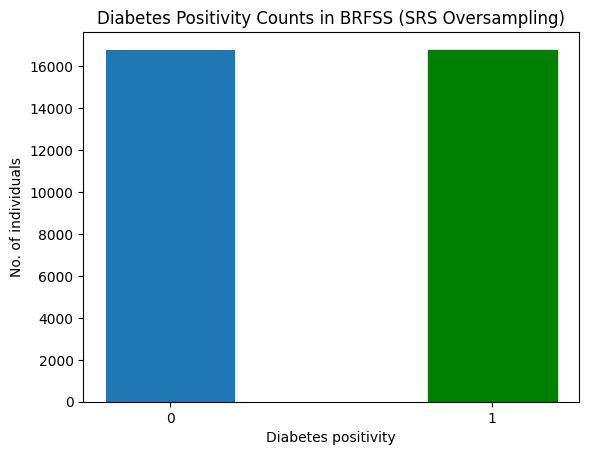

In [51]:
barlist = plt.bar([str(0),str(1)], y_S_SRS.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (SRS Oversampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_234"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1638 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1639 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1640 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1644 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.7969 - loss: 0.5162 - val_AUC: 0.9120 - val_loss: 0.3336
Epoch 2/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9196 - loss: 0.3126 - val_AUC: 0.9204 - val_loss: 0.3219
Epoch 3/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9186 - loss: 0.3167 - val_AUC: 0.9248 - val_loss: 0.3117
Epoch 4/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9217 - loss: 0.3090 - val_AUC: 0.9293 - val_loss: 0.3049
Epoch 5/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9228 - loss: 0.3130 - val_AUC: 0.9293 - val_loss: 0.3049
Epoch 6/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9304 - loss: 0.2959 - val_AUC: 0.9286 - val_loss: 0.3083
Epoch 7/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9259 - loss: 0.3062 - val_AUC: 0.9332 - val_loss: 0.2974
Epoch 8/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9315 - loss: 0.2981 - val_AUC: 0.9304 - val_loss: 0.3073
Epoch 9/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - 

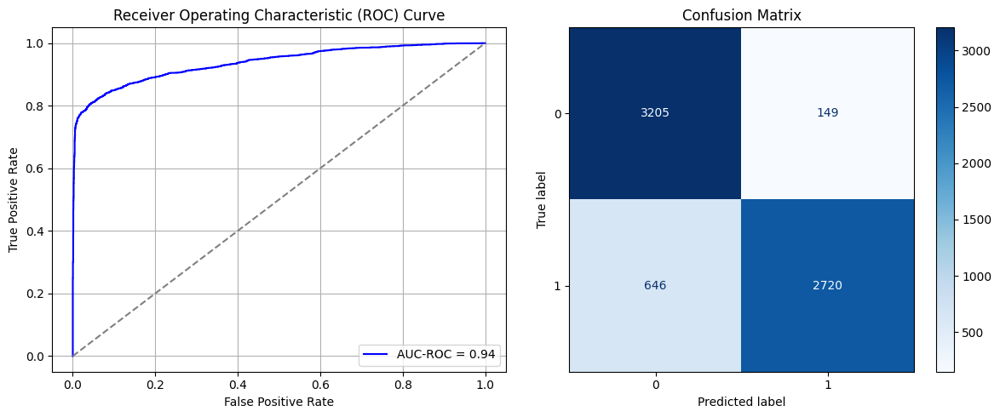

Best threshold based on F1-score: 0.4084533154964447
Time elapsed (performance): 26.24172625300025


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_235"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1645 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1646 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1647 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1651 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7185 - loss: 0.8608 - val_AUC: 0.0000e+00 - val_loss: 0.8918
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.9633
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7349 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7125 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8336
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7281 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9488
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_236"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1652 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1653 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1654 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1658 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7037 - loss: 0.8911 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7122 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9548
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7227 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7276 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9032
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7358 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7205 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9262
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7292 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.7960
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7260 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9342
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_237"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1659 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1660 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1661 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1665 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7039 - loss: 0.8648 - val_AUC: 0.0000e+00 - val_loss: 0.9276
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7113 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9143
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7273 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9234
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7212 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 1.0053
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7356 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8398
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7232 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7253 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7265 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_238"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1666 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1667 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1668 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1672 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7207 - loss: 0.8200 - val_AUC: 0.0000e+00 - val_loss: 0.9456
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8642
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7137 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7276 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7297 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9388
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7325 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.9387
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7170 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7220 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_239"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1673 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1674 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1675 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1679 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7183 - loss: 0.8692 - val_AUC: 0.0000e+00 - val_loss: 0.9615
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7122 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9392
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7178 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7263 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7196 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 1.0093
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7240 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7285 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7338 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8509
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_240"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1680 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1681 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1682 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1686 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7029 - loss: 0.8722 - val_AUC: 0.0000e+00 - val_loss: 0.9756
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7207 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7215 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9969
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7232 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.9175
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7189 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.9228
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7188 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7274 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_241"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1687 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1688 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1689 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1693 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - AUC: 0.6949 - loss: 0.8872 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7159 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.9000
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7157 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8986
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7154 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7305 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7365 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8004
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7199 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9162
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7288 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.9475
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_242"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1694 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1695 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1696 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1700 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7003 - loss: 0.8893 - val_AUC: 0.0000e+00 - val_loss: 0.8920
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7088 - loss: 0.5948 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7225 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9945
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7247 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7266 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7310 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_243"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1701 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1702 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1703 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1707 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7109 - loss: 0.8730 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7263 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7237 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7095 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7276 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9654
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7236 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7382 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8750
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7342 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_244"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1708 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1709 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1710 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1714 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7074 - loss: 0.9039 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7168 - loss: 0.5938 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7180 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9715
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7104 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9282
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7233 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7158 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7260 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7256 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_245"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1715 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1716 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1717 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1721 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7017 - loss: 0.8566 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7008 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8758
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7412 - loss: 0.5642 - val_AUC: 0.0000e+00 - val_loss: 0.9175
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7045 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7335 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7385 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.9919
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_246"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1722 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1723 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1724 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1728 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7163 - loss: 0.8064 - val_AUC: 0.0000e+00 - val_loss: 0.9830
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7230 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7352 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7302 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9569
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7317 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7299 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7224 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8470
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7155 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_247"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1729 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1730 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1731 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1735 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7083 - loss: 0.8864 - val_AUC: 0.0000e+00 - val_loss: 0.9409
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7281 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9943
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7143 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7068 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9517
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7200 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9090
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7240 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7285 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_248"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1736 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1737 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1738 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1742 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7096 - loss: 0.8413 - val_AUC: 0.0000e+00 - val_loss: 0.9332
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7079 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9782
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7282 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7212 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.8206
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7205 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7333 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7268 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.9513
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_249"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1743 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1744 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1745 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1749 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7153 - loss: 0.8205 - val_AUC: 0.0000e+00 - val_loss: 0.9439
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7100 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 1.0102
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7316 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8550
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7276 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9483
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7155 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7395 - loss: 0.5658 - val_AUC: 0.0000e+00 - val_loss: 0.9306
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_250"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1750 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1751 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1752 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1756 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7036 - loss: 0.8709 - val_AUC: 0.0000e+00 - val_loss: 0.9616
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7095 - loss: 0.5950 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7120 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7339 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7301 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9639
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7308 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8453
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7253 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_251"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1757 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1758 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1759 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1763 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 6s 9ms/step - AUC: 0.7101 - loss: 0.7811 - val_AUC: 0.0000e+00 - val_loss: 1.0666
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7094 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7337 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7112 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9528
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7385 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7250 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7078 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.9994
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_252"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1764 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1765 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1766 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1770 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7213 - loss: 0.8272 - val_AUC: 0.0000e+00 - val_loss: 1.1086
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7218 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7317 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9329
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7208 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9487
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7139 - loss: 0.5919 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7231 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 1.0233
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7311 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.9127
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7429 - loss: 0.5682 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_253"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1771 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1772 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1773 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1777 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6986 - loss: 0.8832 - val_AUC: 0.0000e+00 - val_loss: 0.8602
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7141 - loss: 0.5987 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7363 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7177 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7229 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7205 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8243
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7340 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_254"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1778 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1779 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1780 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1784 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7039 - loss: 0.8641 - val_AUC: 0.0000e+00 - val_loss: 0.9617
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7245 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7319 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7308 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9593
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7235 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7260 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7271 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_255"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1785 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1786 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1787 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1791 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8164 - loss: 0.4900 - val_AUC: 0.9082 - val_loss: 0.4009
Epoch 2/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9173 - loss: 0.3263 - val_AUC: 0.9257 - val_loss: 0.3118
Epoch 3/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9220 - loss: 0.3113 - val_AUC: 0.9226 - val_loss: 0.3246
Epoch 4/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9269 - loss: 0.3039 - val_AUC: 0.9270 - val_loss: 0.3078
Epoch 5/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9264 - loss: 0.3071 - val_AUC: 0.9281 - val_loss: 0.3062
Epoch 6/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9248 - loss: 0.3089 - val_AUC: 0.9291 - val_loss: 0.3027
Epoch 7/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9286 - loss: 0.3012 - val_AUC: 0.9320 - val_loss: 0.3055
Epoch 8/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9275 - loss: 0.3024 - val_AUC: 0.9317 - val_loss: 0.2981
Epoch 9/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

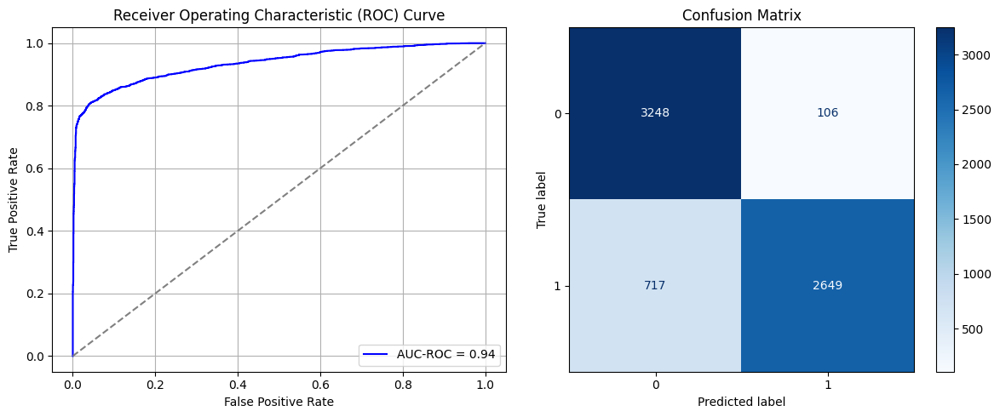

Best threshold based on F1-score: 0.3580484986305237
Time elapsed (performance): 34.44688861800023


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_256"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1792 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1793 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1794 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1798 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7088 - loss: 0.7888 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7060 - loss: 0.5949 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7218 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9174
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7180 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9277
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7316 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7239 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7328 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8815
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7272 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_257"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1799 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1800 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1801 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1805 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7133 - loss: 0.7789 - val_AUC: 0.0000e+00 - val_loss: 0.9180
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7136 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7363 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7198 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7192 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7319 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7274 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_258"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1806 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1807 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1808 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1812 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7110 - loss: 0.8047 - val_AUC: 0.0000e+00 - val_loss: 0.9100
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7156 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9319
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7209 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7320 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7241 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7327 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7118 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9479
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_259"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1813 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1814 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1815 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1819 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7100 - loss: 0.8249 - val_AUC: 0.0000e+00 - val_loss: 0.9816
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7097 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7309 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8956
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7210 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7157 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8949
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7218 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7442 - loss: 0.5670 - val_AUC: 0.0000e+00 - val_loss: 0.8700
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9097
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_260"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1820 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1821 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1822 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1826 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6918 - loss: 0.8353 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7157 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9314
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7173 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7220 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7121 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9397
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7341 - loss: 0.5671 - val_AUC: 0.0000e+00 - val_loss: 0.8515
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_261"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1827 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1828 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1829 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1833 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6904 - loss: 0.8104 - val_AUC: 0.0000e+00 - val_loss: 0.9175
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8921
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7207 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7136 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9203
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7175 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7268 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7288 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_262"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1834 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1835 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1836 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1840 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7037 - loss: 0.7907 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9918
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7192 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8868
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8828
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7292 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7396 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_263"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1841 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1842 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1843 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1847 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7172 - loss: 0.7930 - val_AUC: 0.0000e+00 - val_loss: 0.9433
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7228 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9375
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9478
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7262 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7201 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8726
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7219 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_264"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1848 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1849 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1850 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1854 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7196 - loss: 0.7599 - val_AUC: 0.0000e+00 - val_loss: 0.9264
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7229 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9173
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7263 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7428 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.9454
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7215 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7319 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7327 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7377 - loss: 0.5649 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_265"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1855 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1856 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1857 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1861 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7123 - loss: 0.8162 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7217 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7182 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9223
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7186 - loss: 0.5890 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7193 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7238 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8824
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7258 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_266"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1862 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1863 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1864 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1868 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6981 - loss: 0.8371 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7163 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.8819
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7170 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8826
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7242 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7150 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8820
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7388 - loss: 0.5648 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7272 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7228 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9361
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_267"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1869 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1870 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1871 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1875 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7047 - loss: 0.7989 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7238 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9457
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7354 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8979
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.9227
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7165 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.8872
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7241 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7212 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.9969
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_268"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1876 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1877 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1878 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1882 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7051 - loss: 0.7781 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7028 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9648
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7239 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7205 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8761
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7367 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.9693
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7168 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.9254
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.9363
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7309 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8926
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_269"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1883 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1884 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1885 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1889 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7208 - loss: 0.7719 - val_AUC: 0.0000e+00 - val_loss: 0.9469
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7290 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9080
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7223 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7133 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9394
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7223 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7369 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7307 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_270"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1890 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1891 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1892 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1896 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7076 - loss: 0.7928 - val_AUC: 0.0000e+00 - val_loss: 0.9573
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.9547
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7266 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7197 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7191 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7274 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8802
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7261 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.9024
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7252 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_271"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1897 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1898 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1899 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1903 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7029 - loss: 0.8140 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7073 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7237 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7177 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9682
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7119 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.8975
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7209 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9573
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7196 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9144
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7313 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_272"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1904 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1905 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1906 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1910 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7180 - loss: 0.7857 - val_AUC: 0.0000e+00 - val_loss: 0.9344
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7181 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7283 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7204 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7273 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9021
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7256 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7345 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_273"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1911 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1912 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1913 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1917 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7280 - loss: 0.7551 - val_AUC: 0.0000e+00 - val_loss: 0.9323
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7204 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7247 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7038 - loss: 0.5977 - val_AUC: 0.0000e+00 - val_loss: 0.9008
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7215 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7189 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8744
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7372 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7104 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_274"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1918 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1919 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1920 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1924 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7131 - loss: 0.7838 - val_AUC: 0.0000e+00 - val_loss: 0.8865
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7206 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7237 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.9424
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7297 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.8242
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7401 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7188 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7251 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.9223
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7250 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9647
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_275"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1925 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1926 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1927 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1931 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7140 - loss: 0.8673 - val_AUC: 0.0000e+00 - val_loss: 0.9222
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7210 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9453
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7155 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7079 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.9345
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7202 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.9497
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7167 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7104 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9489
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.9211
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_276"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1932 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1933 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1934 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1938 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8074 - loss: 0.4972 - val_AUC: 0.9180 - val_loss: 0.3242
Epoch 2/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9129 - loss: 0.3247 - val_AUC: 0.9215 - val_loss: 0.3175
Epoch 3/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9196 - loss: 0.3100 - val_AUC: 0.9282 - val_loss: 0.3220
Epoch 4/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9218 - loss: 0.3113 - val_AUC: 0.9248 - val_loss: 0.3134
Epoch 5/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9214 - loss: 0.3103 - val_AUC: 0.9312 - val_loss: 0.3038
Epoch 6/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9251 - loss: 0.3072 - val_AUC: 0.9216 - val_loss: 0.3227
Epoch 7/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9279 - loss: 0.2989 - val_AUC: 0.9296 - val_loss: 0.3045
Epoch 8/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9297 - loss: 0.2982 - val_AUC: 0.9315 - val_loss: 0.3095
Epoch 9/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - 

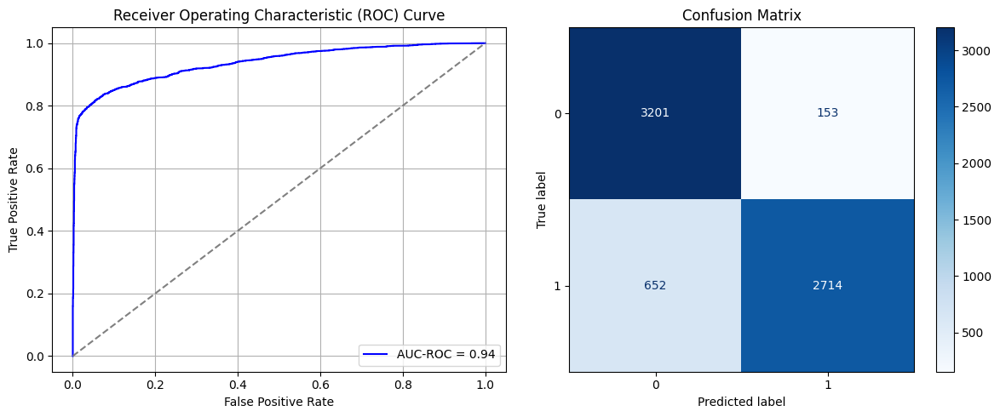

Best threshold based on F1-score: 0.42351868748664856
Time elapsed (performance): 31.116407368000182


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_277"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1939 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1940 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1941 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1945 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7179 - loss: 0.6915 - val_AUC: 0.0000e+00 - val_loss: 0.9218
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6985 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7280 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9488
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7385 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8981
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.9375
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7265 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9429
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7328 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9135
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_278"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1946 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1947 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1948 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1952 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7052 - loss: 0.7036 - val_AUC: 0.0000e+00 - val_loss: 0.9669
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7188 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7224 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7118 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7128 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9632
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7266 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8200
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_279"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1953 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1954 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1955 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1959 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7098 - loss: 0.7160 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7253 - loss: 0.5924 - val_AUC: 0.0000e+00 - val_loss: 0.9658
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7210 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9290
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7257 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7271 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7188 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8944
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7329 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8624
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7304 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_280"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1960 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1961 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1962 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1966 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7094 - loss: 0.6991 - val_AUC: 0.0000e+00 - val_loss: 0.9545
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7360 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7295 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8817
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7289 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7258 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7207 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7485 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_281"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1967 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1968 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1969 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1973 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7358 - loss: 0.6631 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7211 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7140 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9070
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7134 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9155
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7230 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7282 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7235 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_282"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1974 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1975 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1976 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1980 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7131 - loss: 0.7106 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7158 - loss: 0.5925 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7258 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9779
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7181 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7251 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7374 - loss: 0.5618 - val_AUC: 0.0000e+00 - val_loss: 0.9316
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7339 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.9062
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_283"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1981 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1982 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1983 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1987 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7189 - loss: 0.6832 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7248 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7110 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7339 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7250 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7234 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7269 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7192 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_284"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1988 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1989 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1990 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1994 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7075 - loss: 0.6789 - val_AUC: 0.0000e+00 - val_loss: 0.9472
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7245 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7050 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.8784
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7176 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7286 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7225 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 1.0021
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7177 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7219 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8681
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_285"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_1995 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1996 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1997 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2001 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7059 - loss: 0.6938 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7170 - loss: 0.5930 - val_AUC: 0.0000e+00 - val_loss: 0.8670
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7208 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.9168
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.9158
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7250 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7265 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8900
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7281 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8423
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7281 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_286"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2002 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2003 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2004 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2008 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6960 - loss: 0.7378 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7174 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7299 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9372
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7213 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9327
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7326 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7208 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9354
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_287"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2009 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2010 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2011 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2015 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7184 - loss: 0.6888 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7186 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7171 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9571
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7221 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7213 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7239 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7053 - loss: 0.5994 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8768
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_288"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2016 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2017 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2018 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2022 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7244 - loss: 0.7020 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7244 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7252 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9728
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7283 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.9114
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.9236
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7266 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7111 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_289"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2023 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2024 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2025 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2029 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7149 - loss: 0.7118 - val_AUC: 0.0000e+00 - val_loss: 0.9253
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7161 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.9010
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7170 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7118 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7273 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7317 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7254 - loss: 0.5694 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8790
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_290"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2030 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2031 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2032 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2036 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7086 - loss: 0.7134 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9031
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7091 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7131 - loss: 0.5920 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9364
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7164 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8835
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7292 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7174 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.9094
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_291"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2037 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2038 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2039 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2043 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7132 - loss: 0.7088 - val_AUC: 0.0000e+00 - val_loss: 0.9619
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7102 - loss: 0.5967 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7271 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9499
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7298 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7417 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7259 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8546
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.7965
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_292"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2044 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2045 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2046 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2050 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7335 - loss: 0.6796 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7173 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8812
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7166 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8731
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7372 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7339 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7334 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_293"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2051 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2052 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2053 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2057 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6974 - loss: 0.7138 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7166 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7296 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7252 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7205 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7407 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9260
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5664 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7307 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8844
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_294"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2058 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2059 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2060 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2064 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7182 - loss: 0.6874 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7240 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7076 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7064 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.8870
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7249 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8741
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7433 - loss: 0.5616 - val_AUC: 0.0000e+00 - val_loss: 0.8272
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7292 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_295"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2065 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2066 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2067 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2071 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7232 - loss: 0.7096 - val_AUC: 0.0000e+00 - val_loss: 0.9545
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7076 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7184 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9434
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7194 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7288 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9004
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7209 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7276 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_296"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2072 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2073 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2074 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2078 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - AUC: 0.7026 - loss: 0.7002 - val_AUC: 0.0000e+00 - val_loss: 0.9487
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.8787
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7268 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7138 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8723
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7165 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8498
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8809
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.9583
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_297"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2079 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2080 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2081 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2085 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8353 - loss: 0.4749 - val_AUC: 0.9229 - val_loss: 0.3177
Epoch 2/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9173 - loss: 0.3254 - val_AUC: 0.9241 - val_loss: 0.3149
Epoch 3/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9216 - loss: 0.3130 - val_AUC: 0.9285 - val_loss: 0.3098
Epoch 4/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9246 - loss: 0.3077 - val_AUC: 0.9226 - val_loss: 0.3447
Epoch 5/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9220 - loss: 0.3100 - val_AUC: 0.9297 - val_loss: 0.3065
Epoch 6/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9242 - loss: 0.3101 - val_AUC: 0.9296 - val_loss: 0.3134
Epoch 7/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9251 - loss: 0.3071 - val_AUC: 0.9300 - val_loss: 0.3077
Epoch 8/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9269 - loss: 0.3011 - val_AUC: 0.9296 - val_loss: 0.3032
Epoch 9/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

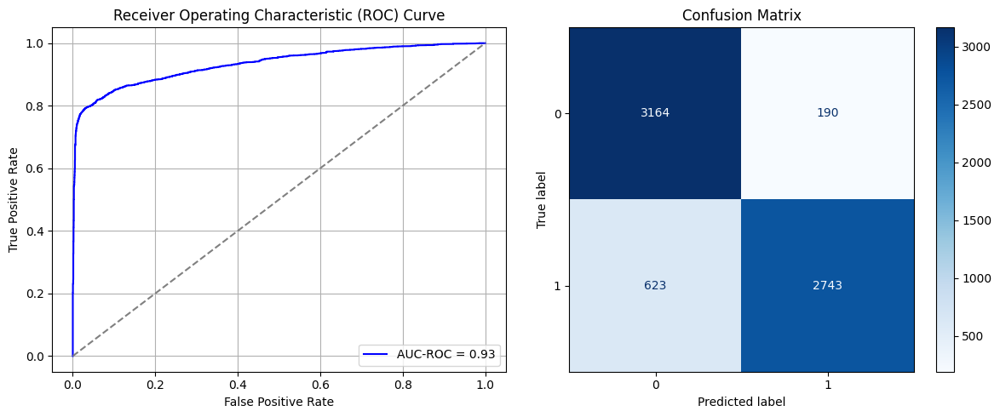

Best threshold based on F1-score: 0.4892203211784363
Time elapsed (performance): 44.85458665999977


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_298"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2086 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2087 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2088 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2092 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7042 - loss: 0.8255 - val_AUC: 0.0000e+00 - val_loss: 0.8897
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7272 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8955
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7445 - loss: 0.5635 - val_AUC: 0.0000e+00 - val_loss: 0.9581
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7335 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9390
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7354 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_299"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2093 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2094 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2095 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2099 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7234 - loss: 0.7964 - val_AUC: 0.0000e+00 - val_loss: 0.8796
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7090 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9293
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7258 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8142
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7291 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9665
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7136 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8324
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7320 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9273
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_300"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2100 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2101 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2102 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2106 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7145 - loss: 0.7662 - val_AUC: 0.0000e+00 - val_loss: 0.9339
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7096 - loss: 0.5966 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8948
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7097 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9278
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7106 - loss: 0.5845 - val_AUC: 0.0000e+00 - val_loss: 0.8941
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7157 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7246 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7322 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9330
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_301"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2107 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2108 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2109 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2113 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6981 - loss: 0.8200 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7375 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7216 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7299 - loss: 0.5767 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7246 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7312 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7338 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.9096
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_302"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2114 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2115 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2116 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2120 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7132 - loss: 0.7810 - val_AUC: 0.0000e+00 - val_loss: 0.9154
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7032 - loss: 0.5997 - val_AUC: 0.0000e+00 - val_loss: 0.9309
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7248 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7277 - loss: 0.5725 - val_AUC: 0.0000e+00 - val_loss: 0.9263
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7411 - loss: 0.5623 - val_AUC: 0.0000e+00 - val_loss: 0.8501
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_303"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2121 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2122 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2123 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2127 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7057 - loss: 0.8737 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7205 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7343 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9107
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7333 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8623
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7315 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5717 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_304"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2128 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2129 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2130 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2134 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6986 - loss: 0.8324 - val_AUC: 0.0000e+00 - val_loss: 0.9188
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7279 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8857
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7298 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9068
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9414
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7194 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8960
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9166
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_305"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2135 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2136 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2137 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2141 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6988 - loss: 0.8503 - val_AUC: 0.0000e+00 - val_loss: 0.9873
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9217
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8860
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7418 - loss: 0.5703 - val_AUC: 0.0000e+00 - val_loss: 0.9215
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7253 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9482
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7267 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_306"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2142 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2143 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2144 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2148 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6971 - loss: 0.8704 - val_AUC: 0.0000e+00 - val_loss: 0.9233
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7132 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7288 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.9518
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8886
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9450
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7311 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9125
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7341 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_307"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2149 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2150 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2151 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2155 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7053 - loss: 0.7925 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7232 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7267 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8909
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7336 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9341
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7249 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9406
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_308"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2156 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2157 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2158 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2162 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7010 - loss: 0.8412 - val_AUC: 0.0000e+00 - val_loss: 0.9945
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7174 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7194 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8361
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7205 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7378 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7358 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9026
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_309"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2163 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2164 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2165 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2166 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2167 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2168 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2169 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7015 - loss: 0.8191 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7083 - loss: 0.6004 - val_AUC: 0.0000e+00 - val_loss: 0.9647
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7145 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7310 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7269 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9468
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7177 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7267 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.7964
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7139 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8795
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_310"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2170 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2171 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2172 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2173 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2174 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2175 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2176 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7107 - loss: 0.8119 - val_AUC: 0.0000e+00 - val_loss: 0.9520
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7260 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8277
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7155 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9089
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7241 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7298 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7260 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9248
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7316 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_311"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2177 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2178 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2179 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2180 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2181 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2182 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2183 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7003 - loss: 0.8125 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8834
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7378 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.9353
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7407 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8252
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7205 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9436
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7319 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_312"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2184 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2185 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2186 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2187 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2188 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2189 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2190 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7049 - loss: 0.8615 - val_AUC: 0.0000e+00 - val_loss: 0.9053
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7116 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.9258
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7107 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8997
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8752
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8862
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7269 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_313"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2191 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2192 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2193 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2194 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2195 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2196 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2197 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7044 - loss: 0.8247 - val_AUC: 0.0000e+00 - val_loss: 0.9133
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9034
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7108 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9516
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7220 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9367
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7138 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7204 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8296
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7406 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8386
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_314"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2198 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2199 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2200 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2201 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2202 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2203 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2204 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7073 - loss: 0.7863 - val_AUC: 0.0000e+00 - val_loss: 0.9066
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7194 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7351 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8736
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7285 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8756
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7381 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8641
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7203 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9014
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7380 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8972
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7356 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9059
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_315"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2205 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2206 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2207 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2208 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2209 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2210 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2211 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6936 - loss: 0.8539 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7213 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7185 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8719
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7264 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7324 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7289 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9385
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7315 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.9023
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_316"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2212 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2213 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2214 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2215 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2216 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2217 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2218 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7010 - loss: 0.8454 - val_AUC: 0.0000e+00 - val_loss: 0.9450
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7114 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7326 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7333 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9362
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7365 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.9300
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7230 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8702
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7370 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7373 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_317"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2219 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2220 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2221 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2222 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2223 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2224 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2225 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7061 - loss: 0.8401 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7119 - loss: 0.5969 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7327 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7252 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.9813
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7425 - loss: 0.5644 - val_AUC: 0.0000e+00 - val_loss: 0.9347
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7293 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8946
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8841
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7371 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_318"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2226 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2227 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2228 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2229 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2230 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2231 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2232 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - AUC: 0.8339 - loss: 0.4750 - val_AUC: 0.9183 - val_loss: 0.3227
Epoch 2/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9122 - loss: 0.3237 - val_AUC: 0.9244 - val_loss: 0.3205
Epoch 3/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9186 - loss: 0.3214 - val_AUC: 0.9177 - val_loss: 0.3331
Epoch 4/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9210 - loss: 0.3169 - val_AUC: 0.9245 - val_loss: 0.3097
Epoch 5/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9217 - loss: 0.3154 - val_AUC: 0.9281 - val_loss: 0.3140
Epoch 6/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9236 - loss: 0.3093 - val_AUC: 0.9284 - val_loss: 0.3125
Epoch 7/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9279 - loss: 0.3027 - val_AUC: 0.9258 - val_loss: 0.3090
Epoch 8/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9303 - loss: 0.2989 - val_AUC: 0.9293 - val_loss: 0.3077
Epoch 9/10
672/672 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

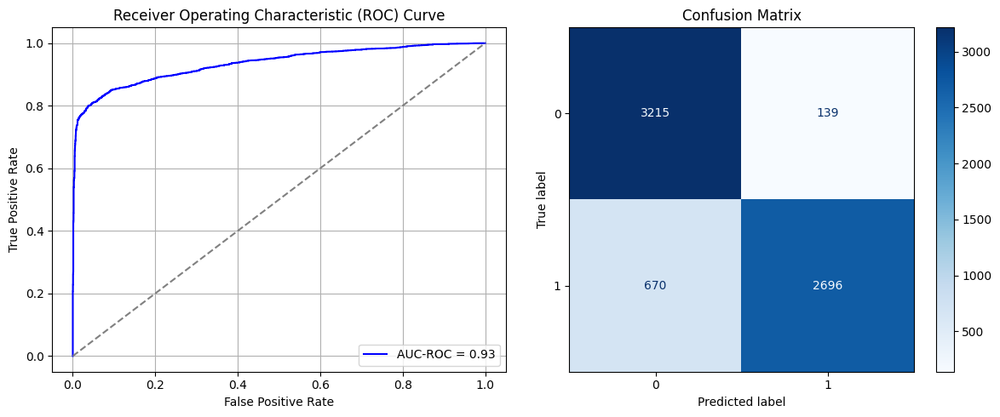

Best threshold based on F1-score: 0.3212164044380188
Time elapsed (performance): 33.54718071000025


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_319"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2233 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2234 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2235 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2236 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2237 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2238 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2239 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6926 - loss: 0.8058 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.8774
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8907
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7469 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.9797
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_320"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2240 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2241 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2242 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2243 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2244 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2245 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2246 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6996 - loss: 0.8431 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7185 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7033 - loss: 0.5956 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9209
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7194 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9555
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7201 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7293 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_321"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2247 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2248 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2249 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2250 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2251 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2252 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2253 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7188 - loss: 0.7514 - val_AUC: 0.0000e+00 - val_loss: 0.9508
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7174 - loss: 0.5928 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7463 - loss: 0.5653 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7298 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8940
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5973 - val_AUC: 0.0000e+00 - val_loss: 0.9093
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7312 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9142
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_322"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2254 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2255 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2256 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2257 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2258 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2259 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2260 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7192 - loss: 0.7577 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7308 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7255 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7306 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8959
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7331 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7194 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7359 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.9046
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7196 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_323"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2261 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2262 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2263 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2264 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2265 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2266 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2267 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7034 - loss: 0.8054 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8682
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7310 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9171
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7277 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7159 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7257 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.9556
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_324"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2268 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2269 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2270 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2271 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2272 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2273 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2274 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7076 - loss: 0.7818 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7257 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9219
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8999
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7342 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7292 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7194 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_325"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2275 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2276 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2277 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2278 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2279 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2280 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2281 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7015 - loss: 0.8104 - val_AUC: 0.0000e+00 - val_loss: 0.9365
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7233 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7253 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7216 - loss: 0.5876 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7306 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9435
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7317 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9675
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_326"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2282 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2283 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2284 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2285 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2286 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2287 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2288 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7101 - loss: 0.7671 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7222 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7249 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7369 - loss: 0.5651 - val_AUC: 0.0000e+00 - val_loss: 0.8285
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9061
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7398 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8950
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_327"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2289 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2290 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2291 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2292 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2293 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2294 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2295 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7060 - loss: 0.7908 - val_AUC: 0.0000e+00 - val_loss: 0.9336
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7193 - loss: 0.5942 - val_AUC: 0.0000e+00 - val_loss: 0.9160
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7249 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9001
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7304 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7232 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.9317
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5934 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_328"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2296 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2297 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2298 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2299 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2300 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2301 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2302 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7208 - loss: 0.7600 - val_AUC: 0.0000e+00 - val_loss: 0.9586
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7209 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9311
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 1.0113
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7341 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8829
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7280 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7258 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7320 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_329"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2303 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2304 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2305 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2306 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2307 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2308 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2309 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6911 - loss: 0.8107 - val_AUC: 0.0000e+00 - val_loss: 0.9608
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7049 - loss: 0.6030 - val_AUC: 0.0000e+00 - val_loss: 0.9480
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7221 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.8966
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7399 - loss: 0.5589 - val_AUC: 0.0000e+00 - val_loss: 0.8814
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7194 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8976
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9104
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8679
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_330"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2310 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2311 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2312 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2313 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2314 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2315 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2316 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7142 - loss: 0.7661 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7177 - loss: 0.5926 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9138
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7294 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9452
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7371 - loss: 0.5702 - val_AUC: 0.0000e+00 - val_loss: 0.8446
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7195 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9058
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7260 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8525
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8608
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_331"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2317 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2318 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2319 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2320 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2321 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2322 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2323 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7044 - loss: 0.7916 - val_AUC: 0.0000e+00 - val_loss: 0.9235
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7322 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7204 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9035
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7340 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7367 - loss: 0.5701 - val_AUC: 0.0000e+00 - val_loss: 0.9282
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7318 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.9403
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_332"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2324 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2325 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2326 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2327 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2328 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2329 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2330 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7078 - loss: 0.7852 - val_AUC: 0.0000e+00 - val_loss: 0.9689
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7249 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9614
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7248 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8727
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7403 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7277 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.9015
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7347 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8898
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7268 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.9302
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_333"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2331 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2332 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2333 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2334 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2335 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2336 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2337 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6899 - loss: 0.8387 - val_AUC: 0.0000e+00 - val_loss: 0.8901
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8504
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7212 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9873
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.5921 - val_AUC: 0.0000e+00 - val_loss: 0.9126
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.9469
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9057
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9426
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_334"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2338 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2339 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2340 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2341 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2342 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2343 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2344 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7019 - loss: 0.8022 - val_AUC: 0.0000e+00 - val_loss: 0.9216
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.5974 - val_AUC: 0.0000e+00 - val_loss: 0.9427
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.9081
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8663
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7197 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.9631
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9295
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7357 - loss: 0.5675 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.9238
Epoch 9/10
139/139 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_335"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2345 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2346 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2347 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2348 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2349 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2350 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2351 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7000 - loss: 0.8068 - val_AUC: 0.0000e+00 - val_loss: 0.9549
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5968 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9385
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7185 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7159 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.8958
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7322 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9343
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7227 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_336"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2352 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2353 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2354 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2355 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2356 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2357 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2358 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6862 - loss: 0.8201 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.5960 - val_AUC: 0.0000e+00 - val_loss: 0.9189
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7363 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8379
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8889
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.9200
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7119 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7161 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9163
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7302 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_337"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2359 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2360 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2361 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2362 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2363 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2364 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2365 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7107 - loss: 0.7676 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7151 - loss: 0.5971 - val_AUC: 0.0000e+00 - val_loss: 0.9185
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7330 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8709
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7374 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8917
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7365 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7343 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 9/10
139/139 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_338"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2366 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2367 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2368 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2369 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2370 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2371 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2372 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7011 - loss: 0.8110 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 2/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 3/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9393
Epoch 4/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7414 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 5/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 6/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7293 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 7/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7337 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9385
Epoch 8/10
139/139 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7396 - loss: 0.5660 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 9/10
139/139 ━━━━━

In [55]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_SRS_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_SRS_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_SRS, X_T_test, y_T_train_SRS, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']



In [56]:
print(ParamFit)
ParamFit.to_csv('SRS_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.120226  0.585903
1   0.131542  0.555066
2   0.125884  0.572687
3   0.121641  0.585903
4   0.127298  0.568282
..       ...       ...
95  0.132956  0.577093
96  0.121641  0.581498
97  0.120226  0.585903
98  0.113154  0.590308
99  0.127298  0.585903

[100 rows x 2 columns]


In [57]:
ParamFit['FNR'].mean()

np.float64(0.5744493392070484)

## Systematic Resampling:

In this case, we examine the possibility of performing Random Oversampling on the minority class using systematic sampling. For this purpose, taking a sampling interval of $k$, we would compile a total of $k*\frac{N_0-N_1}{N_1}$ systematic samples from the minority class in order to balance the dataset. We sample the starting point from 1 to $k$ *with replacement*, since a highly imbalanced dataset will require sampling with replacement in order to achieve a balanced dataset.

In particular, we take $k=10$ for the source data sampling, and take $k=20$ for the target training data resampling.

In [58]:
X_S_Sy, y_S_Sy = systematic_resampler(data_S_full, data_S_full.iloc[:, -1], 10)
print(y_S_Sy)

X_S_train, X_S_test, y_S_train, y_S_test = train_test_split(X_S_Sy, y_S_Sy, test_size=0.20, random_state=0)
X_T_train, X_T_test, y_T_train, y_T_test = train_test_split(data_T_X, data_T_y, test_size=0.20, random_state=0)
T_train = pd.concat([X_T_train, y_T_train], axis=1)

X_T_train_Sy, y_T_train_Sy = systematic_resampler(T_train, T_train.iloc[:, -1], 20)
print(y_T_train_Sy)

5472
16799
Nsamples= 20.699926900584796
1        0
2        0
3        0
4        0
5        0
        ..
22067    1
22098    1
22128    1
22160    1
22221    1
Name: Y2, Length: 33211, dtype: int64
958
2777
Nsamples= 37.97494780793319
751     0
4442    0
917     0
1091    0
4324    0
       ..
387     1
3204    1
4641    1
1429    1
591     1
Name: Y, Length: 5474, dtype: int64


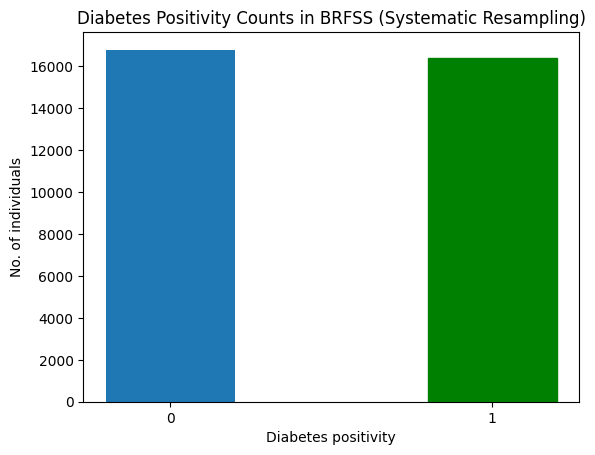

In [59]:
barlist = plt.bar([str(0),str(1)], y_S_Sy.value_counts(), width = 0.4)
barlist[1].set_color('g')

plt.xlabel("Diabetes positivity")
plt.ylabel("No. of individuals")
plt.title("Diabetes Positivity Counts in BRFSS (Systematic Resampling)")
plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_347"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2429 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2430 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2431 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2432 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2433 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2434 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2435 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - AUC: 0.8140 - loss: 0.4972 - val_AUC: 0.9174 - val_loss: 0.3226
Epoch 2/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9135 - loss: 0.3240 - val_AUC: 0.9213 - val_loss: 0.3146
Epoch 3/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9205 - loss: 0.3145 - val_AUC: 0.9268 - val_loss: 0.3090
Epoch 4/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9210 - loss: 0.3150 - val_AUC: 0.9270 - val_loss: 0.3138
Epoch 5/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9217 - loss: 0.3122 - val_AUC: 0.9263 - val_loss: 0.3176
Epoch 6/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9211 - loss: 0.3102 - val_AUC: 0.9239 - val_loss: 0.3121
Epoch 7/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9247 - loss: 0.3050 - val_AUC: 0.9241 - val_loss: 0.3114
Epoch 8/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.9256 - loss: 0.3019 - val_AUC: 0.9321 - val_loss: 0.2984
Epoch 9/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - 

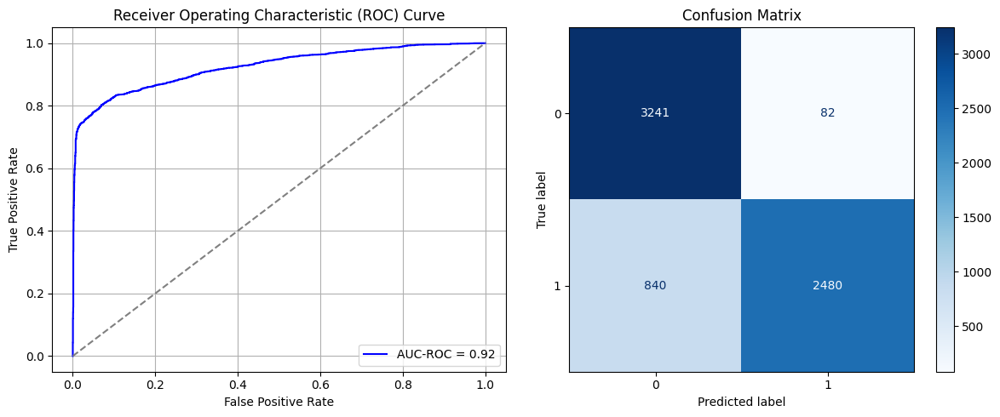

Best threshold based on F1-score: 0.33194226026535034
Time elapsed (performance): 34.48804207400008


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_348"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2436 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2437 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2438 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2439 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2440 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2441 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2442 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7046 - loss: 0.7848 - val_AUC: 0.0000e+00 - val_loss: 0.8335
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6952 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7042 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8935
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6886 - loss: 0.5998 - val_AUC: 0.0000e+00 - val_loss: 0.9181
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7062 - loss: 0.5867 - val_AUC: 0.0000e+00 - val_loss: 0.9621
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5822 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7112 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7177 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8331
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_349"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2443 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2444 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2445 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2446 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2447 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2448 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2449 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7004 - loss: 0.7911 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7102 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7066 - loss: 0.5882 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7026 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7205 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.8276
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7270 - loss: 0.5719 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7097 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_350"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2450 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2451 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2452 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2453 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2454 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2455 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2456 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7041 - loss: 0.7691 - val_AUC: 0.0000e+00 - val_loss: 0.9245
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7141 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.8980
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7049 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8808
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7092 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8931
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7363 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.9148
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7127 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.9173
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7248 - loss: 0.5718 - val_AUC: 0.0000e+00 - val_loss: 0.8728
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7154 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.8763
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_351"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2457 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2458 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2459 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2460 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2461 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2462 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2463 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7068 - loss: 0.7629 - val_AUC: 0.0000e+00 - val_loss: 0.8374
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7047 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.9114
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7046 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9049
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7031 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9190
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7204 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7065 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7325 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7061 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8487
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_352"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2464 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2465 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2466 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2467 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2468 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2469 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2470 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6998 - loss: 0.7670 - val_AUC: 0.0000e+00 - val_loss: 0.8301
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7110 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7043 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7158 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7165 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7215 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.7992
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7170 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.8621
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7165 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_353"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2471 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2472 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2473 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2474 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2475 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2476 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2477 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6991 - loss: 0.7457 - val_AUC: 0.0000e+00 - val_loss: 0.8823
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7137 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8989
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8910
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7022 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9112
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7153 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8952
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7174 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8209
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7137 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8271
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7113 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_354"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2478 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2479 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2480 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2481 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2482 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2483 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2484 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6992 - loss: 0.7739 - val_AUC: 0.0000e+00 - val_loss: 0.9208
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7062 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7043 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7230 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7155 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.9361
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9371
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7168 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.9501
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7178 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8346
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_355"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2485 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2486 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2487 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2488 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2489 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2490 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2491 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6957 - loss: 0.7770 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.5860 - val_AUC: 0.0000e+00 - val_loss: 0.8861
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7060 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7246 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.9064
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - AUC: 0.7078 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8538
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.9446
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7102 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7192 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8561
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_356"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2492 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2493 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2494 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2495 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2496 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2497 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2498 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7105 - loss: 0.7549 - val_AUC: 0.0000e+00 - val_loss: 0.8635
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7092 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8908
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6977 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7162 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.8838
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7113 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8409
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7110 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5911 - val_AUC: 0.0000e+00 - val_loss: 0.9484
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6950 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_357"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2499 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2500 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2501 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2502 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2503 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2504 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2505 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7173 - loss: 0.7568 - val_AUC: 0.0000e+00 - val_loss: 0.8735
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6990 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7142 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.8993
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7204 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7116 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7078 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7086 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8894
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7105 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9193
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_358"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2506 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2507 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2508 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2509 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2510 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2511 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2512 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7018 - loss: 0.8251 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7030 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8867
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7208 - loss: 0.5690 - val_AUC: 0.0000e+00 - val_loss: 0.8387
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7157 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8129
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7028 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.8923
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_359"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2513 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2514 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2515 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2516 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2517 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2518 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2519 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7168 - loss: 0.7515 - val_AUC: 0.0000e+00 - val_loss: 0.8421
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7050 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7090 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8440
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7145 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.9040
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7180 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6990 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7083 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8179
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_360"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2520 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2521 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2522 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2523 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2524 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2525 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2526 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7026 - loss: 0.8146 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.8717
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7129 - loss: 0.5696 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7264 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7190 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8984
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7256 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8288
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7180 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.7935
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_361"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2527 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2528 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2529 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2530 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2531 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2532 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2533 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7037 - loss: 0.7934 - val_AUC: 0.0000e+00 - val_loss: 0.8575
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7206 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7040 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7119 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8562
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7148 - loss: 0.5812 - val_AUC: 0.0000e+00 - val_loss: 0.8640
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6925 - loss: 0.5914 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7116 - loss: 0.5862 - val_AUC: 0.0000e+00 - val_loss: 0.9565
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8773
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_362"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2534 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2535 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2536 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2537 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2538 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2539 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2540 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6972 - loss: 0.7794 - val_AUC: 0.0000e+00 - val_loss: 0.9019
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - AUC: 0.7050 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8751
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7267 - loss: 0.5686 - val_AUC: 0.0000e+00 - val_loss: 0.8305
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7089 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.9477
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7043 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8922
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7159 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8249
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7062 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8804
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7108 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8848
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_363"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2541 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2542 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2543 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2544 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2545 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2546 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2547 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6938 - loss: 0.8097 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7213 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7218 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9440
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7160 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7113 - loss: 0.5828 - val_AUC: 0.0000e+00 - val_loss: 0.9078
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7155 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8233
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7272 - loss: 0.5663 - val_AUC: 0.0000e+00 - val_loss: 0.8606
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_364"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2548 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2549 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2550 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2551 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2552 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2553 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2554 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6971 - loss: 0.7881 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6983 - loss: 0.5939 - val_AUC: 0.0000e+00 - val_loss: 0.8831
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7187 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7012 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8468
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8256
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7099 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8495
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7043 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8911
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7039 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_365"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2555 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2556 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2557 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2558 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2559 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2560 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2561 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7005 - loss: 0.8089 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7164 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.9116
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7006 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8308
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7087 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8306
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7035 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.9370
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7088 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8881
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7061 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9284
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7269 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.9224
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_366"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2562 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2563 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2564 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2565 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2566 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2567 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2568 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6838 - loss: 0.8389 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8520
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7036 - loss: 0.5927 - val_AUC: 0.0000e+00 - val_loss: 0.8789
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6981 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7183 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7117 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.8970
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8720
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7124 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.9170
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_367"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2569 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2570 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2571 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2572 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2573 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2574 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2575 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7054 - loss: 0.7894 - val_AUC: 0.0000e+00 - val_loss: 0.8383
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7199 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7069 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8855
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7199 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.9213
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7148 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8963
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7174 - loss: 0.5730 - val_AUC: 0.0000e+00 - val_loss: 0.8475
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7065 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7126 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_368"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2576 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2577 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2578 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2579 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2580 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2581 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2582 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - AUC: 0.8096 - loss: 0.5031 - val_AUC: 0.9143 - val_loss: 0.3391
Epoch 2/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9169 - loss: 0.3208 - val_AUC: 0.9192 - val_loss: 0.3252
Epoch 3/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9192 - loss: 0.3163 - val_AUC: 0.9202 - val_loss: 0.3173
Epoch 4/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9170 - loss: 0.3210 - val_AUC: 0.9216 - val_loss: 0.3157
Epoch 5/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9238 - loss: 0.3067 - val_AUC: 0.9248 - val_loss: 0.3091
Epoch 6/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9204 - loss: 0.3160 - val_AUC: 0.9230 - val_loss: 0.3239
Epoch 7/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9253 - loss: 0.3040 - val_AUC: 0.9282 - val_loss: 0.3028
Epoch 8/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9259 - loss: 0.3053 - val_AUC: 0.9300 - val_loss: 0.3018
Epoch 9/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - 

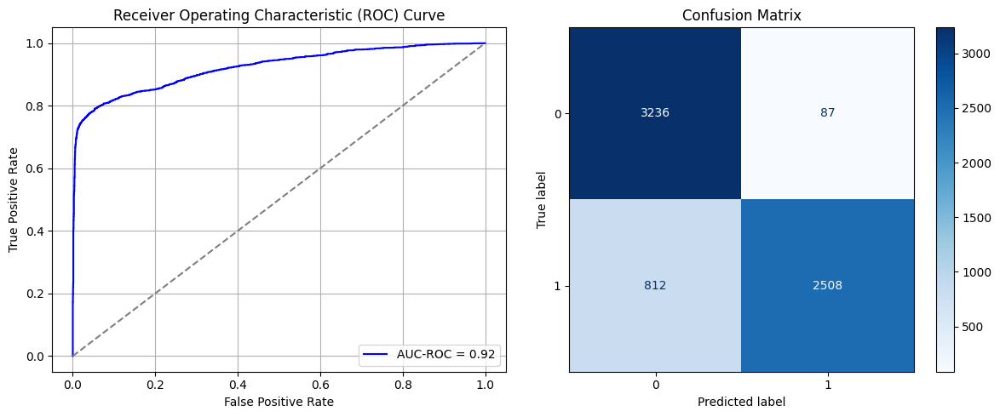

Best threshold based on F1-score: 0.36572399735450745
Time elapsed (performance): 28.84529820700027


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_369"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2583 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2584 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2585 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2586 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2587 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2588 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2589 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6945 - loss: 0.7410 - val_AUC: 0.0000e+00 - val_loss: 0.9106
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7019 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7089 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8902
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7061 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.9003
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7290 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.8315
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7187 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8695
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7226 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9236
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AU

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_370"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2590 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2591 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2592 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2593 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2594 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2595 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2596 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.6829 - loss: 0.7981 - val_AUC: 0.0000e+00 - val_loss: 0.8166
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7099 - loss: 0.6026 - val_AUC: 0.0000e+00 - val_loss: 0.8645
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7177 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.9153
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7201 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9037
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7315 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8892
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7274 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8570
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7211 - loss: 0.5761 - val_AUC: 0.0000e+00 - val_loss: 0.8370
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7138 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8572
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_371"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2597 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2598 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2599 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2600 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2601 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2602 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2603 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7013 - loss: 0.7268 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7160 - loss: 0.5955 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7182 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.9132
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7166 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7342 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7322 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7188 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7216 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9045
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_372"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2604 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2605 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2606 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2607 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2608 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2609 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2610 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6718 - loss: 0.8062 - val_AUC: 0.0000e+00 - val_loss: 0.8633
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7004 - loss: 0.6009 - val_AUC: 0.0000e+00 - val_loss: 0.8951
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7208 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7384 - loss: 0.5677 - val_AUC: 0.0000e+00 - val_loss: 0.8329
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7266 - loss: 0.5711 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7296 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8823
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7053 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8435
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_373"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2611 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2612 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2613 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2614 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2615 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2616 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2617 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6889 - loss: 0.7617 - val_AUC: 0.0000e+00 - val_loss: 0.8293
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6941 - loss: 0.6122 - val_AUC: 0.0000e+00 - val_loss: 0.8770
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6932 - loss: 0.6070 - val_AUC: 0.0000e+00 - val_loss: 0.9134
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.9663
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7210 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7150 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8419
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7022 - loss: 0.5935 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7231 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_374"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2618 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2619 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2620 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2621 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2622 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2623 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2624 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6994 - loss: 0.7502 - val_AUC: 0.0000e+00 - val_loss: 0.9048
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7122 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7142 - loss: 0.5943 - val_AUC: 0.0000e+00 - val_loss: 0.9297
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5881 - val_AUC: 0.0000e+00 - val_loss: 0.8708
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7258 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8584
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7177 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8341
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7274 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7080 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8840
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_375"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2625 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2626 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2627 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2628 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2629 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2630 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2631 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6931 - loss: 0.7550 - val_AUC: 0.0000e+00 - val_loss: 0.9113
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7005 - loss: 0.6062 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.5863 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8425
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7158 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.8161
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7232 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9378
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7110 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8622
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7154 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.9205
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_376"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2632 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2633 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2634 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2635 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2636 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2637 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2638 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6990 - loss: 0.7380 - val_AUC: 0.0000e+00 - val_loss: 0.8636
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6976 - loss: 0.6031 - val_AUC: 0.0000e+00 - val_loss: 0.8703
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7055 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9259
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7182 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.9395
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7139 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7249 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.9082
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7376 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.9425
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7299 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8942
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_377"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2639 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2640 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2641 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2642 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2643 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2644 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2645 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6617 - loss: 0.8092 - val_AUC: 0.0000e+00 - val_loss: 0.8687
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7169 - loss: 0.5983 - val_AUC: 0.0000e+00 - val_loss: 0.8610
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7034 - loss: 0.5875 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7284 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8407
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7191 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.9103
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7148 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.8888
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8706
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8564
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_378"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2646 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2647 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2648 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2649 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2650 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2651 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2652 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6828 - loss: 0.7598 - val_AUC: 0.0000e+00 - val_loss: 0.9130
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7034 - loss: 0.5990 - val_AUC: 0.0000e+00 - val_loss: 0.8455
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7184 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7243 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8937
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7239 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.9129
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7287 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7271 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8689
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7424 - loss: 0.5628 - val_AUC: 0.0000e+00 - val_loss: 0.8348
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_379"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2653 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2654 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2655 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2656 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2657 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2658 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2659 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6750 - loss: 0.7548 - val_AUC: 0.0000e+00 - val_loss: 0.9056
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7110 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7068 - loss: 0.5962 - val_AUC: 0.0000e+00 - val_loss: 0.8614
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7253 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7049 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8486
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7139 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7214 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.9811
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7123 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8445
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_380"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2660 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2661 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2662 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2663 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2664 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2665 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2666 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6962 - loss: 0.7350 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6999 - loss: 0.5963 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7197 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7165 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7204 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7305 - loss: 0.5706 - val_AUC: 0.0000e+00 - val_loss: 0.9102
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7284 - loss: 0.5598 - val_AUC: 0.0000e+00 - val_loss: 0.7916
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_381"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2667 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2668 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2669 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2670 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2671 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2672 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2673 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6755 - loss: 0.7976 - val_AUC: 0.0000e+00 - val_loss: 0.8567
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7048 - loss: 0.6023 - val_AUC: 0.0000e+00 - val_loss: 0.8513
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7171 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8565
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7216 - loss: 0.5835 - val_AUC: 0.0000e+00 - val_loss: 0.9598
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7173 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8213
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7304 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.9498
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7267 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7261 - loss: 0.5652 - val_AUC: 0.0000e+00 - val_loss: 0.8199
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_382"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2674 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2675 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2676 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2677 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2678 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2679 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2680 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6925 - loss: 0.7898 - val_AUC: 0.0000e+00 - val_loss: 0.8185
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6894 - loss: 0.6199 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7216 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8626
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7135 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9017
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7064 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8710
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7100 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7244 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8326
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7377 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8549
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_383"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2681 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2682 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2683 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2684 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2685 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2686 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2687 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6837 - loss: 0.7713 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8827
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7106 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8740
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7190 - loss: 0.5737 - val_AUC: 0.0000e+00 - val_loss: 0.8478
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7324 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7291 - loss: 0.5693 - val_AUC: 0.0000e+00 - val_loss: 0.8523
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7201 - loss: 0.5820 - val_AUC: 0.0000e+00 - val_loss: 0.9149
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_384"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2688 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2689 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2690 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2691 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2692 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2693 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2694 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6923 - loss: 0.7463 - val_AUC: 0.0000e+00 - val_loss: 0.8715
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7099 - loss: 0.5964 - val_AUC: 0.0000e+00 - val_loss: 0.8186
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7258 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8657
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7389 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7330 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8718
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7184 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.7889
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7221 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.7936
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7237 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_385"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2695 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2696 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2697 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2698 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2699 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2700 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2701 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6815 - loss: 0.7946 - val_AUC: 0.0000e+00 - val_loss: 0.8755
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7107 - loss: 0.6052 - val_AUC: 0.0000e+00 - val_loss: 0.9098
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.5871 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8429
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7327 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.8210
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7039 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7357 - loss: 0.5601 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7178 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8396
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_386"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2702 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2703 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2704 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2705 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2706 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2707 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2708 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6893 - loss: 0.7635 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6983 - loss: 0.5978 - val_AUC: 0.0000e+00 - val_loss: 0.8765
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7202 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7050 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8767
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7143 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.7890
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7143 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9076
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7157 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7197 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_387"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2709 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2710 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2711 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2712 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2713 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2714 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2715 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7007 - loss: 0.7582 - val_AUC: 0.0000e+00 - val_loss: 0.8436
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6939 - loss: 0.6146 - val_AUC: 0.0000e+00 - val_loss: 0.8548
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7030 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.8555
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7157 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8597
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7203 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.9020
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7225 - loss: 0.5852 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7367 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8344
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_388"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2716 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2717 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2718 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2719 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2720 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2721 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2722 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6913 - loss: 0.7531 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7091 - loss: 0.5999 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7293 - loss: 0.5870 - val_AUC: 0.0000e+00 - val_loss: 0.9269
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7095 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8059
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7196 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.9303
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7102 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8391
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7253 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8159
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7353 - loss: 0.5666 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_389"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2723 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2724 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2725 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2726 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2727 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2728 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2729 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8212 - loss: 0.4855 - val_AUC: 0.9163 - val_loss: 0.3263
Epoch 2/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9136 - loss: 0.3267 - val_AUC: 0.9246 - val_loss: 0.3125
Epoch 3/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9194 - loss: 0.3191 - val_AUC: 0.9272 - val_loss: 0.3077
Epoch 4/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9230 - loss: 0.3112 - val_AUC: 0.9288 - val_loss: 0.3090
Epoch 5/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - AUC: 0.9258 - loss: 0.3024 - val_AUC: 0.9263 - val_loss: 0.3098
Epoch 6/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - AUC: 0.9263 - loss: 0.3046 - val_AUC: 0.9288 - val_loss: 0.3034
Epoch 7/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - AUC: 0.9287 - loss: 0.3013 - val_AUC: 0.9317 - val_loss: 0.2983
Epoch 8/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9307 - loss: 0.2968 - val_AUC: 0.9287 - val_loss: 0.3168
Epoch 9/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - 

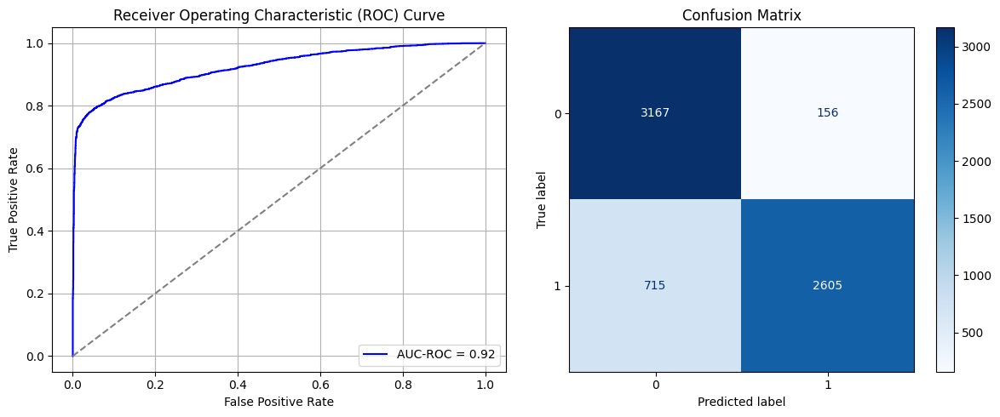

Best threshold based on F1-score: 0.42546066641807556
Time elapsed (performance): 33.65454336699986


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_390"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2730 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2731 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2732 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2733 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2734 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2735 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2736 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6895 - loss: 0.7443 - val_AUC: 0.0000e+00 - val_loss: 0.8793
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7086 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8623
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6974 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8991
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6986 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8558
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7055 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8574
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7070 - loss: 0.5800 - val_AUC: 0.0000e+00 - val_loss: 0.8397
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5773 - val_AUC: 0.0000e+00 - val_loss: 0.8967
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_391"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2737 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2738 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2739 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2740 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2741 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2742 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2743 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6866 - loss: 0.7607 - val_AUC: 0.0000e+00 - val_loss: 0.8615
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7040 - loss: 0.5932 - val_AUC: 0.0000e+00 - val_loss: 0.9232
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7045 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.9684
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7096 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7042 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7137 - loss: 0.5816 - val_AUC: 0.0000e+00 - val_loss: 0.9120
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7162 - loss: 0.5839 - val_AUC: 0.0000e+00 - val_loss: 0.9320
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7039 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8578
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_392"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2744 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2745 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2746 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2747 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2748 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2749 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2750 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6874 - loss: 0.7611 - val_AUC: 0.0000e+00 - val_loss: 0.8385
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7022 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.9111
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7157 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8680
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7076 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8716
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7094 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8460
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7036 - loss: 0.5849 - val_AUC: 0.0000e+00 - val_loss: 0.9291
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7184 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8519
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7172 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.9161
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_393"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2751 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2752 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2753 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2754 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2755 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2756 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2757 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6863 - loss: 0.7568 - val_AUC: 0.0000e+00 - val_loss: 0.8631
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7047 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8818
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7041 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.9119
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7057 - loss: 0.5709 - val_AUC: 0.0000e+00 - val_loss: 0.7972
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7195 - loss: 0.5712 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8541
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6931 - loss: 0.5989 - val_AUC: 0.0000e+00 - val_loss: 0.8729
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7120 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.9229
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_394"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2758 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2759 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2760 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2761 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2762 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2763 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2764 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.7061 - loss: 0.7070 - val_AUC: 0.0000e+00 - val_loss: 0.8821
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6966 - loss: 0.5898 - val_AUC: 0.0000e+00 - val_loss: 0.9060
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7109 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8544
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7055 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8769
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7060 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7158 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8647
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7161 - loss: 0.5720 - val_AUC: 0.0000e+00 - val_loss: 0.9065
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_395"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2765 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2766 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2767 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2768 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2769 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2770 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2771 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6956 - loss: 0.7506 - val_AUC: 0.0000e+00 - val_loss: 0.9084
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6936 - loss: 0.5893 - val_AUC: 0.0000e+00 - val_loss: 0.8722
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7043 - loss: 0.5903 - val_AUC: 0.0000e+00 - val_loss: 0.8779
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6844 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8100
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7079 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7198 - loss: 0.5747 - val_AUC: 0.0000e+00 - val_loss: 0.8530
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7154 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8620
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_396"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2772 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2773 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2774 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2775 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2776 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2777 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2778 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6871 - loss: 0.7015 - val_AUC: 0.0000e+00 - val_loss: 0.8362
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7142 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.6975 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8268
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7044 - loss: 0.5868 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7051 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7000 - loss: 0.5878 - val_AUC: 0.0000e+00 - val_loss: 0.8434
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7282 - loss: 0.5704 - val_AUC: 0.0000e+00 - val_loss: 0.8859
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7201 - loss: 0.5689 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_397"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2779 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2780 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2781 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2782 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2783 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2784 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2785 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6885 - loss: 0.7593 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6996 - loss: 0.5958 - val_AUC: 0.0000e+00 - val_loss: 0.9067
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7096 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.8665
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7033 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9227
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7122 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.8688
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7054 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8914
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7021 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.9400
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7231 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.9391
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_398"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2786 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2787 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2788 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2789 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2790 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2791 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2792 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - AUC: 0.6867 - loss: 0.7188 - val_AUC: 0.0000e+00 - val_loss: 0.9087
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6993 - loss: 0.5899 - val_AUC: 0.0000e+00 - val_loss: 0.9225
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7001 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8604
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7152 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.8634
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6998 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8117
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7114 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.8417
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - AUC: 0.7198 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9025
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7138 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_399"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2793 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2794 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2795 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2796 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2797 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2798 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2799 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6871 - loss: 0.7229 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7054 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7036 - loss: 0.5830 - val_AUC: 0.0000e+00 - val_loss: 0.8890
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7115 - loss: 0.5859 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7083 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7140 - loss: 0.5807 - val_AUC: 0.0000e+00 - val_loss: 0.8864
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7300 - loss: 0.5637 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.8566
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_400"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2800 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2801 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2802 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2803 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2804 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2805 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2806 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.6935 - loss: 0.7437 - val_AUC: 0.0000e+00 - val_loss: 0.9257
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7071 - loss: 0.5803 - val_AUC: 0.0000e+00 - val_loss: 0.8254
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7136 - loss: 0.5716 - val_AUC: 0.0000e+00 - val_loss: 0.9041
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8973
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7158 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7040 - loss: 0.5901 - val_AUC: 0.0000e+00 - val_loss: 0.8447
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7206 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9441
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.6865 - loss: 0.5953 - val_AUC: 0.0000e+00 - val_loss: 0.8846
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_401"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2807 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2808 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2809 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2810 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2811 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2812 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2813 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6968 - loss: 0.7515 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7032 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7133 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8290
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7084 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8427
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7131 - loss: 0.5819 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7029 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7146 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8782
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7071 - loss: 0.5884 - val_AUC: 0.0000e+00 - val_loss: 0.8945
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_402"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2814 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2815 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2816 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2817 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2818 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2819 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2820 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - AUC: 0.6916 - loss: 0.7298 - val_AUC: 0.0000e+00 - val_loss: 0.8492
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7208 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.7943
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7082 - loss: 0.5811 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7317 - loss: 0.5650 - val_AUC: 0.0000e+00 - val_loss: 0.8780
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6884 - loss: 0.6022 - val_AUC: 0.0000e+00 - val_loss: 0.8954
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8671
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7165 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8228
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7040 - loss: 0.5810 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_403"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2821 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2822 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2823 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2824 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2825 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2826 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2827 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7036 - loss: 0.7251 - val_AUC: 0.0000e+00 - val_loss: 0.9115
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7090 - loss: 0.5888 - val_AUC: 0.0000e+00 - val_loss: 0.8678
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7054 - loss: 0.5894 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7107 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8962
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7091 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9197
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7160 - loss: 0.5673 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7166 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8452
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7345 - loss: 0.5554 - val_AUC: 0.0000e+00 - val_loss: 0.8803
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_404"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2828 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2829 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2830 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2831 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2832 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2833 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2834 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6765 - loss: 0.7582 - val_AUC: 0.0000e+00 - val_loss: 0.8363
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6925 - loss: 0.5991 - val_AUC: 0.0000e+00 - val_loss: 0.8600
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.5681 - val_AUC: 0.0000e+00 - val_loss: 0.8137
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7148 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8672
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7143 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8887
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7108 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8224
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7214 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.9172
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7245 - loss: 0.5600 - val_AUC: 0.0000e+00 - val_loss: 0.8775
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_405"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2835 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2836 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2837 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2838 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2839 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2840 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2841 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6876 - loss: 0.7530 - val_AUC: 0.0000e+00 - val_loss: 0.8289
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6965 - loss: 0.5902 - val_AUC: 0.0000e+00 - val_loss: 0.8733
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7047 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8430
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7041 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8866
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7176 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6952 - loss: 0.5907 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7078 - loss: 0.5771 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7175 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.8431
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_406"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2842 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2843 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2844 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2845 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2846 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2847 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2848 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6875 - loss: 0.7490 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7071 - loss: 0.5758 - val_AUC: 0.0000e+00 - val_loss: 0.8978
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7030 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7036 - loss: 0.5904 - val_AUC: 0.0000e+00 - val_loss: 0.8947
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7025 - loss: 0.5905 - val_AUC: 0.0000e+00 - val_loss: 0.9348
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7248 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7095 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9146
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7140 - loss: 0.5829 - val_AUC: 0.0000e+00 - val_loss: 0.7887
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_407"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2849 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2850 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2851 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2852 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2853 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2854 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2855 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6915 - loss: 0.7686 - val_AUC: 0.0000e+00 - val_loss: 0.8656
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6951 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8442
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7094 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8964
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7153 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8778
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7127 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.8753
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7096 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8618
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.9255
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7154 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8924
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_408"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2856 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2857 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2858 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2859 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2860 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2861 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2862 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6918 - loss: 0.7305 - val_AUC: 0.0000e+00 - val_loss: 0.8646
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7080 - loss: 0.5886 - val_AUC: 0.0000e+00 - val_loss: 0.8943
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7046 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.8181
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6935 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8406
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.6990 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8934
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7029 - loss: 0.5865 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.5781 - val_AUC: 0.0000e+00 - val_loss: 0.8639
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8666
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_409"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2863 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2864 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2865 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2866 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2867 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2868 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2869 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7006 - loss: 0.7222 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6996 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8594
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.5797 - val_AUC: 0.0000e+00 - val_loss: 0.8518
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8187
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7014 - loss: 0.5922 - val_AUC: 0.0000e+00 - val_loss: 0.9169
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7119 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.9242
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.9186
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6895 - loss: 0.5945 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_410"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2870 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2871 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2872 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2873 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2874 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2875 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2876 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.8085 - loss: 0.5021 - val_AUC: 0.9197 - val_loss: 0.3218
Epoch 2/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9142 - loss: 0.3247 - val_AUC: 0.9226 - val_loss: 0.3162
Epoch 3/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - AUC: 0.9181 - loss: 0.3131 - val_AUC: 0.9248 - val_loss: 0.3092
Epoch 4/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9229 - loss: 0.3081 - val_AUC: 0.9251 - val_loss: 0.3117
Epoch 5/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9227 - loss: 0.3110 - val_AUC: 0.9250 - val_loss: 0.3066
Epoch 6/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - AUC: 0.9227 - loss: 0.3089 - val_AUC: 0.9104 - val_loss: 0.3273
Epoch 7/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - AUC: 0.9227 - loss: 0.3093 - val_AUC: 0.9267 - val_loss: 0.3083
Epoch 8/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9274 - loss: 0.3036 - val_AUC: 0.9303 - val_loss: 0.2973
Epoch 9/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - 

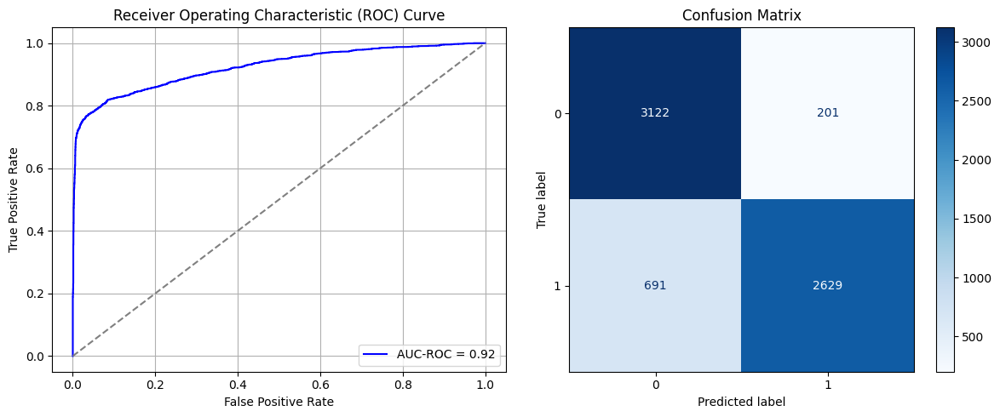

Best threshold based on F1-score: 0.44763797521591187
Time elapsed (performance): 45.06932392499948


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_411"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2877 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2878 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2879 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2880 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2881 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2882 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2883 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6967 - loss: 0.7609 - val_AUC: 0.0000e+00 - val_loss: 0.9284
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7133 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9051
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7195 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8354
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7141 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8746
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7100 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8543
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7113 - loss: 0.5923 - val_AUC: 0.0000e+00 - val_loss: 0.9594
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7097 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7169 - loss: 0.5750 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_412"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2884 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2885 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2886 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2887 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2888 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2889 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2890 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6975 - loss: 0.7263 - val_AUC: 0.0000e+00 - val_loss: 0.9091
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.9268
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6992 - loss: 0.5982 - val_AUC: 0.0000e+00 - val_loss: 0.8893
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7063 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.8697
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7266 - loss: 0.5713 - val_AUC: 0.0000e+00 - val_loss: 0.8771
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7147 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8807
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6937 - loss: 0.5858 - val_AUC: 0.0000e+00 - val_loss: 0.8438
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7107 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8545
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_413"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2891 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2892 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2893 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2894 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2895 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2896 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2897 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7083 - loss: 0.7705 - val_AUC: 0.0000e+00 - val_loss: 0.8788
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6956 - loss: 0.5961 - val_AUC: 0.0000e+00 - val_loss: 0.9016
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7247 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.9047
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7170 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7028 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8503
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7115 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8372
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7353 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.9044
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7204 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8673
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_414"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2898 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2899 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2900 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2901 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2902 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2903 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2904 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6800 - loss: 0.7886 - val_AUC: 0.0000e+00 - val_loss: 0.9071
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.5885 - val_AUC: 0.0000e+00 - val_loss: 0.8875
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7178 - loss: 0.5697 - val_AUC: 0.0000e+00 - val_loss: 0.8895
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8092
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.5844 - val_AUC: 0.0000e+00 - val_loss: 0.8825
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 - loss: 0.5707 - val_AUC: 0.0000e+00 - val_loss: 0.8588
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7129 - loss: 0.5918 - val_AUC: 0.0000e+00 - val_loss: 0.9085
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_415"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2905 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2906 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2907 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2908 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2909 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2910 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2911 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.6837 - loss: 0.7743 - val_AUC: 0.0000e+00 - val_loss: 0.8754
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.7075 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8853
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7095 - loss: 0.5848 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7332 - loss: 0.5638 - val_AUC: 0.0000e+00 - val_loss: 0.8571
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7086 - loss: 0.5827 - val_AUC: 0.0000e+00 - val_loss: 0.9018
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8707
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7098 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.9157
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7150 - loss: 0.5760 - val_AUC: 0.0000e+00 - val_loss: 0.9069
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_416"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2912 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2913 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2914 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2915 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2916 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2917 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2918 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7117 - loss: 0.7304 - val_AUC: 0.0000e+00 - val_loss: 0.8850
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7147 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7098 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.9346
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7032 - loss: 0.5915 - val_AUC: 0.0000e+00 - val_loss: 0.9290
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7190 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8601
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7151 - loss: 0.5838 - val_AUC: 0.0000e+00 - val_loss: 0.9029
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7162 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8628
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7216 - loss: 0.5687 - val_AUC: 0.0000e+00 - val_loss: 0.9002
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_417"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2919 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2920 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2921 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2922 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2923 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2924 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2925 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6882 - loss: 0.7584 - val_AUC: 0.0000e+00 - val_loss: 0.9488
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7030 - loss: 0.5823 - val_AUC: 0.0000e+00 - val_loss: 0.8810
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.8491
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.5729 - val_AUC: 0.0000e+00 - val_loss: 0.8250
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7091 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8507
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7127 - loss: 0.5780 - val_AUC: 0.0000e+00 - val_loss: 0.8465
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7096 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9292
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_418"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2926 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2927 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2928 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2929 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2930 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2931 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2932 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7066 - loss: 0.7224 - val_AUC: 0.0000e+00 - val_loss: 0.9305
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7054 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8629
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7141 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8554
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8552
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6899 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.9038
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7101 - loss: 0.5821 - val_AUC: 0.0000e+00 - val_loss: 0.8805
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7206 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8413
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_419"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2933 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2934 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2935 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2936 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2937 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2938 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2939 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.6908 - loss: 0.7718 - val_AUC: 0.0000e+00 - val_loss: 0.8905
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7084 - loss: 0.5784 - val_AUC: 0.0000e+00 - val_loss: 0.8737
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7040 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9167
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7157 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8762
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7048 - loss: 0.5756 - val_AUC: 0.0000e+00 - val_loss: 0.8265
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7134 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8691
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7035 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8847
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7034 - loss: 0.5940 - val_AUC: 0.0000e+00 - val_loss: 0.8998
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_420"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2940 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2941 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2942 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2943 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2944 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2945 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2946 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - AUC: 0.6817 - loss: 0.7618 - val_AUC: 0.0000e+00 - val_loss: 0.9431
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.6869 - loss: 0.6021 - val_AUC: 0.0000e+00 - val_loss: 0.8915
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7103 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8514
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7044 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.8833
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7089 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8632
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7003 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8471
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7036 - loss: 0.5909 - val_AUC: 0.0000e+00 - val_loss: 0.8930
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7035 - loss: 0.5959 - val_AUC: 0.0000e+00 - val_loss: 0.8974
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_421"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2947 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2948 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2949 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2950 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2951 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2952 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2953 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6864 - loss: 0.7856 - val_AUC: 0.0000e+00 - val_loss: 0.8777
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.5891 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7106 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7146 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.8798
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7238 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8611
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7178 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9105
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7015 - loss: 0.5877 - val_AUC: 0.0000e+00 - val_loss: 0.8739
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5831 - val_AUC: 0.0000e+00 - val_loss: 0.9139
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_422"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2954 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2955 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2956 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2957 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2958 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2959 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2960 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7072 - loss: 0.7441 - val_AUC: 0.0000e+00 - val_loss: 0.8932
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7144 - loss: 0.5906 - val_AUC: 0.0000e+00 - val_loss: 0.9054
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7098 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9137
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7056 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8539
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7056 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7217 - loss: 0.5708 - val_AUC: 0.0000e+00 - val_loss: 0.8456
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7103 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.8983
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7201 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.8322
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_423"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2961 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2962 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2963 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2964 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2965 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2966 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2967 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7017 - loss: 0.7387 - val_AUC: 0.0000e+00 - val_loss: 0.8832
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7069 - loss: 0.5895 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7074 - loss: 0.5786 - val_AUC: 0.0000e+00 - val_loss: 0.8714
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7261 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8927
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6930 - loss: 0.5910 - val_AUC: 0.0000e+00 - val_loss: 0.8577
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.5755 - val_AUC: 0.0000e+00 - val_loss: 0.8590
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7166 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8939
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7191 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8204
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_424"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2968 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2969 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2970 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2971 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2972 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2973 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2974 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - AUC: 0.6860 - loss: 0.7906 - val_AUC: 0.0000e+00 - val_loss: 0.8904
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6996 - loss: 0.5900 - val_AUC: 0.0000e+00 - val_loss: 0.8675
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7011 - loss: 0.5912 - val_AUC: 0.0000e+00 - val_loss: 0.8724
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7163 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8858
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7122 - loss: 0.5857 - val_AUC: 0.0000e+00 - val_loss: 0.8977
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7160 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8899
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7186 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8701
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_425"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2975 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2976 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2977 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2978 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2979 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2980 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2981 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6930 - loss: 0.7625 - val_AUC: 0.0000e+00 - val_loss: 0.9012
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7049 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8583
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7001 - loss: 0.5834 - val_AUC: 0.0000e+00 - val_loss: 0.8830
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7228 - loss: 0.5728 - val_AUC: 0.0000e+00 - val_loss: 0.8365
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6942 - loss: 0.5872 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6999 - loss: 0.5869 - val_AUC: 0.0000e+00 - val_loss: 0.8854
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7201 - loss: 0.5762 - val_AUC: 0.0000e+00 - val_loss: 0.9301
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7095 - loss: 0.5836 - val_AUC: 0.0000e+00 - val_loss: 0.9366
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_426"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2982 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2983 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2984 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2985 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2986 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2987 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2988 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6961 - loss: 0.7697 - val_AUC: 0.0000e+00 - val_loss: 0.8630
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7044 - loss: 0.5855 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5740 - val_AUC: 0.0000e+00 - val_loss: 0.9073
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7134 - loss: 0.5851 - val_AUC: 0.0000e+00 - val_loss: 0.9033
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7128 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7111 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.8240
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7094 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8730
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7210 - loss: 0.5759 - val_AUC: 0.0000e+00 - val_loss: 0.8906
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_427"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2989 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2990 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2991 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2992 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2993 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2994 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2995 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7018 - loss: 0.7476 - val_AUC: 0.0000e+00 - val_loss: 0.8822
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7183 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8813
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7178 - loss: 0.5785 - val_AUC: 0.0000e+00 - val_loss: 0.9075
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7121 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8623
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7203 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8394
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7091 - loss: 0.5837 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7135 - loss: 0.5847 - val_AUC: 0.0000e+00 - val_loss: 0.8432
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7171 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8367
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_428"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_2996 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2997 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2998 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2999 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3000 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3001 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3002 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7030 - loss: 0.7539 - val_AUC: 0.0000e+00 - val_loss: 0.9673
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7121 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8625
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7072 - loss: 0.5850 - val_AUC: 0.0000e+00 - val_loss: 0.8400
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7068 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8395
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7108 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.8836
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7235 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.8785
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7295 - loss: 0.5710 - val_AUC: 0.0000e+00 - val_loss: 0.9382
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_429"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3003 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3004 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3005 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3006 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3007 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3008 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3009 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6984 - loss: 0.7827 - val_AUC: 0.0000e+00 - val_loss: 0.9123
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7079 - loss: 0.5883 - val_AUC: 0.0000e+00 - val_loss: 0.9773
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7193 - loss: 0.5818 - val_AUC: 0.0000e+00 - val_loss: 0.9605
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7004 - loss: 0.5866 - val_AUC: 0.0000e+00 - val_loss: 0.8776
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7199 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8512
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7093 - loss: 0.5874 - val_AUC: 0.0000e+00 - val_loss: 0.9386
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7125 - loss: 0.5840 - val_AUC: 0.0000e+00 - val_loss: 0.8612
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7180 - loss: 0.5788 - val_AUC: 0.0000e+00 - val_loss: 0.8759
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_430"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3010 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3011 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3012 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3013 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3014 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3015 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3016 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6849 - loss: 0.7734 - val_AUC: 0.0000e+00 - val_loss: 0.9455
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7088 - loss: 0.5946 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7067 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8479
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9118
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.6937 - loss: 0.5916 - val_AUC: 0.0000e+00 - val_loss: 0.8696
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7216 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.8877
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5753 - val_AUC: 0.0000e+00 - val_loss: 0.8676
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7276 - loss: 0.5764 - val_AUC: 0.0000e+00 - val_loss: 0.8694
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_431"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3017 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3018 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3019 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3020 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3021 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3022 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3023 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Epoch 1/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.8091 - loss: 0.5024 - val_AUC: 0.9187 - val_loss: 0.3251
Epoch 2/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - AUC: 0.9148 - loss: 0.3252 - val_AUC: 0.9210 - val_loss: 0.3141
Epoch 3/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9208 - loss: 0.3119 - val_AUC: 0.9257 - val_loss: 0.3149
Epoch 4/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - AUC: 0.9185 - loss: 0.3140 - val_AUC: 0.9280 - val_loss: 0.3038
Epoch 5/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - AUC: 0.9220 - loss: 0.3102 - val_AUC: 0.9235 - val_loss: 0.3062
Epoch 6/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - AUC: 0.9257 - loss: 0.3044 - val_AUC: 0.9287 - val_loss: 0.3025
Epoch 7/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9290 - loss: 0.2973 - val_AUC: 0.9310 - val_loss: 0.2982
Epoch 8/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - AUC: 0.9270 - loss: 0.2969 - val_AUC: 0.9284 - val_loss: 0.2974
Epoch 9/10
665/665 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - 

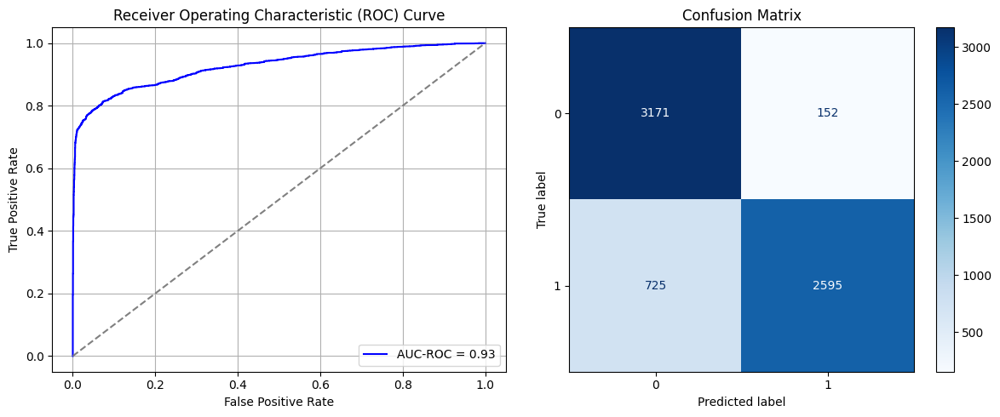

Best threshold based on F1-score: 0.40011265873908997
Time elapsed (performance): 42.55101629600085


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_432"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3024 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3025 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3026 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3027 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3028 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3029 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3030 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7028 - loss: 0.7493 - val_AUC: 0.0000e+00 - val_loss: 0.8734
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5777 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7309 - loss: 0.5754 - val_AUC: 0.0000e+00 - val_loss: 0.8591
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7235 - loss: 0.5846 - val_AUC: 0.0000e+00 - val_loss: 0.8510
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7322 - loss: 0.5748 - val_AUC: 0.0000e+00 - val_loss: 0.9530
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7321 - loss: 0.5705 - val_AUC: 0.0000e+00 - val_loss: 0.8532
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7230 - loss: 0.5768 - val_AUC: 0.0000e+00 - val_loss: 0.8643
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_433"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3031 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3032 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3033 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3034 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3035 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3036 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3037 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7188 - loss: 0.7328 - val_AUC: 0.0000e+00 - val_loss: 0.8839
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5809 - val_AUC: 0.0000e+00 - val_loss: 0.8253
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7241 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.8686
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5656 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7332 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.9251
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7291 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.9145
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7331 - loss: 0.5662 - val_AUC: 0.0000e+00 - val_loss: 0.9177
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7264 - loss: 0.5695 - val_AUC: 0.0000e+00 - val_loss: 0.8537
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_434"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3038 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3039 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3040 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3041 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3042 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3043 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3044 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7007 - loss: 0.7873 - val_AUC: 0.0000e+00 - val_loss: 0.8916
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7124 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9312
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7318 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.8576
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7294 - loss: 0.5727 - val_AUC: 0.0000e+00 - val_loss: 0.8433
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7025 - loss: 0.5913 - val_AUC: 0.0000e+00 - val_loss: 0.8388
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7082 - loss: 0.5879 - val_AUC: 0.0000e+00 - val_loss: 0.8345
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7042 - loss: 0.5856 - val_AUC: 0.0000e+00 - val_loss: 0.8938
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7292 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8766
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_435"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3045 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3046 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3047 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3048 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3049 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3050 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3051 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7042 - loss: 0.7783 - val_AUC: 0.0000e+00 - val_loss: 0.8896
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7097 - loss: 0.5832 - val_AUC: 0.0000e+00 - val_loss: 0.9110
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7228 - loss: 0.5746 - val_AUC: 0.0000e+00 - val_loss: 0.8692
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8489
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7219 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8357
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7259 - loss: 0.5736 - val_AUC: 0.0000e+00 - val_loss: 0.8711
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7206 - loss: 0.5751 - val_AUC: 0.0000e+00 - val_loss: 0.9194
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7059 - loss: 0.5929 - val_AUC: 0.0000e+00 - val_loss: 0.9577
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_436"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3052 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3053 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3054 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3055 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3056 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3057 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3058 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7188 - loss: 0.7814 - val_AUC: 0.0000e+00 - val_loss: 0.8806
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5722 - val_AUC: 0.0000e+00 - val_loss: 0.8852
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7298 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.9667
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7394 - loss: 0.5741 - val_AUC: 0.0000e+00 - val_loss: 0.9287
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7162 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9620
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7196 - loss: 0.5776 - val_AUC: 0.0000e+00 - val_loss: 0.8045
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7278 - loss: 0.5783 - val_AUC: 0.0000e+00 - val_loss: 0.9196
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7361 - loss: 0.5657 - val_AUC: 0.0000e+00 - val_loss: 0.9108
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_437"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3059 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3060 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3061 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3062 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3063 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3064 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3065 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7109 - loss: 0.7605 - val_AUC: 0.0000e+00 - val_loss: 0.9101
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7124 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8358
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7178 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.7635
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5815 - val_AUC: 0.0000e+00 - val_loss: 0.8428
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7210 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8668
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7285 - loss: 0.5691 - val_AUC: 0.0000e+00 - val_loss: 0.9036
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7421 - loss: 0.5661 - val_AUC: 0.0000e+00 - val_loss: 0.8585
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_438"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3066 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3067 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3068 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3069 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3070 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3071 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3072 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7049 - loss: 0.8017 - val_AUC: 0.0000e+00 - val_loss: 0.9465
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7276 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9448
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7130 - loss: 0.5842 - val_AUC: 0.0000e+00 - val_loss: 0.8873
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7303 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.9729
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7229 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8684
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7218 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8667
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7246 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7404 - loss: 0.5615 - val_AUC: 0.0000e+00 - val_loss: 0.8248
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_439"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3073 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3074 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3075 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3076 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3077 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3078 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3079 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - AUC: 0.7057 - loss: 0.7768 - val_AUC: 0.0000e+00 - val_loss: 0.8797
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7361 - loss: 0.5699 - val_AUC: 0.0000e+00 - val_loss: 0.8669
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7227 - loss: 0.5726 - val_AUC: 0.0000e+00 - val_loss: 0.8333
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7323 - loss: 0.5739 - val_AUC: 0.0000e+00 - val_loss: 0.8547
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.5779 - val_AUC: 0.0000e+00 - val_loss: 0.8522
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7305 - loss: 0.5738 - val_AUC: 0.0000e+00 - val_loss: 0.8223
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7273 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8698
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7265 - loss: 0.5692 - val_AUC: 0.0000e+00 - val_loss: 0.8214
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_440"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3080 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3081 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3082 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3083 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3084 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3085 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3086 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7135 - loss: 0.7700 - val_AUC: 0.0000e+00 - val_loss: 0.8961
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5843 - val_AUC: 0.0000e+00 - val_loss: 0.9663
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5715 - val_AUC: 0.0000e+00 - val_loss: 0.8280
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7251 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8106
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7210 - loss: 0.5743 - val_AUC: 0.0000e+00 - val_loss: 0.8658
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7260 - loss: 0.5763 - val_AUC: 0.0000e+00 - val_loss: 0.8598
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7319 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.9328
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.7267 - loss: 0.5798 - val_AUC: 0.0000e+00 - val_loss: 0.8609
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_441"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3087 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3088 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3089 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3090 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3091 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3092 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3093 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7028 - loss: 0.7656 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7270 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8043
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7172 - loss: 0.5873 - val_AUC: 0.0000e+00 - val_loss: 0.9156
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7168 - loss: 0.5787 - val_AUC: 0.0000e+00 - val_loss: 0.8772
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7349 - loss: 0.5795 - val_AUC: 0.0000e+00 - val_loss: 0.8534
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7472 - loss: 0.5597 - val_AUC: 0.0000e+00 - val_loss: 0.8415
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7222 - loss: 0.5744 - val_AUC: 0.0000e+00 - val_loss: 0.9182
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7283 - loss: 0.5721 - val_AUC: 0.0000e+00 - val_loss: 0.8757
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_442"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3094 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3095 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3096 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3097 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3098 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3099 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3100 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7252 - loss: 0.7155 - val_AUC: 0.0000e+00 - val_loss: 0.8843
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7172 - loss: 0.5814 - val_AUC: 0.0000e+00 - val_loss: 0.8616
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7360 - loss: 0.5688 - val_AUC: 0.0000e+00 - val_loss: 0.8936
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7301 - loss: 0.5790 - val_AUC: 0.0000e+00 - val_loss: 0.8742
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7254 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8603
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7117 - loss: 0.5723 - val_AUC: 0.0000e+00 - val_loss: 0.7848
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5733 - val_AUC: 0.0000e+00 - val_loss: 0.8490
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7223 - loss: 0.5732 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_443"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3101 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3102 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3103 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3104 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3105 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3106 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3107 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - AUC: 0.7273 - loss: 0.7517 - val_AUC: 0.0000e+00 - val_loss: 0.8299
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7292 - loss: 0.5817 - val_AUC: 0.0000e+00 - val_loss: 0.9550
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7151 - loss: 0.5799 - val_AUC: 0.0000e+00 - val_loss: 0.8529
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7200 - loss: 0.5794 - val_AUC: 0.0000e+00 - val_loss: 0.8165
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7252 - loss: 0.5731 - val_AUC: 0.0000e+00 - val_loss: 0.8929
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7286 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8685
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7087 - loss: 0.5896 - val_AUC: 0.0000e+00 - val_loss: 0.9128
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7255 - loss: 0.5769 - val_AUC: 0.0000e+00 - val_loss: 0.9350
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_444"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3108 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3109 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3110 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3111 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3112 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3113 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3114 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7073 - loss: 0.7603 - val_AUC: 0.0000e+00 - val_loss: 0.8842
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7262 - loss: 0.5804 - val_AUC: 0.0000e+00 - val_loss: 0.9713
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7261 - loss: 0.5724 - val_AUC: 0.0000e+00 - val_loss: 0.8517
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7405 - loss: 0.5636 - val_AUC: 0.0000e+00 - val_loss: 0.8560
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7236 - loss: 0.5792 - val_AUC: 0.0000e+00 - val_loss: 0.8526
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7237 - loss: 0.5825 - val_AUC: 0.0000e+00 - val_loss: 0.8925
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7252 - loss: 0.5700 - val_AUC: 0.0000e+00 - val_loss: 0.8279
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7164 - loss: 0.5813 - val_AUC: 0.0000e+00 - val_loss: 0.8586
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_445"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3115 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3116 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3117 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3118 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3119 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3120 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3121 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7152 - loss: 0.7480 - val_AUC: 0.0000e+00 - val_loss: 0.9458
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7332 - loss: 0.5646 - val_AUC: 0.0000e+00 - val_loss: 0.8653
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7290 - loss: 0.5735 - val_AUC: 0.0000e+00 - val_loss: 0.8267
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7272 - loss: 0.5805 - val_AUC: 0.0000e+00 - val_loss: 0.8851
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7234 - loss: 0.5765 - val_AUC: 0.0000e+00 - val_loss: 0.9043
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7281 - loss: 0.5808 - val_AUC: 0.0000e+00 - val_loss: 0.8499
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7217 - loss: 0.5796 - val_AUC: 0.0000e+00 - val_loss: 0.8599
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7242 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8988
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_446"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3122 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3123 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3124 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3125 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3126 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3127 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3128 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7055 - loss: 0.7795 - val_AUC: 0.0000e+00 - val_loss: 0.8172
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7139 - loss: 0.5887 - val_AUC: 0.0000e+00 - val_loss: 0.8903
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7284 - loss: 0.5683 - val_AUC: 0.0000e+00 - val_loss: 0.8369
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7297 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8485
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7296 - loss: 0.5698 - val_AUC: 0.0000e+00 - val_loss: 0.7957
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7271 - loss: 0.5770 - val_AUC: 0.0000e+00 - val_loss: 0.8080
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7263 - loss: 0.5772 - val_AUC: 0.0000e+00 - val_loss: 0.8596
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7356 - loss: 0.5645 - val_AUC: 0.0000e+00 - val_loss: 0.8799
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_447"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3129 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3130 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3131 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3132 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3133 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3134 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3135 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7158 - loss: 0.7430 - val_AUC: 0.0000e+00 - val_loss: 0.8845
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7243 - loss: 0.5826 - val_AUC: 0.0000e+00 - val_loss: 0.8863
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7231 - loss: 0.5774 - val_AUC: 0.0000e+00 - val_loss: 0.8412
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7346 - loss: 0.5752 - val_AUC: 0.0000e+00 - val_loss: 0.8297
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7279 - loss: 0.5749 - val_AUC: 0.0000e+00 - val_loss: 0.8876
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7314 - loss: 0.5714 - val_AUC: 0.0000e+00 - val_loss: 0.8481
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7244 - loss: 0.5742 - val_AUC: 0.0000e+00 - val_loss: 0.8693
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7106 - loss: 0.5936 - val_AUC: 0.0000e+00 - val_loss: 0.8420
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_448"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3136 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3137 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3138 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3139 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3140 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3141 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3142 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - AUC: 0.7075 - loss: 0.7615 - val_AUC: 0.0000e+00 - val_loss: 0.8318
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.7274 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8493
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7225 - loss: 0.5853 - val_AUC: 0.0000e+00 - val_loss: 0.8786
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7347 - loss: 0.5641 - val_AUC: 0.0000e+00 - val_loss: 0.8749
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7192 - loss: 0.5841 - val_AUC: 0.0000e+00 - val_loss: 0.8085
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7103 - loss: 0.5908 - val_AUC: 0.0000e+00 - val_loss: 0.9407
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7267 - loss: 0.5806 - val_AUC: 0.0000e+00 - val_loss: 0.8987
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7131 - loss: 0.5791 - val_AUC: 0.0000e+00 - val_loss: 0.9201
Epoch 9/10
137/137 ━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_449"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3143 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3144 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3145 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3146 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3147 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3148 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3149 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6978 - loss: 0.7840 - val_AUC: 0.0000e+00 - val_loss: 0.8587
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7189 - loss: 0.5889 - val_AUC: 0.0000e+00 - val_loss: 0.8349
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - AUC: 0.7250 - loss: 0.5775 - val_AUC: 0.0000e+00 - val_loss: 0.8474
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - AUC: 0.7179 - loss: 0.5854 - val_AUC: 0.0000e+00 - val_loss: 0.9575
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7012 - loss: 0.5952 - val_AUC: 0.0000e+00 - val_loss: 0.8837
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7060 - loss: 0.5861 - val_AUC: 0.0000e+00 - val_loss: 0.9318
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7196 - loss: 0.5864 - val_AUC: 0.0000e+00 - val_loss: 0.8404
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7307 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8705
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_450"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3150 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3151 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3152 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3153 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3154 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3155 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3156 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.7003 - loss: 0.8155 - val_AUC: 0.0000e+00 - val_loss: 0.7930
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7256 - loss: 0.5757 - val_AUC: 0.0000e+00 - val_loss: 0.8410
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7248 - loss: 0.5801 - val_AUC: 0.0000e+00 - val_loss: 0.8314
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7278 - loss: 0.5789 - val_AUC: 0.0000e+00 - val_loss: 0.8134
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7181 - loss: 0.5824 - val_AUC: 0.0000e+00 - val_loss: 0.8231
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7188 - loss: 0.5880 - val_AUC: 0.0000e+00 - val_loss: 0.8502
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7204 - loss: 0.5778 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - AUC: 0.7081 - loss: 0.5793 - val_AUC: 0.0000e+00 - val_loss: 0.8540
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_451"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3157 (Dense)              │ (None, 64)             │         1,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3158 (Dense)              │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3159 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3160 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3161 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3162 (Dense)              │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3163 (Dense)              │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,809 (30.50 KB)

 Trainable params: 7,809 (30.50 KB)

 Non-trainable params: 0 (0.00 B)

7
Not Trainable
Not Trainable
Not Trainable
Not Trainable
Trainable
Trainable
Not Trainable
Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 30 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - AUC: 0.6994 - loss: 0.7718 - val_AUC: 0.0000e+00 - val_loss: 0.9477
Epoch 2/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7282 - loss: 0.5802 - val_AUC: 0.0000e+00 - val_loss: 0.9237
Epoch 3/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7023 - loss: 0.5931 - val_AUC: 0.0000e+00 - val_loss: 0.8458
Epoch 4/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5745 - val_AUC: 0.0000e+00 - val_loss: 0.8084
Epoch 5/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7021 - loss: 0.5897 - val_AUC: 0.0000e+00 - val_loss: 0.8533
Epoch 6/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7220 - loss: 0.5734 - val_AUC: 0.0000e+00 - val_loss: 0.8244
Epoch 7/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7213 - loss: 0.5766 - val_AUC: 0.0000e+00 - val_loss: 0.8913
Epoch 8/10
137/137 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.7166 - loss: 0.5833 - val_AUC: 0.0000e+00 - val_loss: 0.8879
Epoch 9/10
137/137 ━━━━━━━━━━━━━━━━

In [63]:
times_train = 5
times_fine_tune = 20

FPR = []
FNR = []

for i in range(times_train):
  model_source_Sy_ROS = create_dnn_model(X_S_train.shape[1])
  train_and_evaluate(model_source_Sy_ROS, X_S_train, X_S_test, y_S_train, y_S_test, "Source")
  for j in range(times_fine_tune):
    fpr, fnr = fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)
    # print(output)
    FPR.append(fpr)
    FNR.append(fnr)

ParamFit = pd.DataFrame([FPR, FNR]).T
ParamFit.columns=['FPR', 'FNR']

# fine_tuning(X_T_train_Sy, X_T_test, y_T_train_Sy, y_T_test, 0, 4)

In [64]:
print(ParamFit)
ParamFit.to_csv('Sy_ROS_Fine_Tuning.csv')

         FPR       FNR
0   0.121641  0.572687
1   0.120226  0.581498
2   0.118812  0.585903
3   0.121641  0.581498
4   0.123055  0.572687
..       ...       ...
95  0.123055  0.572687
96  0.124470  0.572687
97  0.127298  0.559471
98  0.123055  0.568282
99  0.120226  0.581498

[100 rows x 2 columns]


In [65]:
ParamFit['FNR'].mean()

np.float64(0.5907929515418501)